In [1]:
import datetime
from math import radians

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm
from scipy.stats import gaussian_kde
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsRegressor
import statsmodels.formula.api as smf
from uszipcode import SearchEngine

WARNING (theano.link.c.cmodule): install mkl with `conda install mkl-service`: No module named 'mkl'


In [2]:
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'font.size': 22})
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.options.mode.chained_assignment = None

## map ZIP codes to market

In [3]:
# table that maps each ZIP code to the corresponding REX market area
zipcode_to_market_area_mapping_df = pd.read_csv('zipcode_to_rex_market_area_mapping_raw.csv')
zipcode_to_market_area_mapping_df['zipcode'] = zipcode_to_market_area_mapping_df['zipcode'].astype(str)
zipcode_to_market_area_mapping_df['zipcode'] = zipcode_to_market_area_mapping_df['zipcode'].str.pad(
    5, 'left', '0')

### NJ zipcodes to market area

REX's NJ market is unique because it doesn't neatly fall into a single metropolitan area like all the other REX markets do. Therefore, we split NJ into three regions: 

- The Jersey Shore market, which consists of Ocean and Monmouth Counties, and where the buy-side commission is reported on a large percentage of homes (see `buyside_commission_plots.ipynb` for the statistics)
- The Camden market, which consists of Camden, Burlington, Gloucester, Mercer and Cumberland Counties, and where the buy-side commission is reported on a large percentage of homes (see `buyside_commission_plots.ipynb` for the statistics)
- The rest of NJ which consists of all listings that aren't in the Jersey Shore or Camden markets. The buy-side commission is reported on only a small percentage of these homes.

In [4]:
nj_zipcodes = zipcode_to_market_area_mapping_df[
    zipcode_to_market_area_mapping_df['market_area'] == 'NJ']['zipcode']

In [5]:
search = SearchEngine(simple_zipcode=True)
lst = []
for zipcode in nj_zipcodes:
    county = search.by_zipcode(zipcode).to_dict()['county']
    if county:
        county = county.split()[0]
        lst.append([zipcode, county])

nj_zipcode_to_location_df = pd.DataFrame(lst, columns=['zipcode', 'county'])

In [6]:
nj_zipcode_to_location_df.head()

,zipcode,county
0,07001,Middlesex
1,07002,Hudson
2,07003,Essex
3,07004,Essex
4,07005,Morris


In [7]:
mls_metro_area_to_counties = {
    'Camden': ['Camden', 'Burlington', 'Gloucester', 'Mercer', 'Cumberland'],
    'Jersey Shore': ['Ocean', 'Monmouth'],
}

lst = []
for mls_metro_area, counties in mls_metro_area_to_counties.items():
    for county in counties:
        lst.append([county, mls_metro_area])
        
county_to_market_area = pd.DataFrame(lst, columns=['county', 'nj_market_area'])

In [8]:
nj_zipcode_to_market_area_df = nj_zipcode_to_location_df[['zipcode', 'county']].merge(
    county_to_market_area, how='left')[['zipcode', 'nj_market_area']]

In [9]:
zipcode_to_market_area_mapping_df = zipcode_to_market_area_mapping_df.merge(
    nj_zipcode_to_market_area_df, on='zipcode', how='left')

In [10]:
zipcode_to_market_area_mapping_df.head()

,zipcode,market_area,nj_market_area
0,00501,NY,NaN
1,00544,NY,NaN
2,01005,Boston,NaN
3,01031,Boston,NaN
4,01037,Boston,NaN


In [11]:
zipcode_to_market_area_mapping_df['market_area'] = (
    zipcode_to_market_area_mapping_df['nj_market_area'].combine_first(
    zipcode_to_market_area_mapping_df['market_area'])
)
zipcode_to_market_area_mapping_df.drop(columns=['nj_market_area'], inplace=True)

In [12]:
zipcode_to_market_area_mapping_df['market_area'].replace('NJ', 'rest_of_NJ', inplace=True)

In [13]:
# table that reports all the ZIP codes that lie within each non-REX market that REX requested data for
# sources of data: 
# https://www.huduser.gov/portal/datasets/usps_crosswalk.html
# https://www.census.gov/geographies/reference-files/time-series/demo/metro-micro/delineation-files.html
zipcode_to_metro_area_mapping_df = pd.read_csv('zipcode_to_metro_area_mapping.csv')
zipcode_to_metro_area_mapping_df.rename(columns={'metro_area': 'market_area'}, inplace=True)
zipcode_to_metro_area_mapping_df['zipcode'] = zipcode_to_metro_area_mapping_df['zipcode'].astype(str)
zipcode_to_metro_area_mapping_df['zipcode'] = zipcode_to_metro_area_mapping_df['zipcode'].apply(
    lambda x: '0' + x if len(x) == 4 else x)

In [14]:
# add several ZIP codes that were missing from the HUD dataset
lst = [('15265', 'Pittsburgh'),
        ('16261', 'Pittsburgh'),
        ('06235', 'Hartford')]
zipcode_to_market_area_mapping_df2 = pd.DataFrame(lst, columns=['zipcode', 'market_area'])

In [15]:
zipcode_to_market_area_mapping_df = pd.concat(
    [zipcode_to_market_area_mapping_df, zipcode_to_metro_area_mapping_df, zipcode_to_market_area_mapping_df2])

In [16]:
zipcode_to_market_area_mapping_df.sort_values('market_area', inplace=True)
zipcode_to_market_area_mapping_df.drop_duplicates(subset=['zipcode'], keep='first', inplace=True)

In [17]:
# rename REX market areas
zipcode_to_market_area_mapping_df['market_area'].replace(
    {'DMV': 'DC metro area', 
     'SD': 'San Diego',
     'Portland': 'Portland, OR',
     'LA': 'Los Angeles',
     'OC': 'Orange County'},
    inplace=True
)

## Process Redfin data

In [18]:
process_data_from_scratch = False

In [19]:
if process_data_from_scratch:
    buyer_commission_df_raw = pd.read_csv('redfin_data_nonnull_commissions.csv')
    
    buyer_commission_df = buyer_commission_df_raw[
        (buyer_commission_df_raw['status'] == 'For Sale') &
        (buyer_commission_df_raw['days_on_site'] > 0) &
         buyer_commission_df_raw['page_views'].notna() &
        (buyer_commission_df_raw['beds'] > 0) &
        (buyer_commission_df_raw['baths'] > 0) &
        (buyer_commission_df_raw['sqft'] > 0) &
         buyer_commission_df_raw['year_built'].notna()
    ]
    
    columns_to_keep = ['external_id', 'created_date', 'address', 'city', 'state', 'zipcode', 'latitude', 
                       'longitude', 'beds', 'baths', 'sqft', 'redfin_price_estimate', 'hoa', 'brokerage',
                       'price', 'page_views', 'page_saves', 'days_on_site', 'year_built', 'buyside_commission']
    
    buyer_commission_df = buyer_commission_df[columns_to_keep]
else:
    buyer_commission_df = pd.read_csv('redfin_data_nonnull_commissions_processed.csv')

In [20]:
buyer_commission_df['zipcode'] = buyer_commission_df['zipcode'].astype(str)
buyer_commission_df['zipcode'] = buyer_commission_df['zipcode'].str.pad(5, 'left', '0')
buyer_commission_df['created_date'] = buyer_commission_df['created_date'].apply(
    lambda date: datetime.datetime.strptime(date, '%Y-%m-%d').date())

In [21]:
print(buyer_commission_df['created_date'].min())
print(buyer_commission_df['created_date'].max())

2021-06-12
2022-02-03


In [22]:
buyer_commission_df.shape

(3763493, 20)

In [23]:
buyer_commission_df['brokerage'] = buyer_commission_df['brokerage'].apply(
    lambda x: x.lower().replace('.', '') if pd.notnull(x) else x)

In [24]:
# get market area in which each listing resides
buyer_commission_df = buyer_commission_df.merge(zipcode_to_market_area_mapping_df, on='zipcode', how='left')

In [25]:
# combine Boulder market with Denver market 
buyer_commission_df['market_area'] = buyer_commission_df['market_area'].replace('Boulder', 'Denver')

In [26]:
# commission cutoffs for each market. 
# These cutoffs were determined by looking at the plots in buyside_commission_plots.ipynb
market_area_to_commission_cutoffs = {
    'Atlanta': [3, 2.5, 2],
    'Austin': [3, 2.5, 2],
    'Boston': [2.0, 2],
    'Buffalo': [3, 2.5, 2],
    'Camden': [2.5, 2],
    'Chicago': [2.5, 2],
    'Cleveland': [2.5, 2],
    'Columbus': [3, 2.5, 2],
    'DC metro area': [2.5, 2.0],
    'Dallas': [3, 2.5, 2],
    'Denver': [2.8, 2.5, 2],
    'Fort Lauderdale': [2.5, 2],
    'Hartford': [2.5, 2],
    'Houston': [3, 2.5, 2],
    'Indianapolis': [3, 2.5, 2],
    'Jersey Shore': [2.0, 2],
    'Kansas City': [3, 2.5, 2],
    'Los Angeles': [2.5, 2],
    'Nashville': [3, 2.5, 2],
    'Orange County': [2.0, 2],
    'Orlando': [2.5, 2],
    'Philadelphia': [2.5, 2],
    'Phoenix': [2.5, 2],
    'Pittsburgh': [2.5, 2],
    'Portland, OR': [2.5, 2.25, 2],
    'Providence': [2.0, 2],
    'Research-Triangle': [2.4, 2.2, 2],
    'Riverside': [2.0, 2],
    'San Antonio': [3.0, 2.5, 2],
    'San Diego': [2.5, 2],
    'Seattle': [2.5, 2],
    'St. Louis': [2.5, 2],
    'Virginia Beach': [3, 2.5, 2],
    'West Palm Beach': [2.5, 2]
}

In [27]:
len(market_area_to_commission_cutoffs)

34

In [28]:
market_areas_to_consider = set(market_area_to_commission_cutoffs)

# see paper for an explanation of why these two markets were excluded from the analysis
market_areas_to_consider -= {'Riverside', 'Nashville'}

buyer_commission_df = buyer_commission_df[buyer_commission_df['market_area'].isin(market_areas_to_consider)]

In [34]:
buyer_commission_df.shape

(3523104, 21)

In [30]:
# https://www.builderonline.com/builder-100/builder-100-list/2021/
top_100_homebuilder_brokerages = [
    'dr horton', 'drhorton', 'd r horton', 'd r  horton', 
    'lennar',
    'pulte', 
    'nvr services, inc.',
    'kb home', 
    'taylor morrison',
    'meritage',
    'toll brothers',
    'century communities',
    'lgi',
    'mdc',
    'm/i',
    'beazer',
    'k hovnanian',
    'tri pointe homes',
    'david weekley homes',
    'william lyon homes',
    'ashton woods realty',
    'clayton properties',
    'shea homes',
    'mattamy',
    'highland homes realty',
    'perry development management',
    'gehan homes',
    'drb group',
    'brookfield',
    'woodside homes',
    'drees homes',
    'landsea',
    'epcon',
    'kolter homes',
    'history maker homes',
    'american legend homes',
    'stylecraft builders',
    'american classic',
    'pacesetter homes',
    'empire communities'
]

additional_homebuilder_brokerages = [
    'riverway builders austin, llc',
    'brock built properties',
    'storybuilt',
    'liberty home builders',
    'dan ryan builders',
    'builders realty network',
    'partners in building',
    'viera builders realty',
    'stylecraft builders',
    'intown builders',
    'pacific communities builder',
    'abercrombie builders',
    'maddock building and realty co',
    'custom home builders realty',
    'tnhc realty and construction',
    'city ventures construction',
    'cascadian south corp', 'cascadian king company llc',
    'homesusacom',
    'alexander properties'
]

homebuilder_brokerages = tuple(top_100_homebuilder_brokerages + additional_homebuilder_brokerages)

In [31]:
buyer_commission_df.isna().sum() / len(buyer_commission_df)

external_id              0.000000
created_date             0.000000
address                  0.000000
city                     0.060426
state                    0.000073
zipcode                  0.000000
latitude                 0.007732
longitude                0.007732
beds                     0.000000
baths                    0.000000
sqft                     0.000000
redfin_price_estimate    0.269785
hoa                      0.000000
brokerage                0.000886
price                    0.000018
page_views               0.000000
page_saves               0.000000
days_on_site             0.000000
year_built               0.000000
buyside_commission       0.000000
market_area              0.000000
dtype: float64

In [32]:
buyer_commission_df['brokerage'].fillna('null', inplace=True)

In [33]:
buyer_commission_df['year_built'] = buyer_commission_df['year_built'].astype(int)
buyer_commission_df['days_on_site'] = buyer_commission_df['days_on_site'].astype(int)

In [34]:
# remove new construction homes
buyer_commission_df_f = buyer_commission_df[
    ~buyer_commission_df['brokerage'].str.startswith(homebuilder_brokerages)
]

max_year_built = 2019
buyer_commission_df_f = buyer_commission_df_f[buyer_commission_df_f['year_built'] <= max_year_built]

In [35]:
len(buyer_commission_df_f) / len(buyer_commission_df)

0.8961066718439195

In [36]:
buyer_commission_df_ff = buyer_commission_df_f[buyer_commission_df_f['latitude'].notna() & 
                                               buyer_commission_df_f['price'].notna()]

In [37]:
len(buyer_commission_df_ff) / len(buyer_commission_df_f)

0.9963944496760769

In [38]:
# calculate percent difference between asking price and Redfin pric estimate
buyer_commission_df_ff['price_difference_pct'] = (
    100 * (buyer_commission_df_ff['price'] - buyer_commission_df_ff['redfin_price_estimate']) / 
    buyer_commission_df_ff['redfin_price_estimate'])

In [39]:
buyer_commission_df_ff['null_redfin_price_estimate'] = buyer_commission_df_ff['redfin_price_estimate'].apply(
    lambda x: int(pd.isnull(x)))

In [40]:
# remove listings that have implausible addresses
def is_address_valid(address):
    first_word = address.split()[0]
    if len(first_word) > 1 and first_word[-2] == '-' and first_word[-1].isalpha() and first_word[:-2].isdigit():
        return True
    first_word = ''.join([char for char in first_word if char not in {'-'}])
    return first_word.isdigit() and len([char for char in first_word if char != '0']) > 0

In [41]:
buyer_commission_df_ff['is_address_valid'] = buyer_commission_df_ff['address'].apply(is_address_valid)

In [42]:
buyer_commission_df_ff['is_address_valid'].mean()

0.9889118267701817

In [43]:
buyer_commission_df_ff = buyer_commission_df_ff[buyer_commission_df_ff['is_address_valid'] == 1]
buyer_commission_df_ff.drop(columns=['is_address_valid'], inplace=True)

In [44]:
# remove the most expensive 5% of listings and the least expensive 5% of listings
alpha = 0.05

def q_low(x):
    return x.quantile(alpha)

def q_high(x):
    return x.quantile(1 - alpha)

In [45]:
market_area_to_extreme_prices_df = buyer_commission_df_ff.groupby('market_area').agg(
    {'price': [q_low, q_high]}).reset_index()
market_area_to_extreme_prices_df.columns = ['market_area', 'lower_extreme', 'upper_extreme']

In [46]:
market_area_to_extreme_prices_df

,market_area,lower_extreme,upper_extreme
0,Atlanta,164900.00,1699999.0
1,Austin,269900.00,1990000.0
2,Boston,240000.00,3495000.0
3,Buffalo,59900.00,650000.0
4,Camden,85000.00,1000000.0
5,Chicago,119500.00,1149900.0
6,Cleveland,39900.00,674900.0
7,Columbus,69900.00,980000.0
8,DC metro area,189900.00,2285000.0
9,Dallas,160000.00,1800000.0


In [47]:
buyer_commission_df_ff = buyer_commission_df_ff.merge(market_area_to_extreme_prices_df, 
                                                      on='market_area', how='inner')

In [48]:
buyer_commission_df_f3 = buyer_commission_df_ff[
    (buyer_commission_df_ff['price'] >= buyer_commission_df_ff['lower_extreme']) & 
    (buyer_commission_df_ff['price'] <= buyer_commission_df_ff['upper_extreme'])
]

buyer_commission_df_f3.drop(columns=['lower_extreme', 'upper_extreme'], inplace=True)

In [49]:
len(buyer_commission_df_f3) / len(buyer_commission_df_ff)

0.9009461832176402

In [50]:
# remove listings that were scraped multiple times on the same day
# a listing can be identified by a unique external_id and/or the same address and ZIP code
buyer_commission_df_f4 = buyer_commission_df_f3.drop_duplicates(subset=['external_id', 'days_on_site'])
buyer_commission_df_f4.drop_duplicates(subset=['address', 'zipcode', 'days_on_site'], inplace=True)

In [51]:
len(buyer_commission_df_f4) / len(buyer_commission_df_f3)

0.9903520777999312

In [52]:
days_on_site_df = buyer_commission_df_f4['days_on_site'].value_counts().reset_index().iloc[:10]
days_on_site_df.columns = ['days on site', 'listing count']

In [53]:
days_on_site_df

,days on site,listing count
0,8,136580
1,9,119186
2,15,86163
3,16,86096
4,2,66082
5,23,65386
6,22,61898
7,3,55094
8,30,50655
9,29,50502


In [54]:
def explore_impact_of_commission_rate(df, market_area, commission_cutoffs, separate=True, top_days=10):
    market_area_df = df[df['market_area'] == market_area]
    
    def get_commission_range(comm):
        if comm >= commission_cutoffs[0]:
            return 'a_going_rate'
        if comm >= commission_cutoffs[1]:
            return f'b_over_{commission_cutoffs[1]}'
        if separate:
            if commission_cutoffs[1] > 2.0 and comm >= 2.0:
                return 'd_over_2'
            return 'd_under_2'
        return f'c_under_{commission_cutoffs[1]}'

    market_area_df['commission_category'] = market_area_df['buyside_commission'].apply(get_commission_range)
    
    top_days_on_site = market_area_df['days_on_site'].value_counts().index[:top_days]
    
    for top_day_on_site in top_days_on_site:
        df = market_area_df[market_area_df['days_on_site'] == top_day_on_site]
        print(top_day_on_site, len(df))
        df1 = df.groupby('commission_category').agg({'page_views': 'mean', 
                                                     'page_saves': 'mean',
                                                     'external_id': 'count'}).reset_index()
        df1.columns = ['commission_category', 'page_views', 'page_saves', 'count']
        display(df1)
        print()
        
    return top_days_on_site[0], len(df)  

In [55]:
lst = []
total_listings = 0
for market_area, commission_cutoffs in market_area_to_commission_cutoffs.items():
    if market_area not in market_areas_to_consider:
        continue
    print(market_area)
    top_day_on_site, listing_num = explore_impact_of_commission_rate(
        buyer_commission_df_f4, market_area, commission_cutoffs, separate=True, top_days=2)
    total_listings += listing_num
    
    lst.append((market_area, top_day_on_site))

market_area_to_top_day_on_site_df = pd.DataFrame(lst, columns=['market_area', 'top_day_on_site'])

Atlanta
8 9308


,commission_category,page_views,page_saves,count
0,a_going_rate,510.979330,22.428938,7015
1,b_over_2.5,524.421577,21.486307,1205
2,d_over_2,496.164319,18.899531,1065
3,d_under_2,455.000000,17.304348,23



9 8443


,commission_category,page_views,page_saves,count
0,a_going_rate,517.349590,22.083807,6336
1,b_over_2.5,514.783166,20.720952,1093
2,d_over_2,493.010204,18.392857,980
3,d_under_2,382.823529,12.764706,34



Austin
9 5093


,commission_category,page_views,page_saves,count
0,a_going_rate,739.834912,31.251240,4434
1,b_over_2.5,684.039076,23.706927,563
2,d_over_2,729.954545,26.909091,88
3,d_under_2,506.000000,16.750000,8



8 5022


,commission_category,page_views,page_saves,count
0,a_going_rate,727.489571,31.117881,4267
1,b_over_2.5,651.895639,22.872274,642
2,d_over_2,607.752475,22.495050,101
3,d_under_2,585.250000,17.916667,12



Boston
8 6582


,commission_category,page_views,page_saves,count
0,a_going_rate,899.970547,27.701619,6485
1,d_under_2,720.164948,17.268041,97



9 6197


,commission_category,page_views,page_saves,count
0,a_going_rate,921.050082,28.245990,6110
1,d_under_2,787.344828,20.425287,87



Buffalo
9 689


,commission_category,page_views,page_saves,count
0,a_going_rate,293.679688,8.496094,512
1,b_over_2.5,317.787500,9.368750,160
2,d_over_2,231.533333,5.466667,15
3,d_under_2,197.500000,0.500000,2



8 651


,commission_category,page_views,page_saves,count
0,a_going_rate,321.993671,9.584388,474
1,b_over_2.5,331.474359,10.025641,156
2,d_over_2,270.350000,7.650000,20
3,d_under_2,160.000000,4.000000,1



Camden
8 3953


,commission_category,page_views,page_saves,count
0,a_going_rate,355.169510,15.349650,3575
1,b_over_2,375.656977,13.851744,344
2,d_under_2,347.852941,11.558824,34



9 2933


,commission_category,page_views,page_saves,count
0,a_going_rate,370.059842,15.992096,2657
1,b_over_2,355.402390,12.585657,251
2,d_under_2,359.640000,11.680000,25



Chicago
8 17458


,commission_category,page_views,page_saves,count
0,a_going_rate,1004.677278,31.883514,15298
1,b_over_2,956.320513,32.811966,2106
2,d_under_2,823.814815,21.981481,54



9 17127


,commission_category,page_views,page_saves,count
0,a_going_rate,998.878445,33.022011,15129
1,b_over_2,992.268657,34.033968,1943
2,d_under_2,706.218182,19.909091,55



Cleveland
9 605


,commission_category,page_views,page_saves,count
0,a_going_rate,212.892632,7.966316,475
1,b_over_2,198.752212,7.247788,113
2,d_under_2,200.705882,7.529412,17



8 597


,commission_category,page_views,page_saves,count
0,a_going_rate,196.961290,8.148387,465
1,b_over_2,207.868421,7.157895,114
2,d_under_2,200.222222,7.777778,18



Columbus
9 1107


,commission_category,page_views,page_saves,count
0,a_going_rate,248.339836,8.491786,974
1,b_over_2.5,190.271739,7.206522,92
2,d_over_2,210.200000,7.600000,35
3,d_under_2,398.500000,16.166667,6



2 1039


,commission_category,page_views,page_saves,count
0,a_going_rate,159.937835,7.196141,933
1,b_over_2.5,129.733333,5.013333,75
2,d_over_2,154.300000,5.533333,30
3,d_under_2,158.000000,7.000000,1



DC metro area
8 10365


,commission_category,page_views,page_saves,count
0,a_going_rate,1018.815419,34.175050,9443
1,b_over_2.0,1068.494737,33.921637,855
2,d_under_2,990.208955,25.014925,67



9 6588


,commission_category,page_views,page_saves,count
0,a_going_rate,1071.349113,35.276681,5978
1,b_over_2.0,1123.551537,35.197107,553
2,d_under_2,1031.877193,27.859649,57



Dallas
8 6624


,commission_category,page_views,page_saves,count
0,a_going_rate,650.153557,25.806420,5047
1,b_over_2.5,593.959087,21.402832,1271
2,d_over_2,569.097826,20.826087,276
3,d_under_2,532.466667,13.966667,30



9 5971


,commission_category,page_views,page_saves,count
0,a_going_rate,636.873409,25.149408,4558
1,b_over_2.5,573.627060,21.282741,1153
2,d_over_2,578.211207,20.362069,232
3,d_under_2,660.357143,19.464286,28



Denver
8 3540


,commission_category,page_views,page_saves,count
0,a_going_rate,625.179573,24.014650,2389
1,b_over_2.5,560.712535,19.479736,1061
2,d_over_2,674.960000,22.933333,75
3,d_under_2,454.200000,16.333333,15



2 3236


,commission_category,page_views,page_saves,count
0,a_going_rate,357.615317,18.951422,2285
1,b_over_2.5,320.079818,15.424173,877
2,d_over_2,311.656716,13.104478,67
3,d_under_2,280.428571,9.714286,7



Fort Lauderdale
9 3741


,commission_category,page_views,page_saves,count
0,a_going_rate,373.297216,13.389704,3341
1,b_over_2,389.030387,13.718232,362
2,d_under_2,343.947368,11.736842,38



8 3688


,commission_category,page_views,page_saves,count
0,a_going_rate,357.809365,12.912131,3289
1,b_over_2,360.815427,12.969697,363
2,d_under_2,341.277778,14.222222,36



Hartford
9 746


,commission_category,page_views,page_saves,count
0,a_going_rate,281.859375,10.512500,640
1,b_over_2,272.336634,8.722772,101
2,d_under_2,177.000000,7.000000,5



8 738


,commission_category,page_views,page_saves,count
0,a_going_rate,295.021978,10.841444,637
1,b_over_2,202.156250,6.864583,96
2,d_under_2,195.800000,3.600000,5



Houston
8 9641


,commission_category,page_views,page_saves,count
0,a_going_rate,241.036538,10.210888,8156
1,b_over_2.5,250.356596,10.536170,1175
2,d_over_2,237.818182,9.803030,264
3,d_under_2,201.130435,7.760870,46



9 9084


,commission_category,page_views,page_saves,count
0,a_going_rate,246.593448,10.508190,7753
1,b_over_2.5,249.802281,10.233840,1052
2,d_over_2,248.906780,10.364407,236
3,d_under_2,210.953488,7.604651,43



Indianapolis
2 1188


,commission_category,page_views,page_saves,count
0,a_going_rate,199.899637,9.067715,827
1,b_over_2.5,194.114583,7.909722,288
2,d_over_2,160.225352,5.295775,71
3,d_under_2,275.500000,9.500000,2



9 1143


,commission_category,page_views,page_saves,count
0,a_going_rate,269.542493,9.587819,706
1,b_over_2.5,307.868946,9.723647,351
2,d_over_2,242.075000,7.550000,80
3,d_under_2,453.000000,18.166667,6



Jersey Shore
9 3377


,commission_category,page_views,page_saves,count
0,a_going_rate,271.584215,8.382824,3307
1,d_under_2,198.000000,4.985714,70



8 3359


,commission_category,page_views,page_saves,count
0,a_going_rate,288.462052,8.684882,3294
1,d_under_2,207.923077,4.369231,65



Kansas City
8 1512


,commission_category,page_views,page_saves,count
0,a_going_rate,228.635071,7.759084,1266
1,b_over_2.5,205.830357,7.004464,224
2,d_over_2,207.750000,6.562500,16
3,d_under_2,235.166667,5.833333,6



9 1107


,commission_category,page_views,page_saves,count
0,a_going_rate,226.583696,7.276087,920
1,b_over_2.5,223.181818,7.022727,176
2,d_over_2,223.111111,4.888889,9
3,d_under_2,260.500000,7.000000,2



Los Angeles
8 16209


,commission_category,page_views,page_saves,count
0,a_going_rate,1507.144155,63.187881,10017
1,b_over_2,1237.260810,46.420899,5828
2,d_under_2,1221.302198,44.510989,364



9 11790


,commission_category,page_views,page_saves,count
0,a_going_rate,1538.416940,63.938013,7308
1,b_over_2,1261.244428,46.566020,4173
2,d_under_2,1236.919094,41.576052,309



Orange County
8 5733


,commission_category,page_views,page_saves,count
0,a_going_rate,1777.006482,64.455528,5554
1,d_under_2,1716.039106,55.810056,179



9 4371


,commission_category,page_views,page_saves,count
0,a_going_rate,1788.132925,64.686307,4243
1,d_under_2,1612.453125,51.828125,128



Orlando
8 831


,commission_category,page_views,page_saves,count
0,a_going_rate,164.955272,6.535144,626
1,b_over_2,186.806283,7.518325,191
2,d_under_2,94.714286,2.785714,14



9 786


,commission_category,page_views,page_saves,count
0,a_going_rate,203.589198,6.816694,611
1,b_over_2,162.308642,6.172840,162
2,d_under_2,229.076923,9.461538,13



Philadelphia
8 8011


,commission_category,page_views,page_saves,count
0,a_going_rate,464.766147,15.922049,7633
1,b_over_2,404.843373,13.081325,332
2,d_under_2,433.565217,12.152174,46



9 5732


,commission_category,page_views,page_saves,count
0,a_going_rate,460.206660,15.581314,5405
1,b_over_2,454.481752,14.072993,274
2,d_under_2,369.679245,10.924528,53



Phoenix
8 1233


,commission_category,page_views,page_saves,count
0,a_going_rate,453.777542,15.184322,944
1,b_over_2,434.509025,13.960289,277
2,d_under_2,390.083333,8.916667,12



9 1102


,commission_category,page_views,page_saves,count
0,a_going_rate,502.005215,16.319426,767
1,b_over_2,433.902516,13.996855,318
2,d_under_2,600.411765,19.294118,17



Pittsburgh
8 1255


,commission_category,page_views,page_saves,count
0,a_going_rate,262.713211,9.656355,1196
1,b_over_2,234.460000,7.200000,50
2,d_under_2,167.222222,5.777778,9



9 1140


,commission_category,page_views,page_saves,count
0,a_going_rate,289.745686,10.445958,1101
1,b_over_2,202.516129,6.096774,31
2,d_under_2,200.875000,8.000000,8



Portland, OR
8 3065


,commission_category,page_views,page_saves,count
0,a_going_rate,1133.307692,42.183887,2197
1,b_over_2.25,1191.499283,40.027260,697
2,d_over_2,916.811688,28.214286,154
3,d_under_2,905.470588,30.882353,17



9 2294


,commission_category,page_views,page_saves,count
0,a_going_rate,1161.857930,44.772198,1633
1,b_over_2.25,1136.218978,39.804745,548
2,d_over_2,1145.375000,32.413462,104
3,d_under_2,597.222222,12.000000,9



Providence
8 353


,commission_category,page_views,page_saves,count
0,a_going_rate,500.913793,15.12069,348
1,d_under_2,405.200000,10.80000,5



9 344


,commission_category,page_views,page_saves,count
0,a_going_rate,452.201183,13.869822,338
1,d_under_2,292.500000,9.833333,6



Research-Triangle
9 521


,commission_category,page_views,page_saves,count
0,a_going_rate,810.186352,32.795276,381
1,b_over_2.2,581.265487,17.982301,113
2,d_over_2,919.666667,30.166667,24
3,d_under_2,527.333333,16.333333,3



2 481


,commission_category,page_views,page_saves,count
0,a_going_rate,461.498701,24.012987,385
1,b_over_2.2,366.026316,14.197368,76
2,d_over_2,328.105263,18.052632,19
3,d_under_2,2555.000000,55.000000,1



San Antonio
9 245


,commission_category,page_views,page_saves,count
0,a_going_rate,375.122449,15.632653,196
1,b_over_2.5,659.852941,25.264706,34
2,d_over_2,377.384615,12.153846,13
3,d_under_2,315.000000,11.500000,2



8 223


,commission_category,page_views,page_saves,count
0,a_going_rate,442.867925,18.698113,159
1,b_over_2.5,582.521739,22.173913,46
2,d_over_2,438.941176,18.117647,17
3,d_under_2,145.000000,8.000000,1



San Diego
8 2518


,commission_category,page_views,page_saves,count
0,a_going_rate,1497.385761,51.504854,1545
1,b_over_2,1516.066225,51.344371,906
2,d_under_2,1426.164179,47.074627,67



9 1870


,commission_category,page_views,page_saves,count
0,a_going_rate,1489.489583,49.388021,1152
1,b_over_2,1500.249263,49.235988,678
2,d_under_2,1351.850000,47.850000,40



Seattle
8 3409


,commission_category,page_views,page_saves,count
0,a_going_rate,2203.108972,80.859050,3221
1,b_over_2,2271.352601,77.277457,173
2,d_under_2,1615.866667,58.133333,15



9 2990


,commission_category,page_views,page_saves,count
0,a_going_rate,2335.543440,85.066479,2843
1,b_over_2,2320.340580,73.521739,138
2,d_under_2,3056.555556,73.777778,9



St. Louis
8 2380


,commission_category,page_views,page_saves,count
0,a_going_rate,227.512949,9.381645,2201
1,b_over_2,213.190476,8.238095,168
2,d_under_2,148.090909,4.272727,11



9 2245


,commission_category,page_views,page_saves,count
0,a_going_rate,228.741363,9.096929,2084
1,b_over_2,205.736486,6.722973,148
2,d_under_2,141.153846,3.538462,13



Virginia Beach
9 2087


,commission_category,page_views,page_saves,count
0,a_going_rate,359.515705,13.311251,1751
1,b_over_2.5,319.857143,11.672474,287
2,d_over_2,328.363636,11.772727,44
3,d_under_2,368.000000,7.400000,5



8 1768


,commission_category,page_views,page_saves,count
0,a_going_rate,358.422667,13.789333,1500
1,b_over_2.5,348.095238,12.922078,231
2,d_over_2,437.411765,14.911765,34
3,d_under_2,136.333333,9.333333,3



West Palm Beach
9 4591


,commission_category,page_views,page_saves,count
0,a_going_rate,341.191311,10.376860,4166
1,b_over_2,344.375635,10.416244,394
2,d_under_2,347.193548,10.741935,31



8 4085


,commission_category,page_views,page_saves,count
0,a_going_rate,340.209309,10.556886,3674
1,b_over_2,361.298103,11.254743,369
2,d_under_2,329.238095,7.595238,42


In [56]:
market_area_to_top_day_on_site_df

,market_area,top_day_on_site
0,Atlanta,8
1,Austin,9
2,Boston,8
3,Buffalo,9
4,Camden,8
5,Chicago,8
6,Cleveland,9
7,Columbus,9
8,DC metro area,8
9,Dallas,8


In [57]:
# limit analysis to days_on_site values of 8 or 9
model_df = buyer_commission_df_f4[buyer_commission_df_f4['days_on_site'].isin([8, 9])]

In [58]:
# remove duplicate listings
print(len(model_df))
model_df = model_df.drop_duplicates(subset=['external_id'])
model_df.drop_duplicates(subset=['address', 'zipcode'], inplace=True)
print(len(model_df))

255766
250879


In [59]:
model_df[model_df['page_views'] == 0].shape

(1045, 23)

In [60]:
# remove the few home sales with 0 page views
model_df_f = model_df[model_df['page_views'] > 0]

From the paper: "To ensure that all listings were analyzed on the same scale, the page views of listings that were on Redfin’s site for 9 days were adjusted downwards to what they likely would have received as of 8 days. For example, if the average listing in a given market received 90 page views as of 8 days and 100 views as of 9 days, then the number of page views for listings that were measured as of 9 days would be scaled by a factor of 90/100"

In [61]:
avg_views_df = model_df_f.groupby(['market_area', 'days_on_site'])['page_views'].mean().reset_index()
avg_views_df_8 = avg_views_df[avg_views_df['days_on_site'] == 8][['market_area', 'page_views']]
avg_views_df_8.rename(columns={'page_views': 'baseline_page_views'}, inplace=True)

merged_views_df = avg_views_df.merge(avg_views_df_8, on='market_area', how='inner')
merged_views_df['page_views_ratio'] = merged_views_df['baseline_page_views'] / merged_views_df['page_views']
merged_views_df = merged_views_df[['market_area', 'days_on_site', 'page_views_ratio']]

In [62]:
model_df_f = model_df_f.merge(merged_views_df, on=['market_area', 'days_on_site'], how='inner')

In [63]:
model_df_f['page_views'] = model_df_f['page_views'] * model_df_f['page_views_ratio']
model_df_f.drop(columns=['page_views_ratio'], inplace=True)

In [64]:
model_df_f.shape

(249834, 23)

In [65]:
def explore_impact_of_commission_rate2(df, market_area, commission_cutoffs, separate=True):
    market_area_df = df[df['market_area'] == market_area]
    
    def get_commission_range(comm):
        if comm >= commission_cutoffs[0]:
            return 'a_going_rate'
        if comm >= commission_cutoffs[1]:
            return f'b_over_{commission_cutoffs[1]}'
        if separate:
            if commission_cutoffs[1] > 2.0 and comm >= 2.0:
                return 'd_over_2'
            return 'd_under_2'
        return f'c_under_{commission_cutoffs[1]}'

    market_area_df['commission_category'] = market_area_df['buyside_commission'].apply(get_commission_range)
    
    
        
    df1 = market_area_df.groupby('commission_category').agg({'page_views': 'mean', 
                                                 'page_saves': 'mean',
                                                 'external_id': 'count'}).reset_index()
    df1.columns = ['commission_category', 'page_views', 'page_saves', 'count']
    display(df1)
    print()

In [66]:
len(market_area_to_commission_cutoffs)

34

In [67]:
for market_area, commission_cutoffs in market_area_to_commission_cutoffs.items():
    if market_area not in market_areas_to_consider:
        continue
    print(market_area)
    explore_impact_of_commission_rate2(
        model_df_f, market_area, commission_cutoffs)

Atlanta


,commission_category,page_views,page_saves,count
0,a_going_rate,515.224715,22.303545,13059
1,b_over_2.5,517.804273,21.038479,2261
2,d_over_2,492.893067,18.678167,2029
3,d_under_2,401.121183,13.607143,56



Austin


,commission_category,page_views,page_saves,count
0,a_going_rate,725.153404,31.153819,8601
1,b_over_2.5,665.230467,23.372152,1185
2,d_over_2,660.032284,24.577540,187
3,d_under_2,548.641715,17.450000,20



Boston


,commission_category,page_views,page_saves,count
0,a_going_rate,902.171984,28.013173,12374
1,d_under_2,750.134460,18.725275,182



Buffalo


,commission_category,page_views,page_saves,count
0,a_going_rate,320.768540,9.006116,981
1,b_over_2.5,339.476941,9.695238,315
2,d_over_2,262.492824,6.714286,35
3,d_under_2,196.648267,1.666667,3



Camden


,commission_category,page_views,page_saves,count
0,a_going_rate,357.770013,15.659339,6141
1,b_over_2,361.978834,13.290051,593
2,d_under_2,352.319150,11.775862,58



Chicago


,commission_category,page_views,page_saves,count
0,a_going_rate,985.735751,32.880699,28600
1,b_over_2,963.266160,33.753987,3825
2,d_under_2,772.012078,21.601942,103



Cleveland


,commission_category,page_views,page_saves,count
0,a_going_rate,199.898138,8.059140,930
1,b_over_2,199.213249,7.187500,224
2,d_under_2,201.392355,7.647059,34



Columbus


,commission_category,page_views,page_saves,count
0,a_going_rate,253.580984,8.449646,1837
1,b_over_2.5,206.549956,7.064706,170
2,d_over_2,250.755886,7.885417,96
3,d_under_2,431.589881,15.454545,11



DC metro area


,commission_category,page_views,page_saves,count
0,a_going_rate,1013.657165,34.616128,15005
1,b_over_2.0,1067.889063,34.227471,1376
2,d_under_2,974.078527,25.491803,122



Dallas


,commission_category,page_views,page_saves,count
0,a_going_rate,650.607453,25.501518,9551
1,b_over_2.5,590.749359,21.351329,2408
2,d_over_2,582.288673,20.514851,505
3,d_under_2,606.912204,16.824561,57



Denver


,commission_category,page_views,page_saves,count
0,a_going_rate,630.175951,24.079727,4390
1,b_over_2.5,564.478219,19.555948,1984
2,d_over_2,612.270693,20.480263,152
3,d_under_2,526.608297,15.115385,26



Fort Lauderdale


,commission_category,page_views,page_saves,count
0,a_going_rate,357.796331,13.169313,6550
1,b_over_2,368.295201,13.413074,719
2,d_under_2,334.453817,12.945946,74



Hartford


,commission_category,page_views,page_saves,count
0,a_going_rate,290.945515,10.712926,1261
1,b_over_2,233.114403,7.757732,194
2,d_under_2,187.725958,5.300000,10



Houston


,commission_category,page_views,page_saves,count
0,a_going_rate,241.766403,10.382837,15359
1,b_over_2.5,248.009928,10.386207,2175
2,d_over_2,240.066044,9.997947,487
3,d_under_2,203.903477,7.712644,87



Indianapolis


,commission_category,page_views,page_saves,count
0,a_going_rate,262.438713,9.472727,1320
1,b_over_2.5,296.513575,9.519544,614
2,d_over_2,248.695463,7.410256,156
3,d_under_2,403.953173,15.272727,11



Jersey Shore


,commission_category,page_views,page_saves,count
0,a_going_rate,289.842175,8.575692,6500
1,d_under_2,205.703479,4.674242,132



Kansas City


,commission_category,page_views,page_saves,count
0,a_going_rate,227.489626,7.551406,2169
1,b_over_2.5,211.875526,6.967089,395
2,d_over_2,213.013401,5.960000,25
3,d_under_2,241.283837,6.125000,8



Los Angeles


,commission_category,page_views,page_saves,count
0,a_going_rate,1513.573740,63.756617,16965
1,b_over_2,1236.904384,46.601162,9811
2,d_under_2,1222.297667,43.237952,664



Orange County


,commission_category,page_views,page_saves,count
0,a_going_rate,1783.588009,64.626034,9672
1,d_under_2,1659.563961,53.730000,300



Orlando


,commission_category,page_views,page_saves,count
0,a_going_rate,171.798221,6.711823,1218
1,b_over_2,167.106717,6.880814,344
2,d_under_2,144.380436,6.000000,27



Philadelphia


,commission_category,page_views,page_saves,count
0,a_going_rate,465.208682,15.746575,12773
1,b_over_2,434.320222,13.663300,594
2,d_under_2,400.429834,11.561224,98



Phoenix


,commission_category,page_views,page_saves,count
0,a_going_rate,459.593318,15.682006,1695
1,b_over_2,419.147232,13.851351,592
2,d_under_2,505.553308,14.964286,28



Pittsburgh


,commission_category,page_views,page_saves,count
0,a_going_rate,262.997243,10.007916,2274
1,b_over_2,215.164095,6.777778,81
2,d_under_2,174.435412,6.823529,17



Portland, OR


,commission_category,page_views,page_saves,count
0,a_going_rate,1137.350394,43.331817,3737
1,b_over_2.25,1167.527434,40.234619,1219
2,d_over_2,984.346426,29.717131,251
3,d_under_2,797.117688,24.346154,26



Providence


,commission_category,page_views,page_saves,count
0,a_going_rate,503.209488,14.516987,677
1,d_under_2,362.148654,10.272727,11



Research-Triangle


,commission_category,page_views,page_saves,count
0,a_going_rate,822.514355,32.840643,684
1,b_over_2.2,612.506893,19.628205,234
2,d_over_2,963.583024,33.160000,50
3,d_under_2,971.180056,29.666667,6



San Antonio


,commission_category,page_views,page_saves,count
0,a_going_rate,438.965343,17.056818,352
1,b_over_2.5,642.202325,22.948718,78
2,d_over_2,394.736279,15.000000,28
3,d_under_2,293.490642,10.333333,3



San Diego


,commission_category,page_views,page_saves,count
0,a_going_rate,1497.127023,50.477092,2641
1,b_over_2,1511.055987,50.418919,1554
2,d_under_2,1408.338461,48.009615,104



Seattle


,commission_category,page_views,page_saves,count
0,a_going_rate,2212.967415,82.854603,5963
1,b_over_2,2245.370949,76.016234,308
2,d_under_2,2093.363580,64.000000,24



St. Louis


,commission_category,page_views,page_saves,count
0,a_going_rate,227.740065,9.221830,4251
1,b_over_2,209.177609,7.550955,314
2,d_under_2,140.376002,3.913043,23



Virginia Beach


,commission_category,page_views,page_saves,count
0,a_going_rate,361.187718,13.560907,3218
1,b_over_2.5,333.225114,12.178295,516
2,d_over_2,378.208369,13.141026,78
3,d_under_2,283.994473,8.125000,8



West Palm Beach


,commission_category,page_views,page_saves,count
0,a_going_rate,342.320798,10.479912,7766
1,b_over_2,353.597354,10.877822,753
2,d_under_2,331.251459,8.750000,72


In [68]:
def get_commission_range(row):
    market_area = row['market_area']
    comm = row['buyside_commission']
    commission_cutoffs = market_area_to_commission_cutoffs[market_area]
    if comm >= commission_cutoffs[0]:
        return 0
    if commission_cutoffs[1] > 2 and comm >= commission_cutoffs[1]:
        return 1
    if comm >= 2:
        return 2
    return 3

model_df_f['buyside_commission_range'] = model_df_f.apply(
    get_commission_range, axis=1, result_type='expand')

In [69]:
def get_month(date):
    return date.replace(day=1)

model_df_f['created_month'] = model_df_f['created_date'].apply(get_month)

In [70]:
sorted_created_months = np.sort(model_df_f['created_month'].unique())
created_month_df = pd.DataFrame.from_dict({'created_month': sorted_created_months}).reset_index()
created_month_df.columns = ['created_month_index', 'created_month']

In [71]:
model_df_f = model_df_f.merge(created_month_df, on='created_month', how='inner')
model_df_f.drop(columns=['created_month'], inplace=True)

In [72]:
sorted_market_areas = np.sort(model_df_f['market_area'].unique())

In [73]:
for col in ['latitude', 'longitude']:
    model_df_f[f'{col}_radians'] = model_df_f[col].apply(lambda x: radians(x))

In [74]:
def ignore_same_home(distance_array):
    """Ignore the given property when calculating the average number of page views of the nearest K listings.
    (Note that the distance between the given property and itself is 0, so it's the closest listing.)"""
    nonzero_array = (distance_array > 0).astype(int)
    nonzero_array += np.tile((1 - np.max(nonzero_array, axis=1)).reshape(-1, 1), (1, nonzero_array.shape[1]))
    return nonzero_array

# candidate values for number of nearest listings to consider
n_neighbors_lst = [5, 10, 20, 30, 40, 50, 100, 200, 300]

combined_df = pd.DataFrame()
for market_area in sorted_market_areas:
    market_area_df = model_df_f[model_df_f['market_area'] == market_area]
    
    lat_longs = market_area_df[['latitude_radians', 'longitude_radians']]
    page_views = market_area_df['page_views']
    d = {'external_id': market_area_df['external_id']}
    
    # calculate average number of page views of nearest k listings 
    for n_neighbors in n_neighbors_lst:
        knn = KNeighborsRegressor(metric='haversine', n_neighbors=n_neighbors + 1, weights=ignore_same_home)
        knn.fit(lat_longs, page_views)
        avg_views = knn.predict(lat_longs)
        d[f'avg_views_{n_neighbors}'] = avg_views
    
    knn_df = pd.DataFrame.from_dict(d)
    combined_df = pd.concat([combined_df, knn_df])

In [75]:
model_df_f = model_df_f.merge(combined_df, on='external_id', how='inner')

From the paper: "In the first iteration, we built a linear regression model to predict the number of page views of each listing from the average number of page views received by the k-nearest listings. We then selected the value of  that minimized the 5-fold cross validation mean absolute error. In the next iteration, we tested each of the remaining values of  and selected the one that reduced the out-of-sample mean absolute error the most. We continued this process until adding any of the remaining values of  increased the out-of-sample mean absolute error."

In [76]:
run_stepwise_regression = False

In [77]:
if run_stepwise_regression:
    kfold = KFold(n_splits=5, shuffle=True, random_state=123)
    remaining = {f'avg_views_{n_neighbors}' for n_neighbors in n_neighbors_lst}
    selected = []
    best_model = []
    current_mse, best_new_mse = np.inf, np.inf
    while remaining and current_mse == best_new_mse:
        mses_with_candidates = []
        for candidate in remaining: 
            predictors = ' + '.join(best_model + [f'{candidate}:market_area'])
            formula = f'page_views ~ market_area + {predictors}'
            print(formula)
            mse_lst = []
            for train_index, test_index in kfold.split(model_df_f):
                train_df = model_df_f.iloc[train_index]
                test_df = model_df_f.iloc[test_index]
                ols_model = smf.ols(formula, train_df).fit()
                page_views_preds = ols_model.predict(test_df)
                mse = mean_absolute_error(test_df['page_views'], page_views_preds)
                mse_lst.append(mse)
            mean_mse = np.mean(mse_lst)
            mses_with_candidates.append((mean_mse, candidate))
        mses_with_candidates.sort(reverse=True)
        best_new_mse, best_candidate = mses_with_candidates.pop()
        print(best_new_mse)
        if best_new_mse < current_mse:
            remaining.remove(best_candidate)
            best_model.append(f'{best_candidate}:market_area')
            selected.append(best_candidate)
            current_mse = best_new_mse

    print(selected)
else:
    remaining = ['avg_views_20', 'avg_views_300', 'avg_views_50']

In [78]:
print(model_df_f.shape)
model_df_f.drop(columns=remaining, inplace=True)
print(model_df_f.shape)

(249834, 36)
(249834, 33)


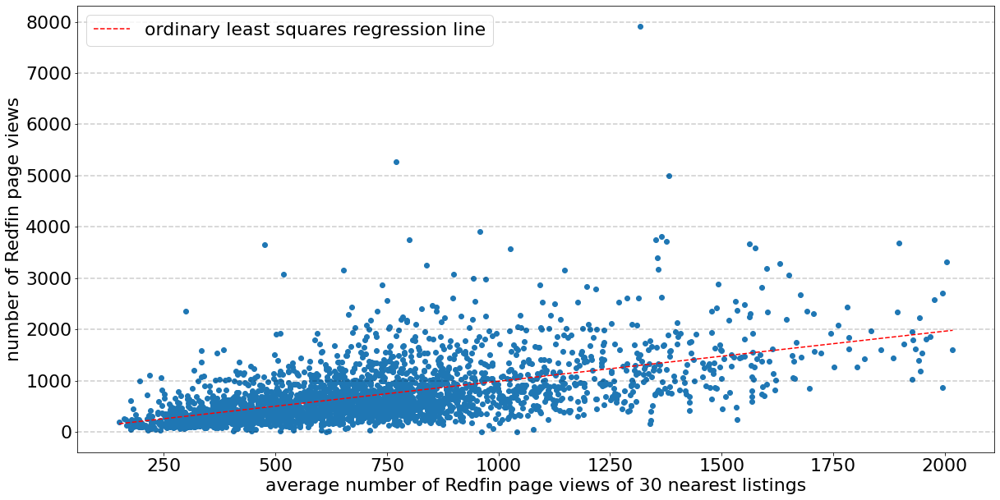

In [79]:
# Plot from random market
austin_df = model_df_f[model_df_f['market_area'] == 'Austin']
austin_df_f = austin_df.sample(frac=0.3, random_state=123)
plt.figure(figsize=(20, 10))
plt.scatter(austin_df_f['avg_views_30'], austin_df_f['page_views'])
formula = 'page_views ~ avg_views_30'
ols_model = smf.ols(formula, austin_df_f).fit()
austin_df_f_sorted = austin_df_f.sort_values('avg_views_30')
page_views_preds = ols_model.predict(austin_df_f_sorted)
plt.plot(austin_df_f_sorted['avg_views_30'], page_views_preds, color='r', linestyle='--', 
         label='ordinary least squares regression line')
plt.xlabel('average number of Redfin page views of 30 nearest listings')
plt.ylabel('number of Redfin page views')
yticks = plt.yticks()[0]
for ytick in yticks[1: -1]:
    plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)
plt.legend()
plt.show()

In [80]:
model_df_f.groupby('market_area')['null_redfin_price_estimate'].mean().reset_index().sort_values(
    'null_redfin_price_estimate')

,market_area,null_redfin_price_estimate
6,Cleveland,0.007576
22,Pittsburgh,0.007589
30,Virginia Beach,0.020419
13,Houston,0.051745
0,Atlanta,0.053893
2,Boston,0.055989
20,Philadelphia,0.132714
10,Denver,0.144536
28,Seattle,0.158539
17,Los Angeles,0.164395


From paper: "The issue with this way of formulating the model, however, is that it assumes there’s a linear relationship between each control variable and the number of page views. While we saw that this assumption is valid for the variables that measure the average number of page views of the nearest listings, there’s no reason to believe that a linear relationship exists for the other control variables. Therefore, all the other continuous control variables were split into ten dummy variables, each corresponding to a different decile. These continuous control variables include year built, the asking price, the market share of the listing brokerage and the percent difference between the asking price and the Redfin price estimate."

In [81]:
def get_cdf(model_df, column):
    market_column_to_cdf_df = pd.DataFrame()
    for market_area in sorted_market_areas:
        market_area_df = model_df[(model_df['market_area'] == market_area) &
                                  (model_df[column].notna())]
        vc = market_area_df[column].value_counts().sort_index().reset_index()
        vc.columns = [column, 'count']
        vc[f'{column}_cdf'] = vc['count'].cumsum() / len(market_area_df)
        column_to_cdf_df = vc[[column, f'{column}_cdf']]
        
        # for missing Redfin price estimates, impute the CDF value corresponding to a percent price difference
        # of zero
        if column == 'price_difference_pct':
            column_to_cdf_df2 = column_to_cdf_df.copy()
            column_to_cdf_df2[column] = column_to_cdf_df2[column].apply(lambda x: abs(x))
            zero_cdf = column_to_cdf_df2.sort_values(column).iloc[0][f'{column}_cdf']
            column_to_cdf_df.loc[len(column_to_cdf_df)] = [np.nan, zero_cdf]
        column_to_cdf_df['market_area'] = market_area
        market_column_to_cdf_df = pd.concat([market_column_to_cdf_df, column_to_cdf_df])
    model_df = model_df.merge(market_column_to_cdf_df, on=['market_area', column], how='inner')   
    return model_df

def get_range(cdf):
    """Convert CDF to decile."""
    for i in range(10):
        percentile = (i + 1) / 10
        if cdf <= percentile:
            return i

In [82]:
model_df2 = model_df_f.copy()
columns_to_get_cdf = ['price', 'year_built', 'price_difference_pct']
for column in columns_to_get_cdf:
    model_df2 = get_cdf(model_df2, column) 

In [83]:
for column in columns_to_get_cdf:
    model_df2[f'{column}_range'] = model_df2[f'{column}_cdf'].apply(get_range)

In [84]:
major_brokerages = [
    'berkshire hathaway', 'exp realty', 'redfin', 'compass', 'century 21', 'coldwell banker'  
]

def process_brokerage(brokerage):
    for major_brokerage in major_brokerages:
        if brokerage.startswith(major_brokerage):
            return major_brokerage
    if brokerage.startswith(('remax', 're/max')):
        return 'remax'
    if brokerage.startswith(('keller williams', 'kw')):
        return 'keller williams'
    return brokerage

model_df2['processed_brokerage'] = model_df2['brokerage'].apply(process_brokerage)

In [85]:
model_df2['processed_brokerage'].value_counts().iloc[:15]

keller williams                   27303
remax                             20539
coldwell banker                   13185
compass                           10337
berkshire hathaway                 6564
exp realty                         6478
century 21                         5893
redfin                             4032
@properties                        3652
opendoor brokerage, llc            2403
long & foster real estate, inc     2311
baird & warner                     1830
samson properties                  1027
first team real estate              878
realty austin                       867
Name: processed_brokerage, dtype: int64

In [86]:
major_national_brokerages = [
    'keller williams', 'remax', 'coldwell banker', 'compass', 'berkshire hathaway', 'exp realty', 
    'century 21', 'redfin'
]

model_df2.loc[
    ~model_df2['processed_brokerage'].isin(major_national_brokerages), 'processed_brokerage'] = 'none'

In [87]:
d = {'processed_brokerage': model_df2['processed_brokerage'].unique()}

brokerage_to_index_df = pd.DataFrame.from_dict(d).reset_index().rename(columns={'index': 'brokerage_index'})

In [88]:
model_df3 = model_df2.merge(brokerage_to_index_df, on='processed_brokerage', how='inner')
model_df4 = model_df3.drop(columns=['processed_brokerage'])

In [89]:
market_area_to_listings_df = model_df4.groupby(
    'market_area')['external_id'].count().reset_index().rename(columns={'external_id': 'listings'})

In [90]:
# estimate the market share of each brokerage in the given market
brokerage_to_listings_df = model_df4.groupby(
    ['market_area', 'brokerage'])['external_id'].count().reset_index().rename(
    columns={'external_id': 'brokerage_listings'})
brokerage_to_listings_df = brokerage_to_listings_df.merge(
    market_area_to_listings_df, on='market_area', how='inner')

brokerage_to_listings_df['brokerage_listings_pct'] = (brokerage_to_listings_df['brokerage_listings'] / 
                                                      brokerage_to_listings_df['listings'])
brokerage_to_listings_df.sort_values('brokerage_listings_pct', ascending=False, inplace=True)

In [91]:
model_df4 = model_df4.merge(brokerage_to_listings_df[['market_area', 'brokerage', 'brokerage_listings_pct']],
                            on=['market_area', 'brokerage'], how='inner')

In [92]:
model_df_temp = model_df4.sort_values('brokerage_listings_pct', ascending=False)

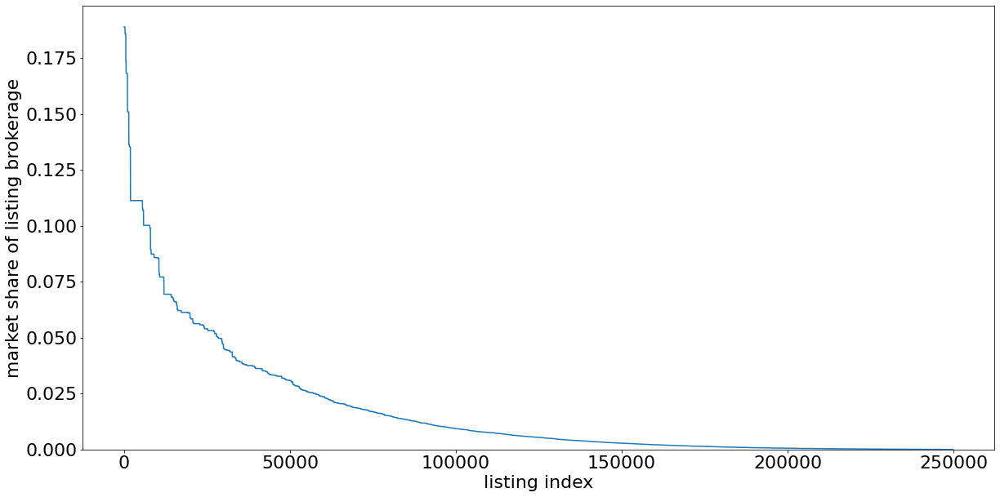

In [93]:
plt.figure(figsize=(20, 10))
plt.plot(np.array(model_df_temp['brokerage_listings_pct']))
plt.xlabel('listing index')
plt.ylabel('market share of listing brokerage')
plt.ylim(bottom=0)
plt.show()

In [94]:
model_df5 = get_cdf(model_df4, 'brokerage_listings_pct') 
model_df5['brokerage_listings_pct_range'] = model_df5['brokerage_listings_pct_cdf'].apply(get_range)

## Info about buy-side commissions below 2%

In [95]:
below_2_commissions = model_df5[model_df5['buyside_commission_range'] == 3]['buyside_commission']

In [96]:
below_2_commissions.median()

1.5

In [97]:
(below_2_commissions >= 1.5).sum() / len(below_2_commissions)

0.5696465696465697

In [98]:
len(below_2_commissions) / len(model_df5)

0.009626391924237693

In [99]:
(below_2_commissions >= 1).sum() / len(below_2_commissions)

0.9022869022869023

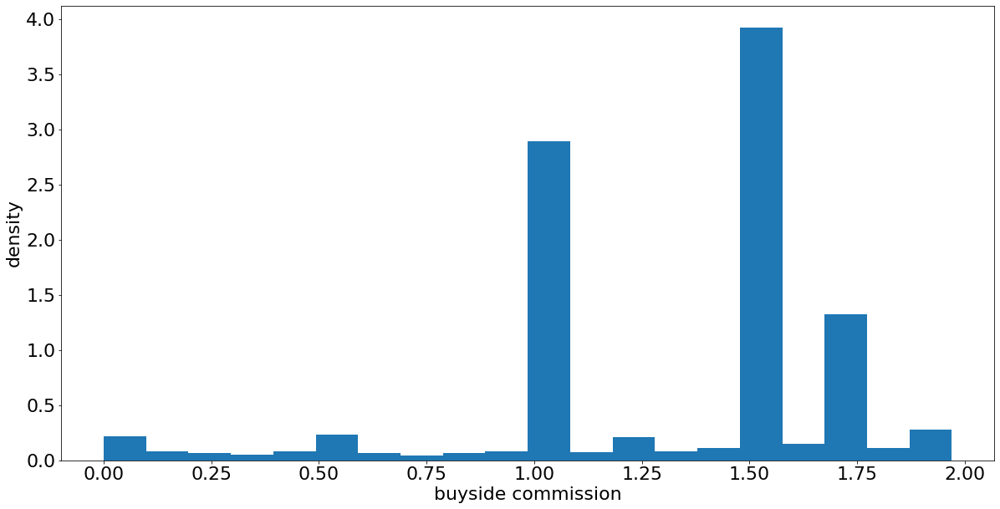

In [100]:
plt.figure(figsize=(20, 10))
plt.hist(below_2_commissions, bins=20, density=True)
plt.xlabel('buyside commission')
plt.ylabel('density')
plt.show()

## scale views data

In [101]:
going_rate_df = model_df5[model_df5['buyside_commission_range'] == 0]
market_area_to_mean_going_rate_page_views_df = going_rate_df.groupby(
    'market_area')['page_views'].mean().reset_index().sort_values('page_views').rename(
    columns={'page_views': 'mean_going_rate_page_views'})

In [102]:
market_area_to_mean_going_rate_page_views_df

,market_area,mean_going_rate_page_views
19,Orlando,171.798221
6,Cleveland,199.898138
16,Kansas City,227.489626
29,St. Louis,227.740065
13,Houston,241.766403
7,Columbus,253.580984
14,Indianapolis,262.438713
22,Pittsburgh,262.997243
15,Jersey Shore,289.842175
12,Hartford,290.945515


In [103]:
model_df6 = model_df5.merge(market_area_to_mean_going_rate_page_views_df, on='market_area', how='inner')

In [104]:
model_df6['scaled_page_views'] = 100 * model_df6['page_views'] / model_df6['mean_going_rate_page_views']

In [105]:
count_df = model_df6.groupby(['market_area', 'buyside_commission_range']).agg(
    {'scaled_page_views': 'mean', 'hoa': 'count'}).reset_index().rename(
    columns={'market_area': 'Market', 'buyside_commission_range': 'Commission rate category',
             'scaled_page_views': 'Average page views as of 8 days', 'hoa': 'Number of listings'})

count_df['Commission rate category'].replace(
{
    0: 'At least going rate',
    1: 'Just below going rate',
    2: 'At least 2%',
    3: 'Below 2%'
}, inplace=True)

count_df['Average page views as of 8 days'] = count_df['Average page views as of 8 days'].round(1)

In [106]:
count_df

,Market,Commission rate category,Average page views as of 8 days,Number of listings
0,Atlanta,At least going rate,100.0,13059
1,Atlanta,Just below going rate,100.5,2261
2,Atlanta,At least 2%,95.7,2029
3,Atlanta,Below 2%,77.9,56
4,Austin,At least going rate,100.0,8601
5,Austin,Just below going rate,91.7,1185
6,Austin,At least 2%,91.0,187
7,Austin,Below 2%,75.7,20
8,Boston,At least going rate,100.0,12374
9,Boston,Below 2%,83.1,182


In [107]:
model_df7 = model_df6.drop(columns=['page_views', 'mean_going_rate_page_views'])

In [108]:
model_df7['buyside_commission_range'].value_counts()

0    208514
2     25361
1     13554
3      2405
Name: buyside_commission_range, dtype: int64

In [109]:
columns_to_drop = [
    'external_id', 'created_date', 'address', 'zipcode', 'latitude', 'longitude', 'latitude_radians',
    'longitude_radians', 'beds', 'baths', 'sqft', 'redfin_price_estimate', 'brokerage', 'price', 
    'page_saves', 'days_on_site', 'year_built', 'buyside_commission', 'price_difference_pct', 
    'brokerage_listings_pct'
]

columns_to_drop.extend([column for column in model_df7.columns if column.endswith('cdf')])

In [110]:
model_df_final_f = model_df7.drop(columns=columns_to_drop).sort_values('market_area').reset_index(drop=True)

## Bayesian hierarchical linear regression model

In [111]:
model_df_final_f['market_area'].value_counts()

Chicago              32528
Los Angeles          27440
Houston              18108
Atlanta              17405
DC metro area        16503
Philadelphia         13465
Boston               12556
Dallas               12521
Austin                9993
Orange County         9972
West Palm Beach       8591
Fort Lauderdale       7343
Camden                6792
Jersey Shore          6632
Denver                6552
Seattle               6295
Portland, OR          5233
St. Louis             4588
San Diego             4299
Virginia Beach        3820
Kansas City           2597
Pittsburgh            2372
Phoenix               2315
Columbus              2114
Indianapolis          2101
Orlando               1589
Hartford              1465
Buffalo               1334
Cleveland             1188
Research-Triangle      974
Providence             688
San Antonio            461
Name: market_area, dtype: int64

In [112]:
len(model_df_final_f)

249834

In [113]:
model_df_final_f['buyside_commission_range'].value_counts() / len(model_df_final_f)

0    0.834610
2    0.101511
1    0.054252
3    0.009626
Name: buyside_commission_range, dtype: float64

In [114]:
model_df_final_f['null_redfin_price_estimate'].mean()

0.2858778228743886

In [115]:
market_area_to_index_df = pd.DataFrame.from_dict({'market_area': sorted_market_areas})
market_area_to_index_df['market_area_index'] = market_area_to_index_df.index

market_area_num = len(market_area_to_index_df)

In [116]:
model_df_final_f = model_df_final_f.merge(market_area_to_index_df, on='market_area', how='inner')

In [117]:
scaled_page_views = model_df_final_f['scaled_page_views'].to_numpy()
market_area_indices = model_df_final_f['market_area_index'].to_numpy()

In [118]:
model_df_final_f.head()

,city,state,hoa,market_area,null_redfin_price_estimate,buyside_commission_range,created_month_index,avg_views_5,avg_views_10,avg_views_30,avg_views_40,avg_views_100,avg_views_200,price_range,year_built_range,price_difference_pct_range,brokerage_index,brokerage_listings_pct_range,scaled_page_views,market_area_index
0,NaN,GA,0,Atlanta,0,0,1,506.293427,602.044769,508.701962,494.580194,536.004787,613.769625,9,4,9,0,5,42.491964,0
1,Marietta,GA,0,Atlanta,0,2,0,562.792489,470.468274,536.429955,526.842116,505.046875,477.630075,0,3,9,0,0,32.208521,0
2,Lithonia,GA,0,Atlanta,0,2,1,454.549044,478.742699,555.454892,525.708691,487.264739,501.917422,2,5,8,0,0,9.507334,0
3,Snellville,GA,0,Atlanta,0,0,0,520.400000,630.500000,552.121452,543.049214,489.009556,487.702676,0,3,2,0,0,62.691092,0
4,Alpharetta,GA,0,Atlanta,0,0,1,785.268370,729.903721,1047.709709,1033.570020,1078.133623,1065.609766,4,6,5,0,0,137.415768,0


In [119]:
commission_vals = len(model_df_final_f['buyside_commission_range'].unique())
range_vals = len(model_df_final_f['brokerage_listings_pct_range'].unique())
created_month_vals = len(model_df_final_f['created_month_index'].unique())
top_brokerage_vals = len(model_df_final_f['brokerage_index'].unique())

In [120]:
sigma_prior = 1000

np.random.seed(5555)
with pm.Model() as model:
    mu_comm = pm.Normal('mu_comm', mu=0, sigma=100, shape=commission_vals)
    sigma_comm = pm.Exponential('sigma_comm', lam=0.001, shape=commission_vals)
    comm_offset = pm.Normal('comm_offset', mu=0, sigma=1, shape=(market_area_num, commission_vals))
    b_comm = pm.Deterministic('b_comm', mu_comm + comm_offset * sigma_comm)
    
    sigma_b = pm.Exponential('sigma_b', lam=0.001, shape=9)

    b_intercept = pm.Normal('b_intercept', mu=0, sigma=sigma_b[0], shape=market_area_num)
    b_hoa = pm.Normal('b_hoa', mu=0, sigma=sigma_b[1], shape=market_area_num)
    b_avg_views_5 = pm.Normal('b_avg_views_5', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_10 = pm.Normal('b_avg_views_10', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_30 = pm.Normal('b_avg_views_30', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_40 = pm.Normal('b_avg_views_40', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_100 = pm.Normal('b_avg_views_100', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_200 = pm.Normal('b_avg_views_200', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_null_price = pm.Normal('b_null_price', mu=0, sigma=sigma_b[2], shape=market_area_num)
    b_price = pm.Normal('b_price', mu=0, sigma=sigma_b[3], shape=(market_area_num, range_vals))
    b_year_built = pm.Normal('b_year_built', mu=0, sigma=sigma_b[4], shape=(market_area_num, range_vals))
    b_price_difference_pct = pm.Normal('b_price_difference_pct', mu=0, sigma=sigma_b[5], 
                                       shape=(market_area_num, range_vals))
    b_brokerage = pm.Normal('b_brokerage', mu=0, sigma=sigma_b[6], shape=(market_area_num, top_brokerage_vals))
    b_brokerage_listings_pct = pm.Normal('b_brokerage_listings_pct', mu=0, sigma=sigma_b[7], 
                                         shape=(market_area_num, range_vals))
    b_created_month = pm.Normal('b_created_month', mu=0, sigma=sigma_b[8], 
                                shape=(market_area_num, created_month_vals))

    lin_pred_func = pm.Deterministic(
        'lin_pred_func', 
        b_intercept[market_area_indices] +
        b_comm[market_area_indices, model_df_final_f['buyside_commission_range'].values] +
        b_hoa[market_area_indices] * model_df_final_f['hoa'] + 
        b_avg_views_5[market_area_indices] * model_df_final_f['avg_views_5'] + 
        b_avg_views_10[market_area_indices] * model_df_final_f['avg_views_10'] + 
        b_avg_views_30[market_area_indices] * model_df_final_f['avg_views_30'] +
        b_avg_views_40[market_area_indices] * model_df_final_f['avg_views_40'] +
        b_avg_views_100[market_area_indices] * model_df_final_f['avg_views_100'] +
        b_avg_views_200[market_area_indices] * model_df_final_f['avg_views_200'] +
        b_null_price[market_area_indices] * model_df_final_f['null_redfin_price_estimate'] + 
        b_price[market_area_indices, model_df_final_f['price_range'].values] + 
        b_year_built[market_area_indices, model_df_final_f['year_built_range'].values] + 
        b_price_difference_pct[market_area_indices, model_df_final_f['price_difference_pct_range'].values] + 
        b_brokerage[market_area_indices, model_df_final_f['brokerage_index'].values] + 
        b_brokerage_listings_pct[market_area_indices, model_df_final_f['brokerage_listings_pct_range'].values] +
        b_created_month[market_area_indices, model_df_final_f['created_month_index'].values]
    ) 

    epsilon_sigma = pm.Exponential('epsilon_sigma', lam=0.001, shape=market_area_num)

    page_views = pm.Normal(
        'scaled_page_views', mu=lin_pred_func, sigma=epsilon_sigma[market_area_indices], 
        observed=scaled_page_views)

Note: It takes over 43 hours for the sampler to run, as shown in the screenshot below, so feel free to simply load the trace in the following cell.

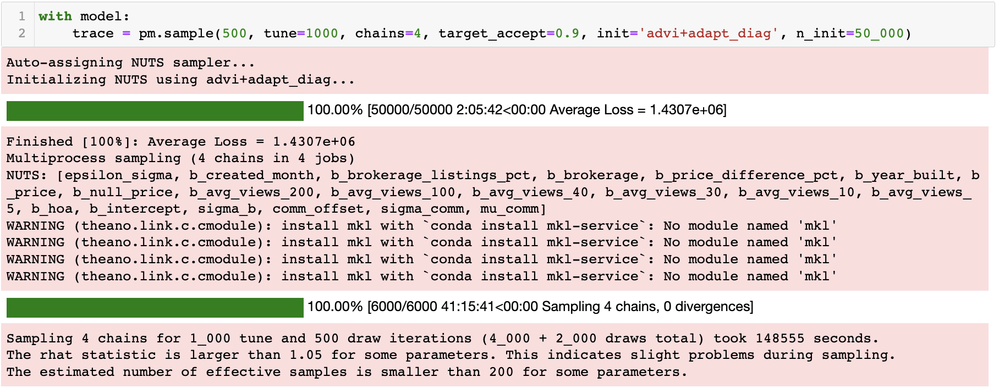

In [135]:
rerun_sampler = False

In [136]:
# load trace  
with model:
    if rerun_sampler:
        trace = pm.sample(500, tune=1000, chains=4, target_accept=0.9, init='advi+adapt_diag', n_init=50_000)
    else:
        trace = pm.load_trace('model_trace')

In [137]:
var_names = [
    'epsilon_sigma', 'b_brokerage_listings_pct', 'b_brokerage', 'b_price_difference_pct',
    'b_year_built', 'b_price', 'b_avg_views_5', 'b_avg_views_10', 'b_avg_views_30', 'b_avg_views_40',
    'b_avg_views_100', 'b_avg_views_200', 'b_created_month', 'sigma_b', 'b_null_price', 'b_hoa', 
    'b_intercept', 'b_comm', 'sigma_comm', 'mu_comm']

with model:
    summary_df = pm.summary(trace, var_names=var_names).round(4)

In [138]:
summary_df.shape

(2321, 9)

In [139]:
# confirm that MCMC sampler has converged (the vast majority of r_hat values should be very close to 1)
summary_df['r_hat'].value_counts()

1.00    1191
1.01     583
1.02     278
1.03     132
1.04      92
1.05      43
1.12       1
1.06       1
Name: r_hat, dtype: int64

In [140]:
mu_comm_samples = trace['mu_comm']
going_rate_samples = mu_comm_samples[:, 0]

In [141]:
i_to_title = {
    1: 'Commission rate category $\mathregular{c_2}$',
    2: 'Commission rate category $\mathregular{c_3}$',
    3: 'Commission rate category $\mathregular{c_4}$'
}

[-7.76108368 -2.45364461]
0.0005


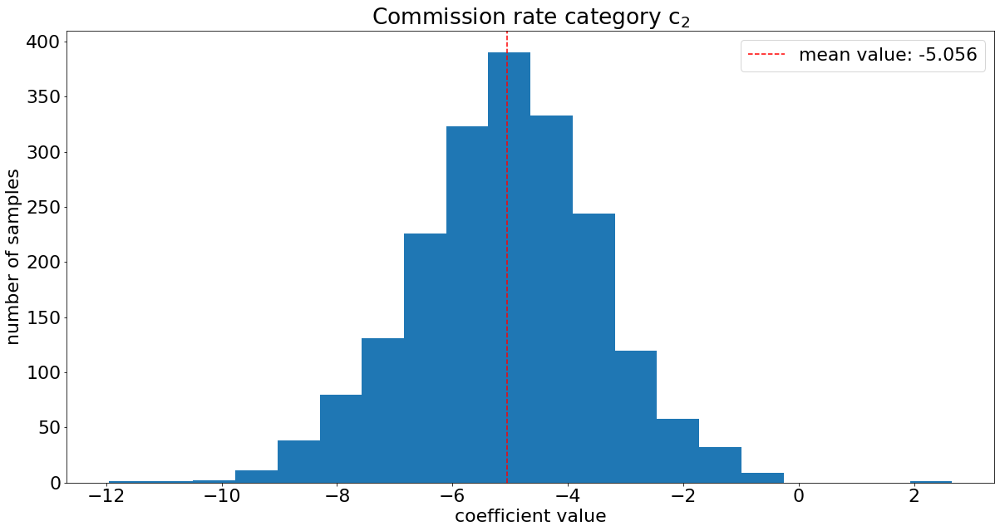

[-5.56364238 -2.45379991]
0.0005


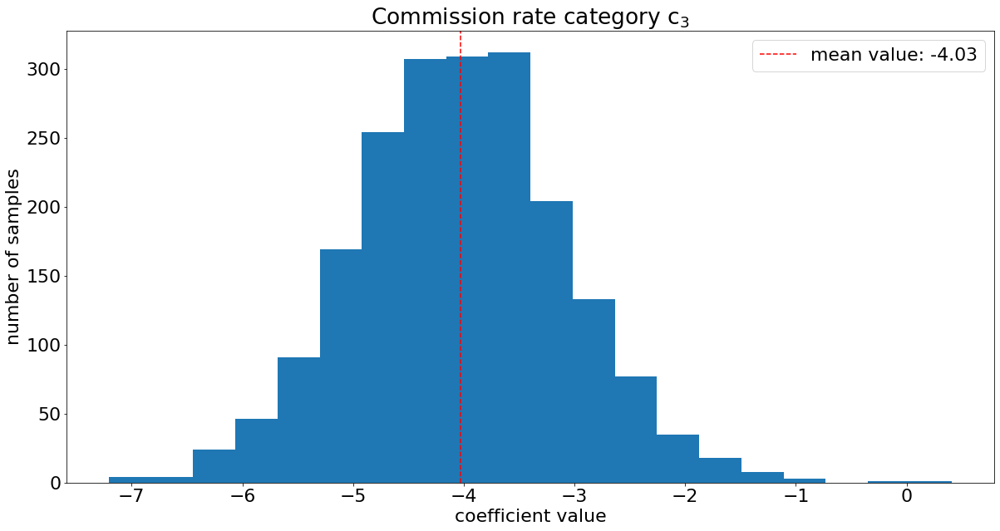

[-12.16043059  -6.85224711]
0.0


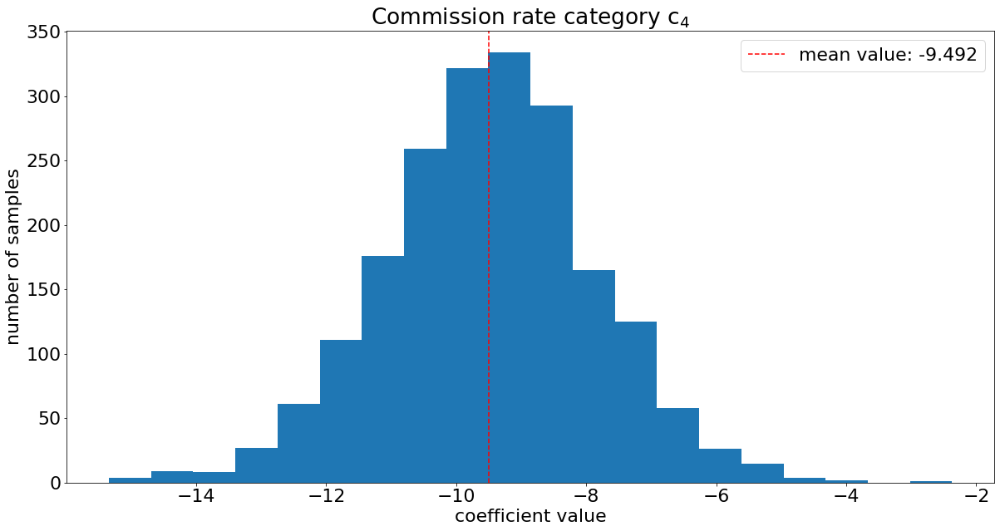

In [142]:
alpha = 0.1
for i in range(3):
    plt.figure(figsize=(20, 10))
    sample_diffs = mu_comm_samples[:, i + 1] - going_rate_samples
    print(np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)]))
    print(np.mean(sample_diffs > 0))
    plt.hist(sample_diffs, bins=20)
    plt.xlabel('coefficient value')
    plt.ylabel('number of samples')
    plt.axvline(x=sample_diffs.mean(), color='r', linestyle='--', 
                label=f'mean value: {round(sample_diffs.mean(), 3)}')
    plt.title(i_to_title[i + 1])
    plt.legend()
    plt.show()

Calculate 3 pairwise differences:

In [143]:
diff_alpha = 0.05
sample_diffs_21 = mu_comm_samples[:, 2] - mu_comm_samples[:, 1]
print(sample_diffs_21.mean())
print(np.quantile(sample_diffs_21, [diff_alpha / 2, 1 - (diff_alpha / 2)]))

1.0260702957230396
[-2.60591854  4.55764082]


In [144]:
sample_diffs_31 = mu_comm_samples[:, 3] - mu_comm_samples[:, 1]
print(sample_diffs_31.mean())
print(np.quantile(sample_diffs_31, [diff_alpha / 2, 1 - (diff_alpha / 2)]))

-4.436125941314963
[-8.81028545  0.04057656]


In [145]:
alpha_5_2 = 0.052
sample_diffs_31 = mu_comm_samples[:, 3] - mu_comm_samples[:, 1]
print(sample_diffs_31.mean())
print(np.quantile(sample_diffs_31, [alpha_5_2 / 2, 1 - (alpha_5_2 / 2)]))

-4.436125941314963
[-8.79730241 -0.01596844]


In [146]:
sample_diffs_32 = mu_comm_samples[:, 3] - mu_comm_samples[:, 2]
print(sample_diffs_32.mean())
print(np.quantile(sample_diffs_32, [diff_alpha / 2, 1 - (diff_alpha / 2)]))

-5.462196237038003
[-9.00952152 -1.99252036]


In [147]:
b_comm_samples = trace['b_comm']

In [148]:
b_comm_samples.shape

(2000, 32, 4)

In [149]:
# calculate summary statistics
alpha = 0.1
national_going_rate_samples = mu_comm_samples[:, 0]
overall_lst = []

lst = ['national']
for i in range(3):
    sample_diffs = mu_comm_samples[:, i + 1] - national_going_rate_samples
    mean_diff = np.mean(sample_diffs)
    quantiles = np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)])
    lst.extend([mean_diff] + list(quantiles) + [(sample_diffs >= 0).mean()])

overall_lst.append(lst)

for market_area_index in range(market_area_num):
    market_area = market_area_to_index_df[
        market_area_to_index_df['market_area_index'] == market_area_index]['market_area'].iloc[0]
    market_area_samples = b_comm_samples[:, market_area_index, :]
    going_rate_samples = market_area_samples[:, 0]
    lst = [market_area]
    for i in range(1, 4):
        samples = market_area_samples[:, i]
        sample_diffs = samples - going_rate_samples
        mean_diff = np.mean(sample_diffs)
        quantiles = np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)])
        lst.extend([mean_diff] + list(quantiles) + [(sample_diffs >= 0).mean()])
    overall_lst.append(lst)

columns = ['market_area', 'mean1', 'lower1', 'upper1', 'pvalue1', 'mean2', 'lower2', 'upper2', 'pvalue2',
           'mean3', 'lower3', 'upper3', 'pvalue3']
effect_df = pd.DataFrame(overall_lst, columns=columns)
effect_df['is_national'] = effect_df['market_area'].apply(lambda x: int(x == 'national'))

In [150]:
effect_df.head()

,market_area,mean1,lower1,upper1,pvalue1,mean2,lower2,upper2,pvalue2,mean3,lower3,upper3,pvalue3,is_national
0,national,-5.056358,-7.761084,-2.453645,0.0005,-4.030288,-5.563642,-2.453800,0.0005,-9.492484,-12.160431,-6.852247,0.0000,1
1,Atlanta,-1.826745,-4.310736,0.660475,0.1120,-8.557222,-11.514564,-5.610598,0.0000,-9.913561,-14.653709,-4.516807,0.0050,0
2,Austin,-8.148906,-11.255423,-5.183986,0.0000,-4.883376,-9.123908,-0.732694,0.0270,-10.690583,-16.612057,-6.074877,0.0015,0
3,Boston,-4.944681,-13.018475,3.177694,0.1400,-3.900824,-9.311608,1.604384,0.1160,-8.622444,-12.698810,-4.011145,0.0015,0
4,Buffalo,-2.393302,-7.833226,3.357764,0.2325,-4.842644,-10.269913,0.330936,0.0650,-9.563398,-14.941517,-4.285125,0.0060,0


In [151]:
for i in range(1, 4):
    show_df = effect_df[effect_df['market_area'].isin(
        model_df_final_f[model_df_final_f['buyside_commission_range'] == i]['market_area'].unique())][
        ['market_area'] + [col for col in effect_df.columns if col.endswith(str(i))]]
    
    show_df.sort_values('market_area', inplace=True)
    
    def get_interval(row):
        lower = round(row[f'lower{i}'], 1)
        upper = round(row[f'upper{i}'], 1)
        return f'[{lower}%, {upper}%]'  
    
    show_df['90% interval'] = show_df.apply(get_interval, axis=1)
    show_df.drop(columns=[f'lower{i}', f'upper{i}'], inplace=True)
    show_df[f'mean{i}'] = show_df[f'mean{i}'].round(1)
    show_df[f'pvalue{i}'] = show_df[f'pvalue{i}'].round(2)
    show_df = show_df[['market_area', f'mean{i}', '90% interval', f'pvalue{i}']]
    print(len(show_df))
    display(show_df)

13


,market_area,mean1,90% interval,pvalue1
1,Atlanta,-1.8,"[-4.3%, 0.7%]",0.11
2,Austin,-8.1,"[-11.3%, -5.2%]",0.00
4,Buffalo,-2.4,"[-7.8%, 3.4%]",0.23
8,Columbus,-6.3,"[-12.4%, -0.2%]",0.04
10,Dallas,-7.6,"[-10.3%, -5.0%]",0.00
11,Denver,-4.7,"[-7.1%, -2.2%]",0.00
14,Houston,-10.3,"[-13.6%, -7.0%]",0.00
15,Indianapolis,-2.3,"[-6.4%, 2.0%]",0.18
17,Kansas City,-5.9,"[-10.6%, -1.3%]",0.02
24,"Portland, OR",-0.2,"[-3.8%, 3.5%]",0.45


28


,market_area,mean2,90% interval,pvalue2
1,Atlanta,-8.6,"[-11.5%, -5.6%]",0.00
2,Austin,-4.9,"[-9.1%, -0.7%]",0.03
4,Buffalo,-4.8,"[-10.3%, 0.3%]",0.06
5,Camden,-2.4,"[-5.7%, 1.2%]",0.13
6,Chicago,-2.4,"[-4.4%, -0.3%]",0.03
7,Cleveland,-5.1,"[-10.1%, -0.5%]",0.04
8,Columbus,-2.3,"[-7.0%, 3.2%]",0.22
9,DC metro area,-1.2,"[-3.9%, 1.7%]",0.25
10,Dallas,-4.0,"[-7.5%, -0.4%]",0.03
11,Denver,-2.7,"[-6.8%, 1.9%]",0.15


32


,market_area,mean3,90% interval,pvalue3
1,Atlanta,-9.9,"[-14.7%, -4.5%]",0.00
2,Austin,-10.7,"[-16.6%, -6.1%]",0.00
3,Boston,-8.6,"[-12.7%, -4.0%]",0.00
4,Buffalo,-9.6,"[-14.9%, -4.3%]",0.01
5,Camden,-9.5,"[-14.7%, -5.1%]",0.00
6,Chicago,-9.5,"[-14.6%, -4.9%]",0.00
7,Cleveland,-9.5,"[-14.3%, -4.2%]",0.01
8,Columbus,-7.9,"[-12.8%, -1.9%]",0.03
9,DC metro area,-9.0,"[-13.5%, -4.1%]",0.00
10,Dallas,-9.9,"[-14.9%, -5.2%]",0.00


In [152]:
def plot_effects(effect_df):
    just_under_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                               if len(cutoffs) == 3 and market_area in market_areas_to_consider]

    just_under_market_areas = ['national'] + just_under_market_areas

    above_2_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                            if cutoffs[0] != 2]

    above_2_market_areas = ['national'] + above_2_market_areas

    for i in range(1, 4):
        if i == 1:
            df = effect_df[effect_df['market_area'].isin(just_under_market_areas)]
        elif i == 2:
            df = effect_df[effect_df['market_area'].isin(above_2_market_areas)]
        else:
            df = effect_df.copy()
        df.sort_values(['is_national', f'upper{i}'], ascending=[False, True], inplace=True)
        
        
        plt.figure(figsize=(20, max(10, len(df) / 2)))
        y = [x for x in range(len(df), 0, -1)]
        x = df[f'mean{i}']
        xerr = (np.abs(df[[f'lower{i}', f'upper{i}']].to_numpy() -
                       df[f'mean{i}'].to_numpy().reshape(-1, 1)).T)
        is_significant = df[f'upper{i}'] < 0
        colors = ['g' if x else 'r' for x in is_significant]
        plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=colors, capsize=0, marker='o', markersize=10, 
                     ls='none')
        plt.axvline(x=0, linestyle='--', color='k')
        
        yticks = []
        for market_area in df['market_area']:
            if market_area == 'national':
                num_listings = len(model_df_final_f[model_df_final_f['buyside_commission_range'] == i])
            else:
                num_listings = len(model_df_final_f[(model_df_final_f['buyside_commission_range'] == i) &
                                                    (model_df_final_f['market_area'] == market_area)])
            
            yticks.append(f'{market_area} (N={num_listings})')
        
        plt.yticks(y, yticks)
        plt.xlabel('percent difference in Redfin page views relative to listings offering going rate commission')
        xticks = plt.xticks()[0]
        for xtick in xticks[1: -1]:
            plt.axvline(x=xtick, color='k', linestyle='-', alpha=0.2)
        plt.title(i_to_title[i])
        
        yticks = plt.yticks()[0]
        for ytick in yticks:
            plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)
        plt.show()

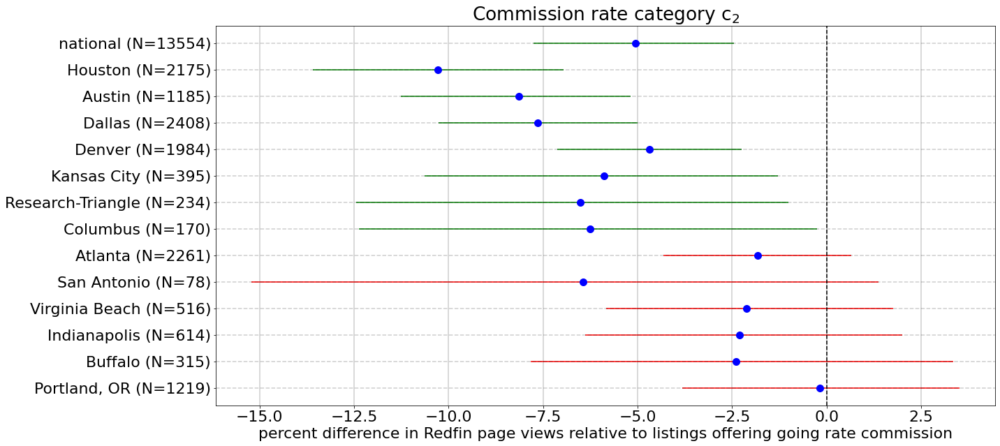

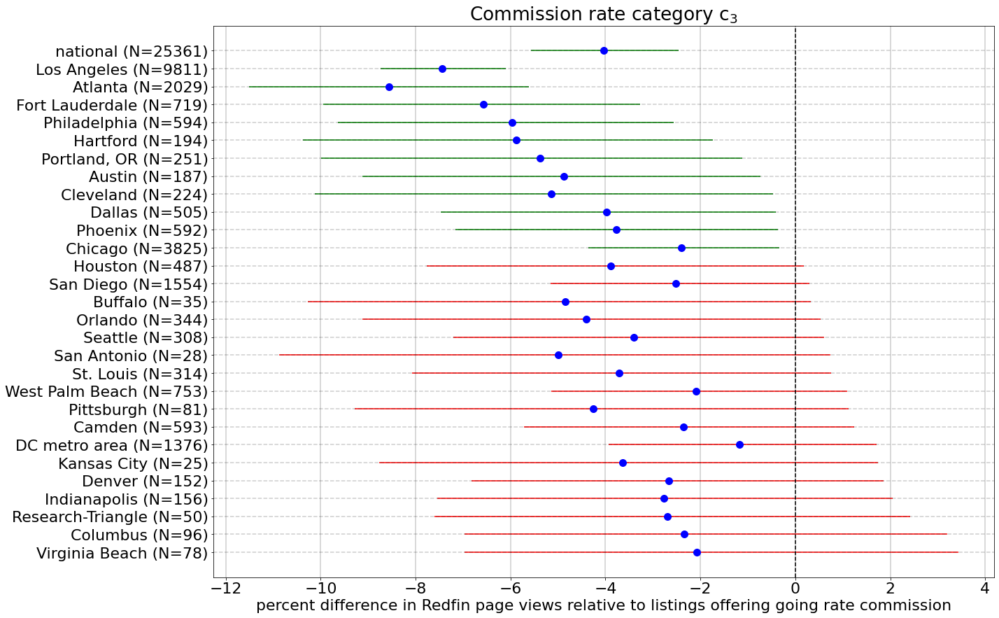

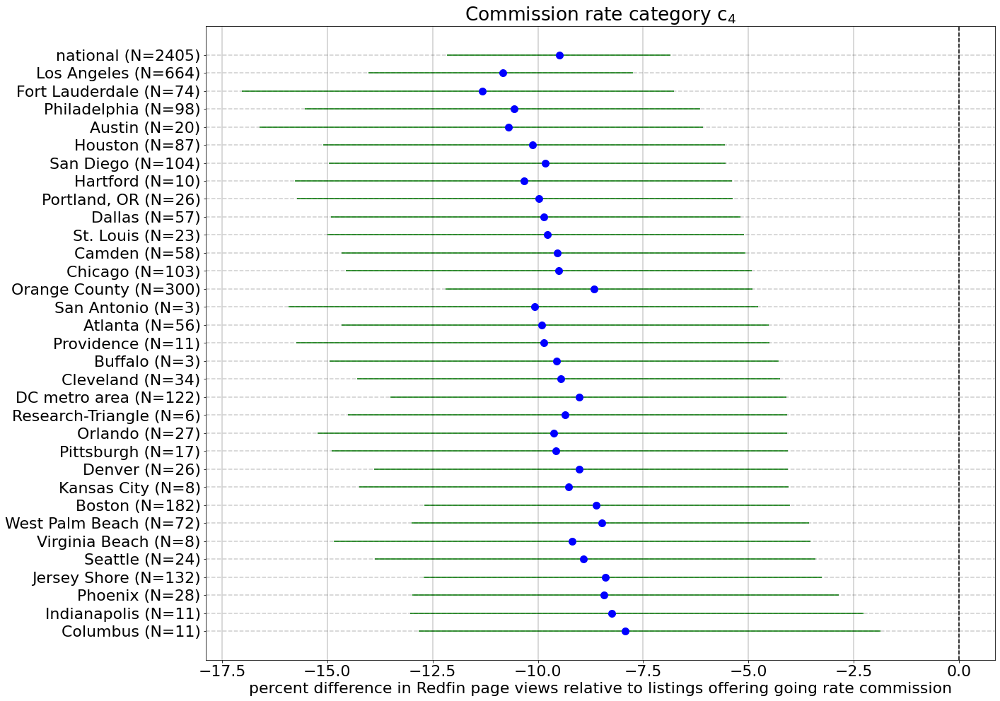

In [153]:
plot_effects(effect_df)

In [154]:
def plot_national_effects(effect_df):
    national_row = effect_df[effect_df['market_area'] == 'national']
    
    plt.figure(figsize=(20, 10))
    for i in range(1, 4):
        y = 4 - i
        x = national_row[f'mean{i}']
        xerr = (np.abs(national_row[[f'lower{i}', f'upper{i}']].to_numpy() -
                       national_row[f'mean{i}'].to_numpy().reshape(-1, 1)).T)
        is_significant = (national_row[f'upper{i}'] < 0).iloc[0]
        color = 'g' if is_significant else 'r'
        plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=color, capsize=0, marker='o', markersize=10, 
                     ls='none')
    plt.axvline(x=0, linestyle='--', color='k')
    plt.xlabel('percent difference in Redfin page views relative to listings offering going rate commission')
    xticks = plt.xticks()[0]
    first = 1 if i != 3 else 1
    for xtick in xticks[first: -1]:
        plt.axvline(x=xtick, color='k', linestyle='--', alpha=0.2)
        
    plt.ylabel('commission rate category')
    plt.yticks([1, 2, 3], ['$\mathregular{c_4}$', '$\mathregular{c_3}$', '$\mathregular{c_2}$'])

    plt.show()

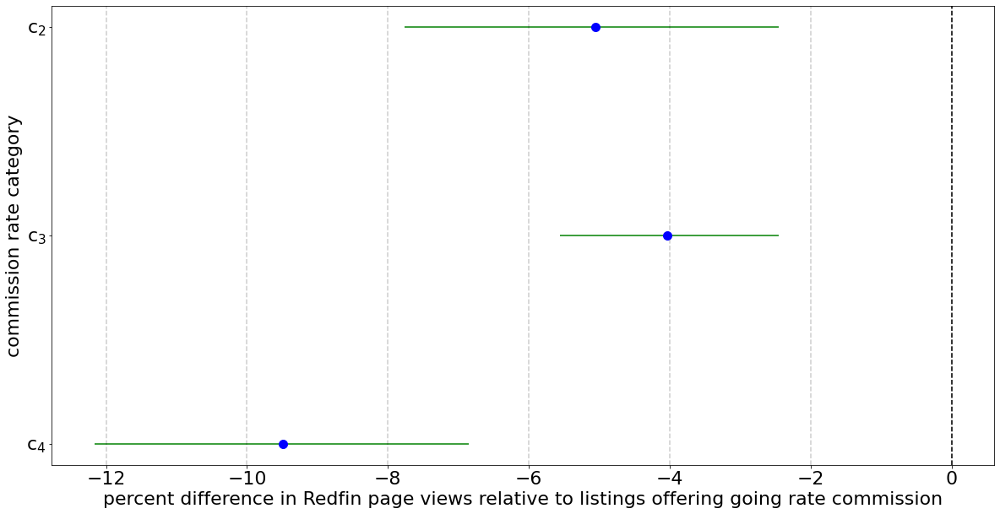

In [155]:
plot_national_effects(effect_df)

## regression diagnostics

In [161]:
with model:
    predicted_views = pm.sample_posterior_predictive(trace).get('scaled_page_views')

In [162]:
predicted_views_mean = np.mean(predicted_views, axis=0)
model_df_final_f['predicted_views'] = predicted_views_mean

In [163]:
model_df_final_f['residuals'] = model_df_final_f['scaled_page_views'] - model_df_final_f['predicted_views']

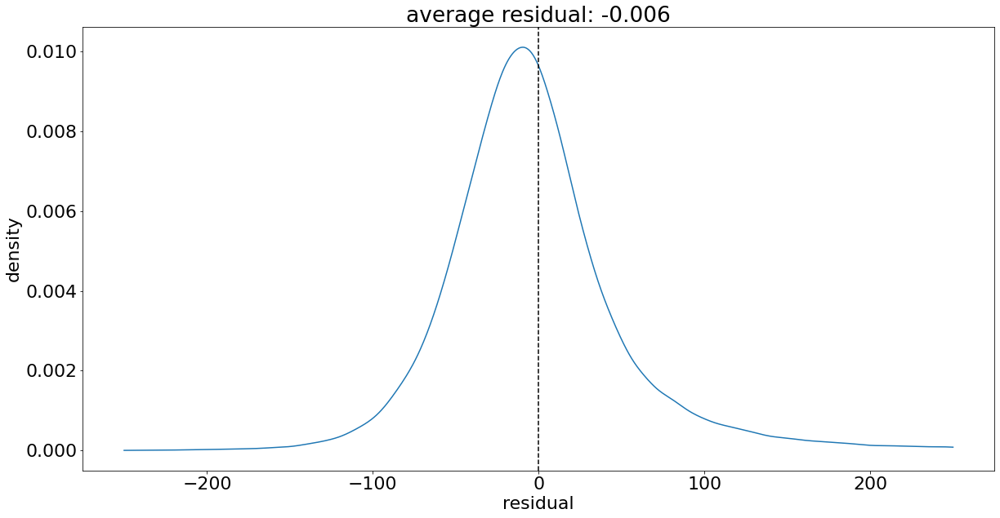

In [165]:
kde = gaussian_kde(model_df_final_f['residuals'])
resid_vals = np.linspace(-250, 250, 1000)
pdfs = kde.pdf(resid_vals)
plt.figure(figsize=(20, 10))
plt.plot(resid_vals, pdfs)
mean_residual = model_df_final_f['residuals'].mean()
plt.title(f'average residual: {round(mean_residual, 3)}')
plt.axvline(x=0, color='k', linestyle='--')
plt.xlabel('residual')
plt.ylabel('density')
plt.show()

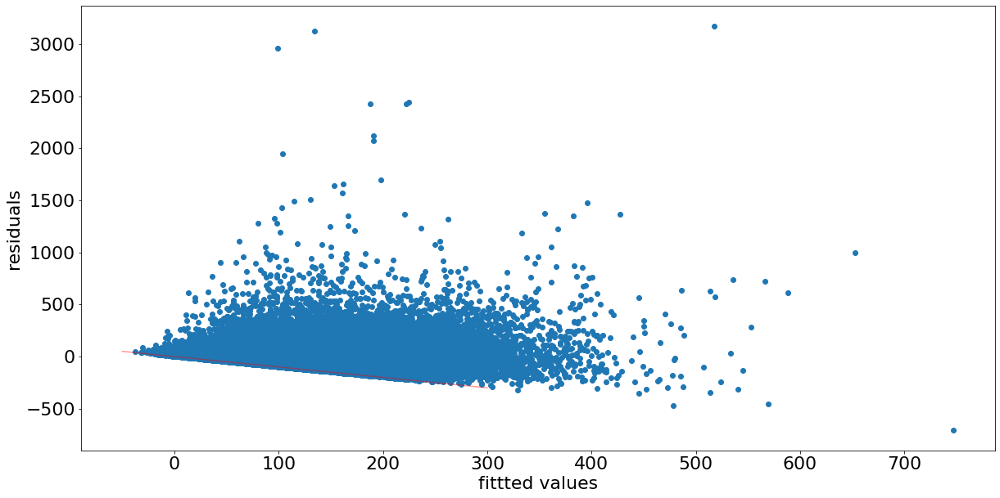

In [166]:
plt.figure(figsize=(20, 10))
plt.scatter(model_df_final_f['predicted_views'], model_df_final_f['residuals'])
plt.xlabel('fittted values')
plt.ylabel('residuals')
plt.plot([-50, 300], [50, -300], color='r', alpha=0.4)
plt.show()

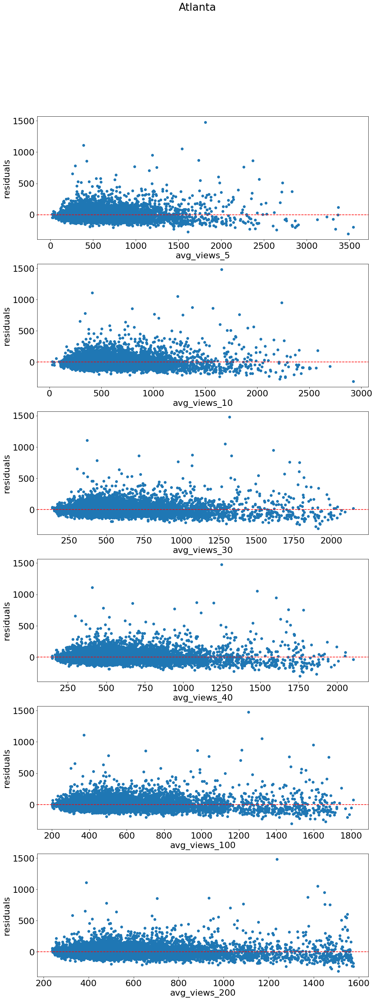

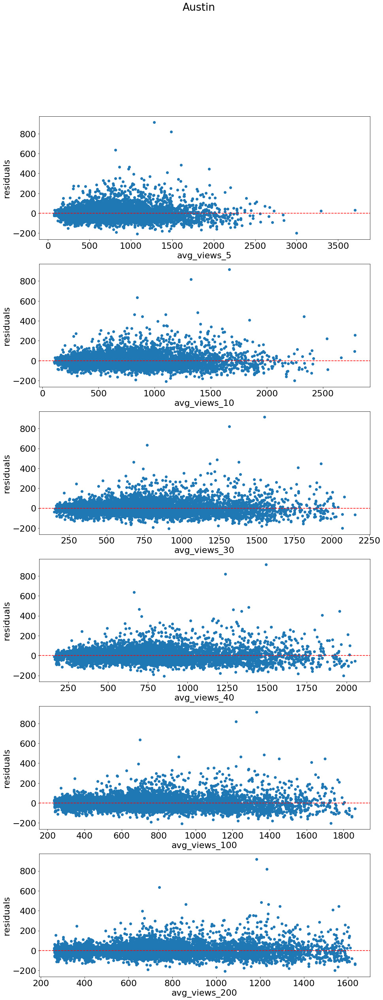

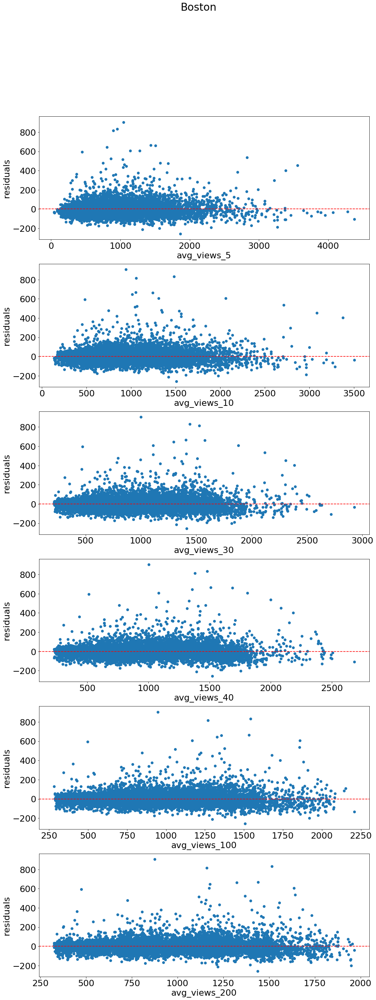

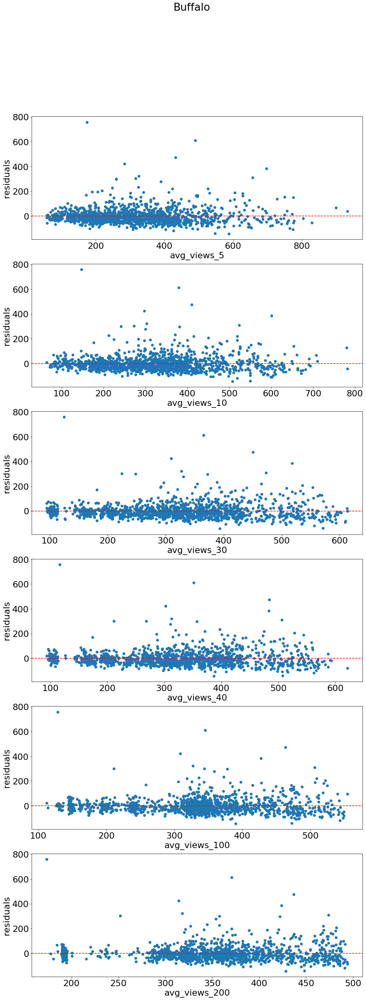

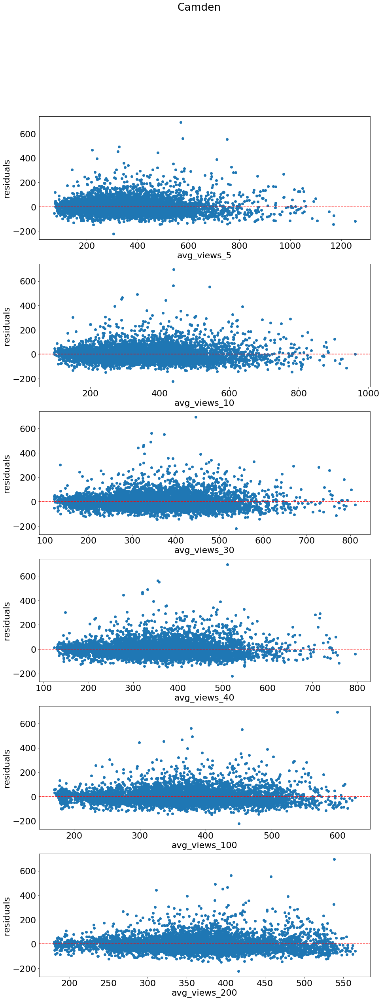

...

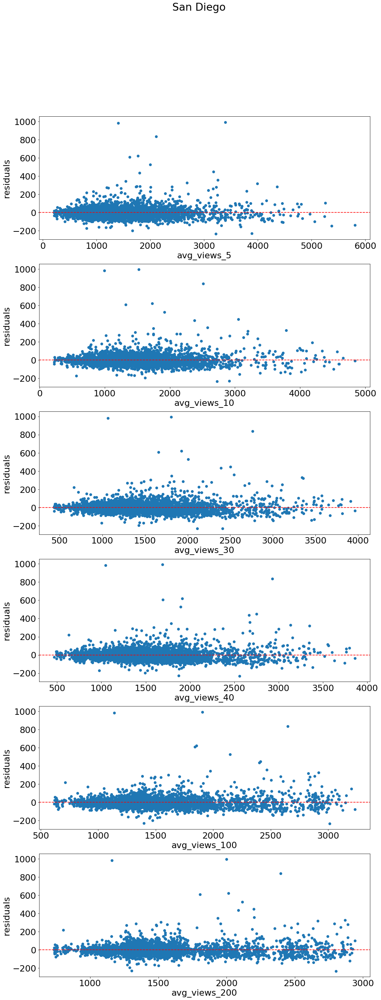

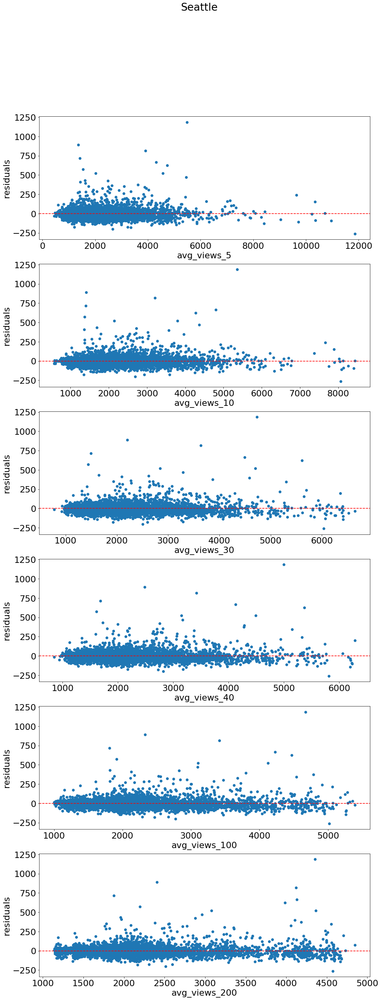

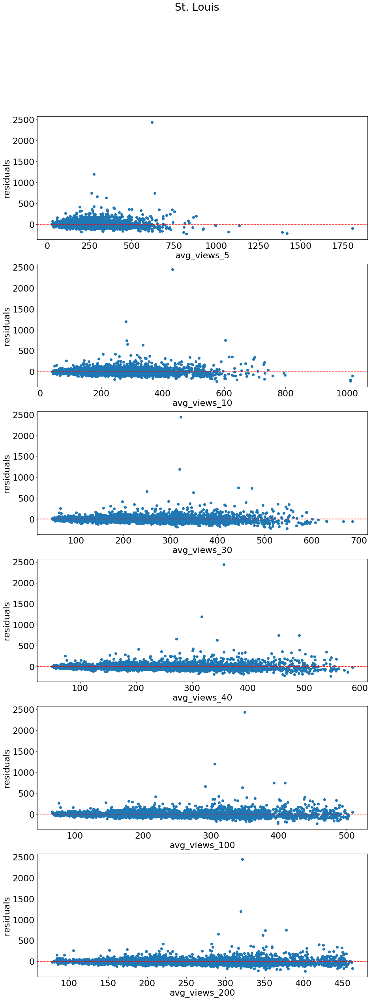

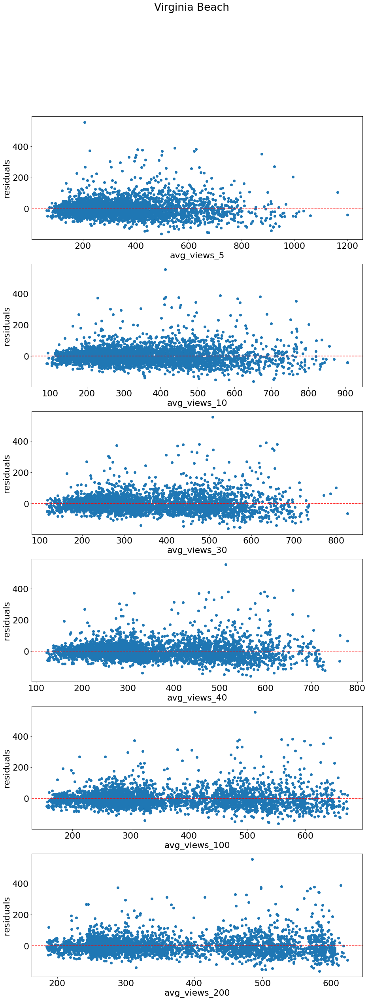

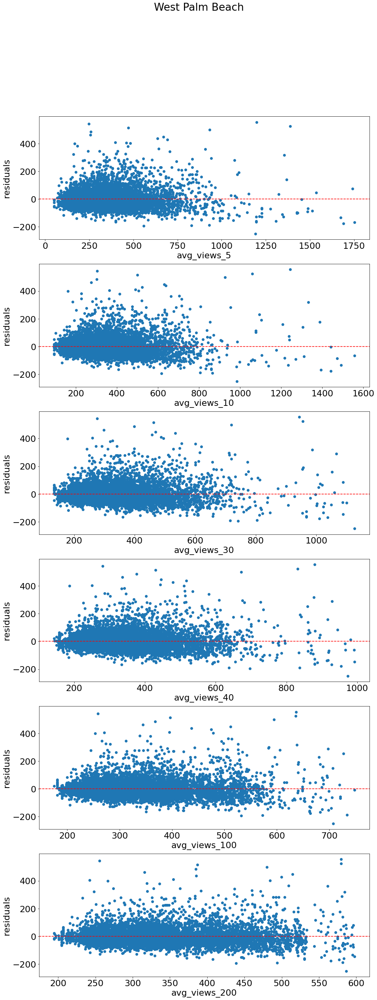

In [167]:
for market_area_index in range(market_area_num):
    market_area = market_area_to_index_df[
        market_area_to_index_df['market_area_index'] == market_area_index]['market_area'].iloc[0]
    market_area_df = model_df_final_f[model_df_final_f['market_area'] == market_area]
    fig, axs = plt.subplots(6, 1, figsize=(15, 40))
    for i, col in enumerate(['avg_views_5', 'avg_views_10', 'avg_views_30', 
                             'avg_views_40', 'avg_views_100', 'avg_views_200']):
        max_views = market_area_df[col].max()
        axs[i].scatter(market_area_df[col], market_area_df['residuals'])
        axs[i].set_xlabel(col)
        axs[i].set_ylabel('residuals')
        axs[i].axhline(y=0, color='r', linestyle='--')
    fig.suptitle(market_area) 
    plt.show()

## $R^2$

Followed the methodology described in the following paper: 

http://www.stat.columbia.edu/~gelman/research/unpublished/bayes_R2.pdf

In [168]:
epsilon_sigma_trace = trace['epsilon_sigma']
lin_pred_func_trace = trace['lin_pred_func']

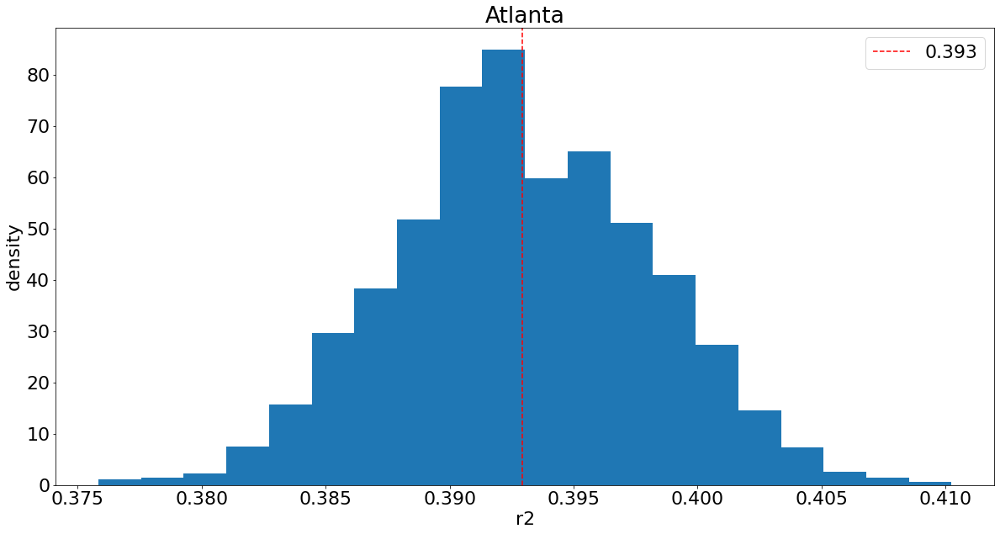

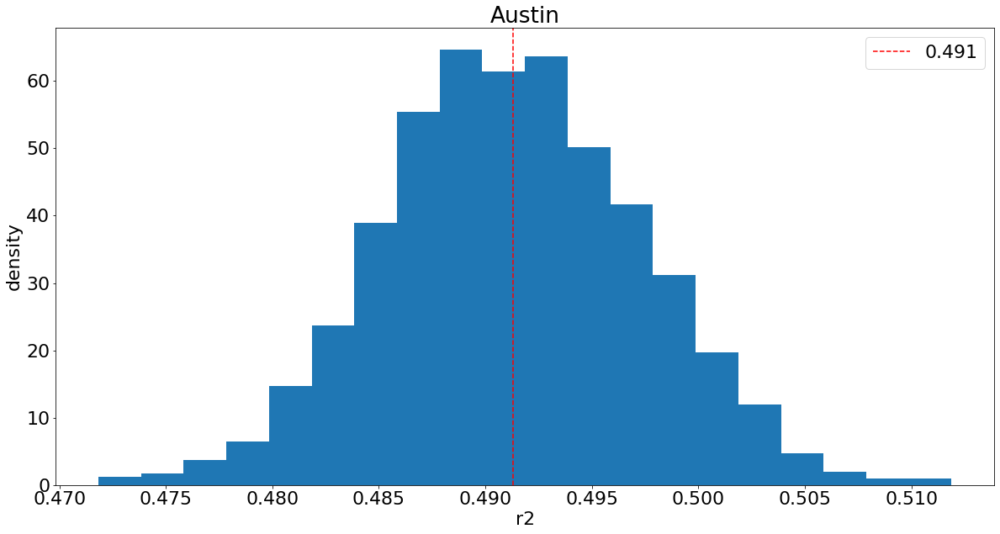

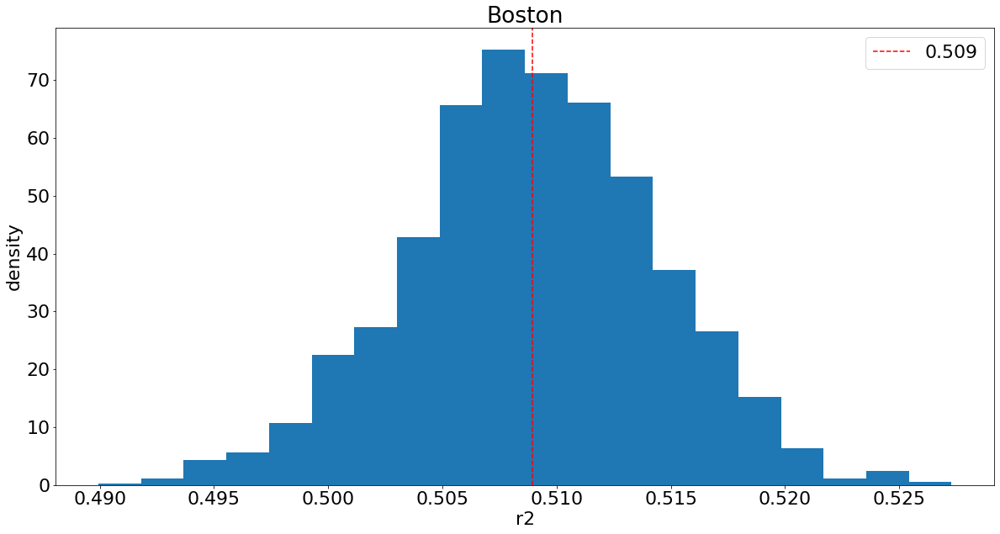

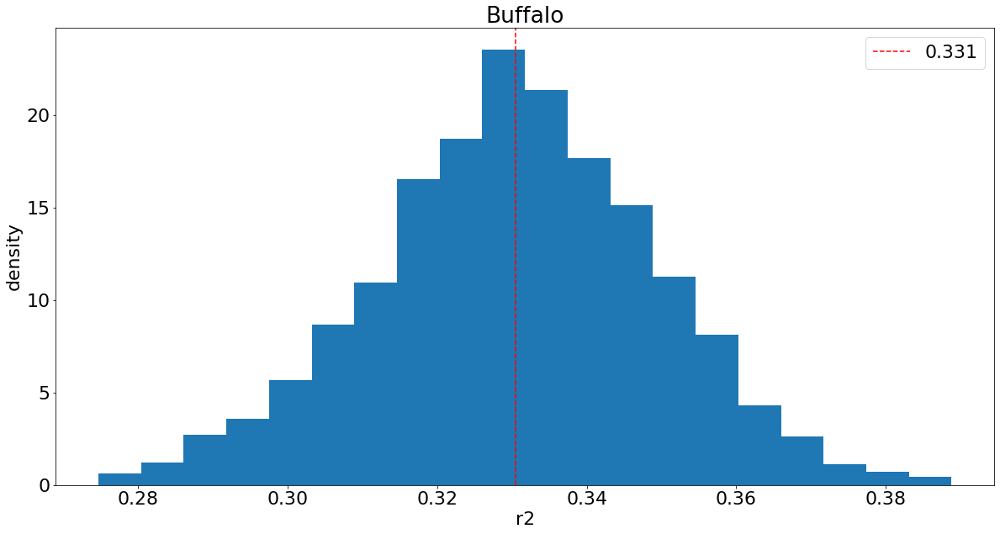

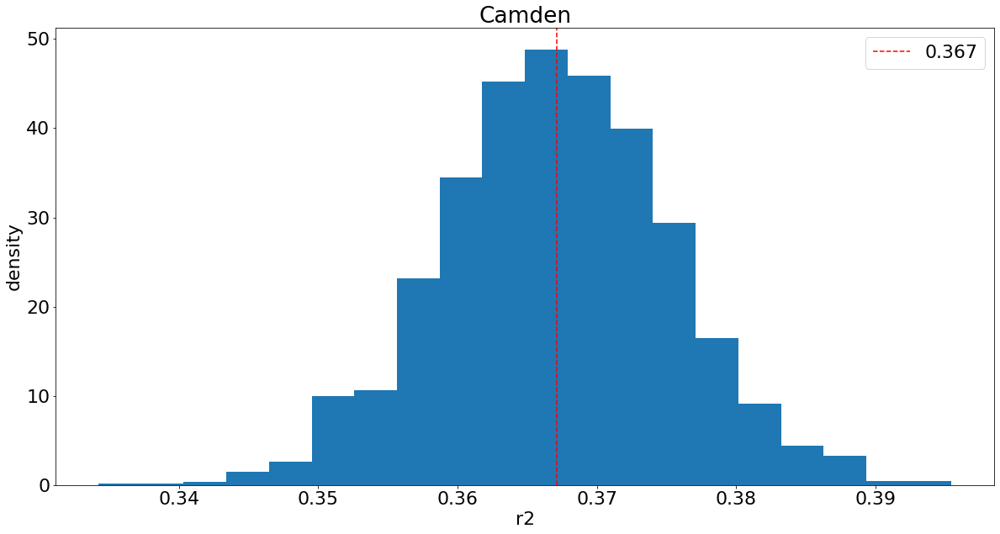

...

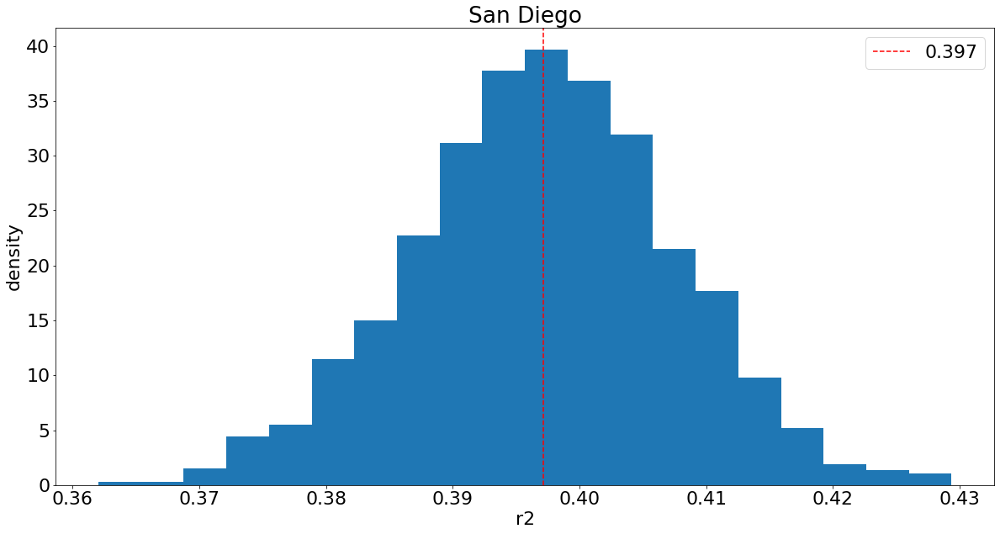

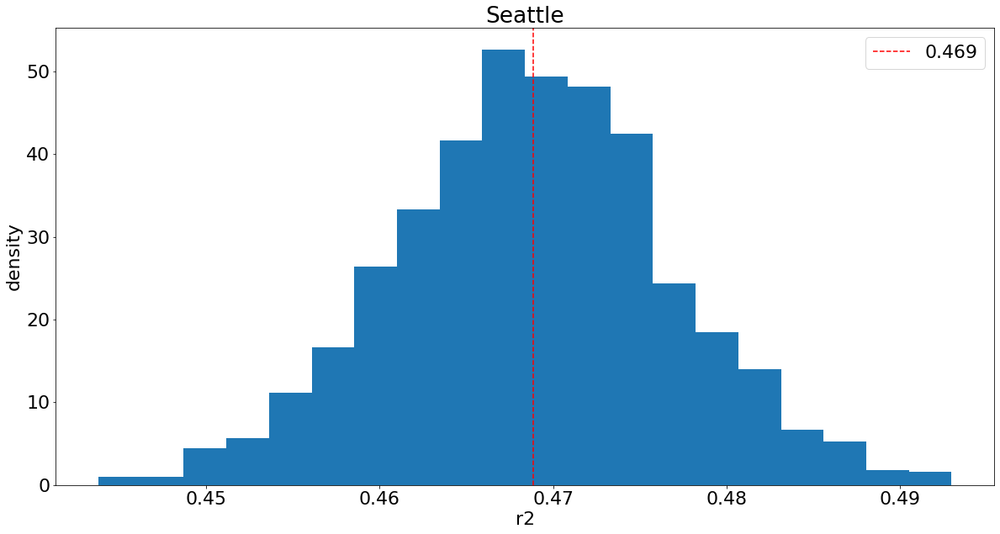

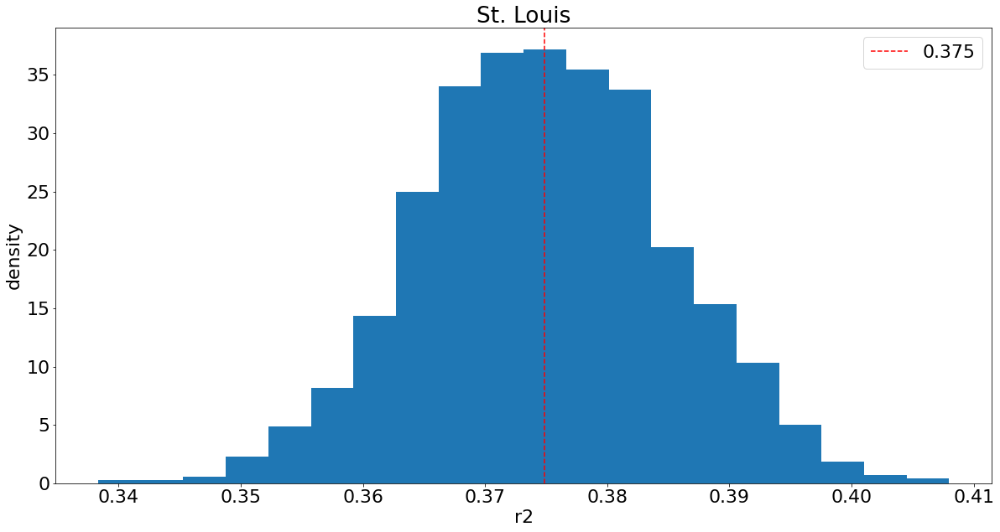

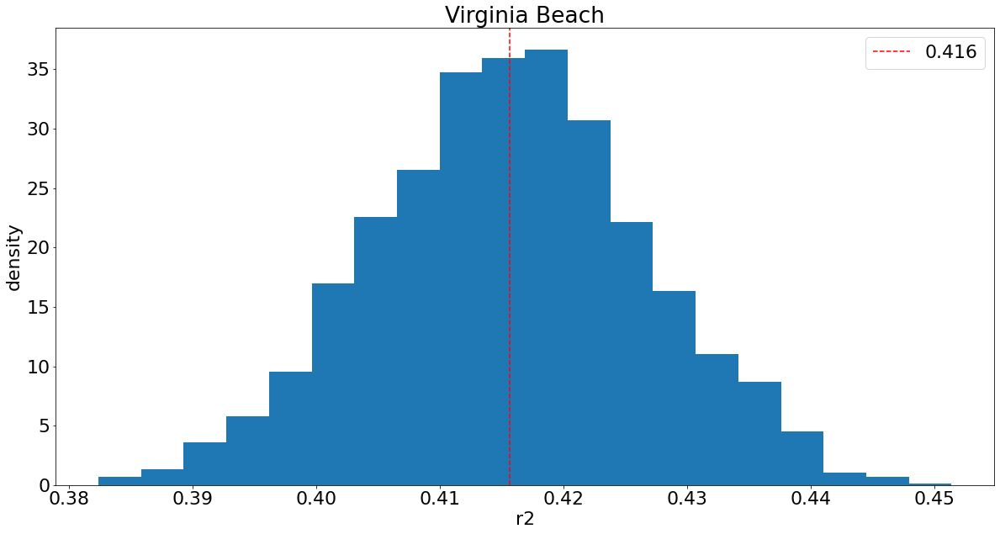

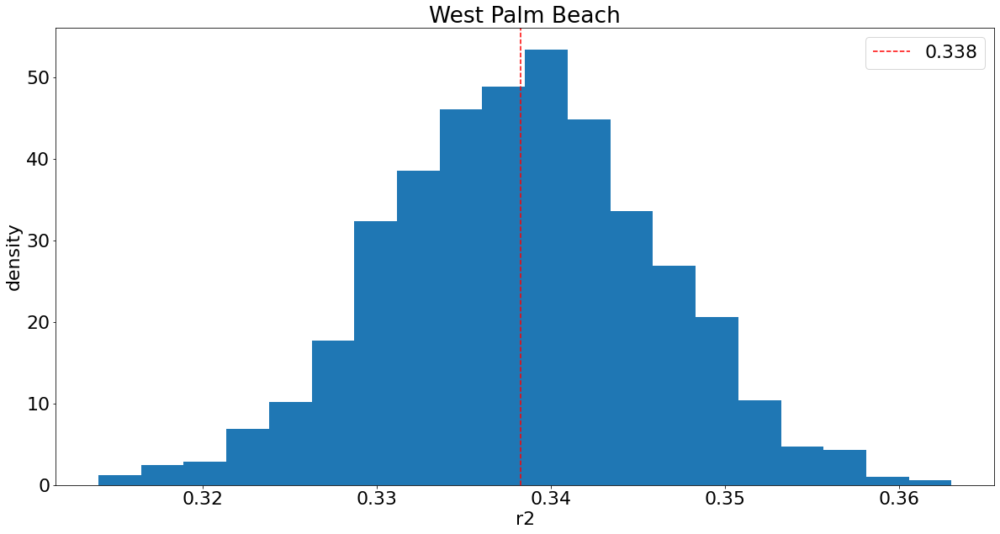

In [169]:
# calculate distribution of R^2 values for each market
for _, row in market_area_to_index_df.iterrows():
    market_area = row['market_area']
    market_area_index = row['market_area_index']
    sigma_samples = epsilon_sigma_trace[:, market_area_index]
    sigma_2_samples = sigma_samples ** 2
    lin_pred_func_samples = lin_pred_func_trace[:, market_area_indices == market_area_index]
    lin_pred_func_variances = np.var(lin_pred_func_samples, axis=1)
    r2_samples = lin_pred_func_variances / (lin_pred_func_variances + sigma_2_samples)
    mean_r2 = np.mean(r2_samples)
    
    plt.figure(figsize=(20, 10))
    plt.hist(r2_samples, bins=20, density=True)
    plt.xlabel('r2')
    plt.ylabel('density')
    plt.title(market_area)
    
    plt.axvline(x=mean_r2, color='r', linestyle='--', label=round(mean_r2, 3))
    plt.legend()
    plt.show()

## explore results

In [170]:
def plot_effect_of_variables(variable, x_label=None, y_label='beta coefficient value', alpha=0.05):

    b_samples_mat = trace[variable]
    
    for _, row in market_area_to_index_df.iterrows():
        market_area = row['market_area']
        market_area_index = row['market_area_index']
        b_samples = b_samples_mat[:, market_area_index, :]
        range_vals = b_samples.shape[1]

        null_frac = model_df_final_f[
            model_df_final_f['market_area'] == market_area]['null_redfin_price_estimate'].mean()
        
        if variable == 'b_price_difference_pct':
            print('fraction of homes with null Redfin price estimate:', round(null_frac, 3))
            
        plt.figure(figsize=(20, 10))
        x_vals = []
        y_vals = []
        y_err = np.zeros((2, range_vals - 1))
        for i in range(range_vals - 1):
            samples = b_samples[:, i + 1] - b_samples[:, 0]
            x_vals.append(i + 2)
            sample_mean = np.mean(samples)
            y_vals.append(sample_mean)
            quantiles = np.quantile(samples, [alpha / 2, 1 - (alpha / 2)])
            errors = np.abs(quantiles - sample_mean)
            y_err[:, i] = errors

        plt.errorbar(x=x_vals, y=y_vals, yerr=y_err, capsize=0, marker='o', markersize=10, ls='none')
        plt.xlabel(x_label)
        plt.ylabel(y_label)
        plt.title(market_area)

        yticks = plt.yticks()[0]
        for ytick in yticks[1: -1]:
                plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)

        plt.show()

fraction of homes with null Redfin price estimate: 0.054


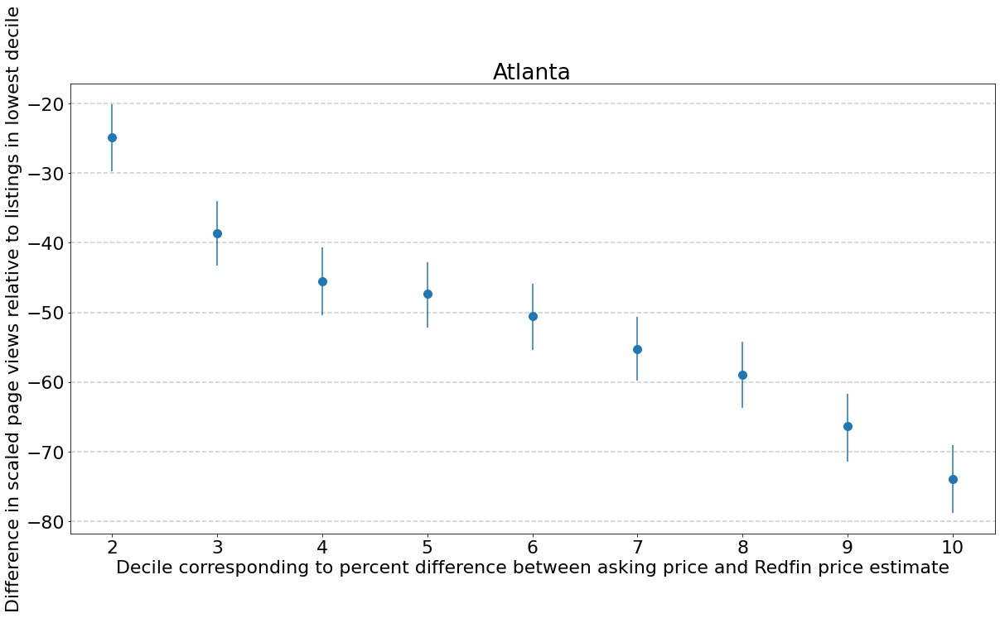

fraction of homes with null Redfin price estimate: 0.747


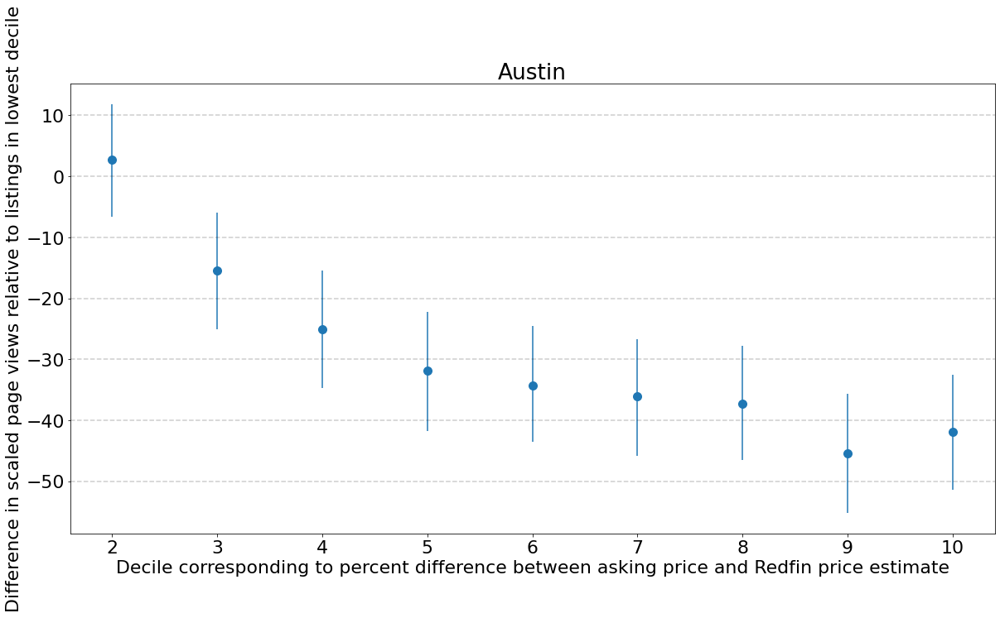

fraction of homes with null Redfin price estimate: 0.056


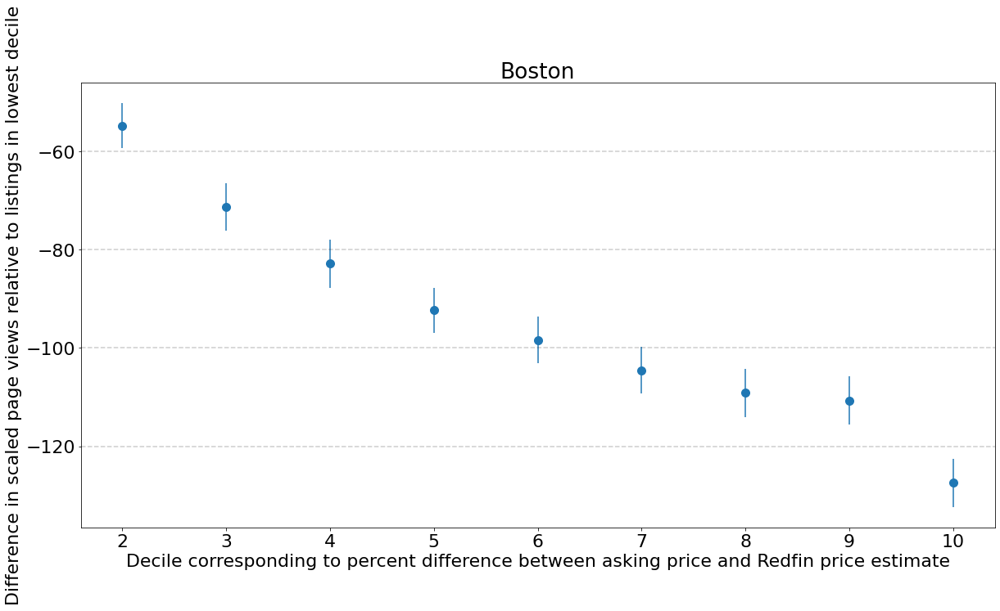

fraction of homes with null Redfin price estimate: 0.346


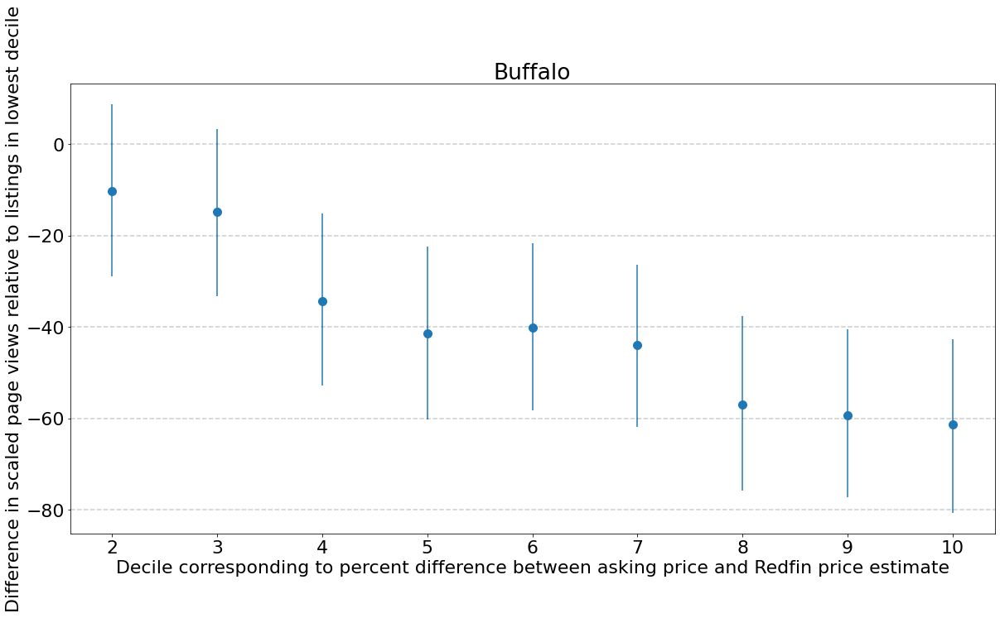

fraction of homes with null Redfin price estimate: 0.202


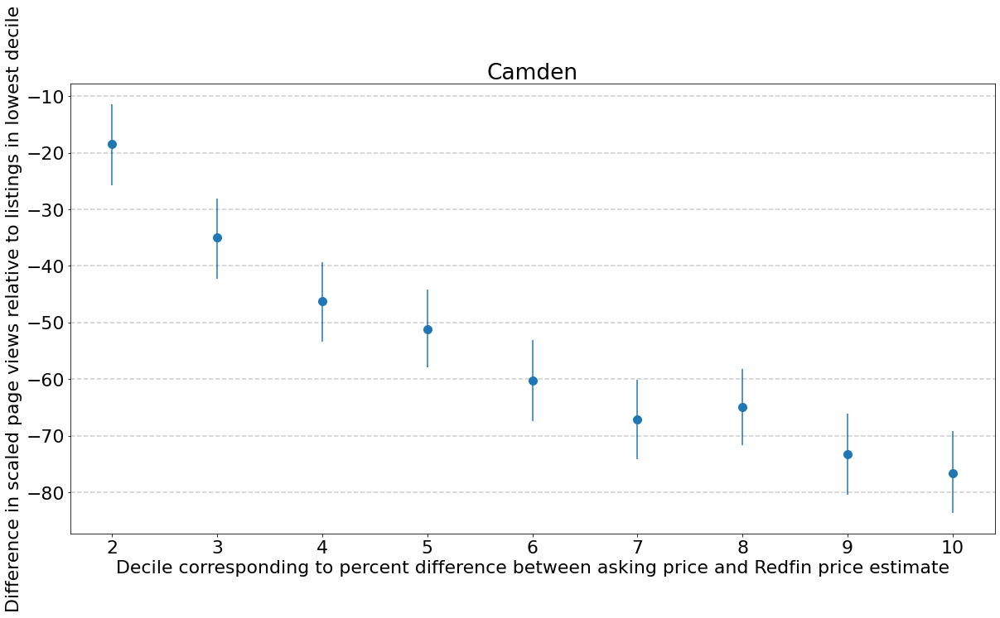

fraction of homes with null Redfin price estimate: 0.713


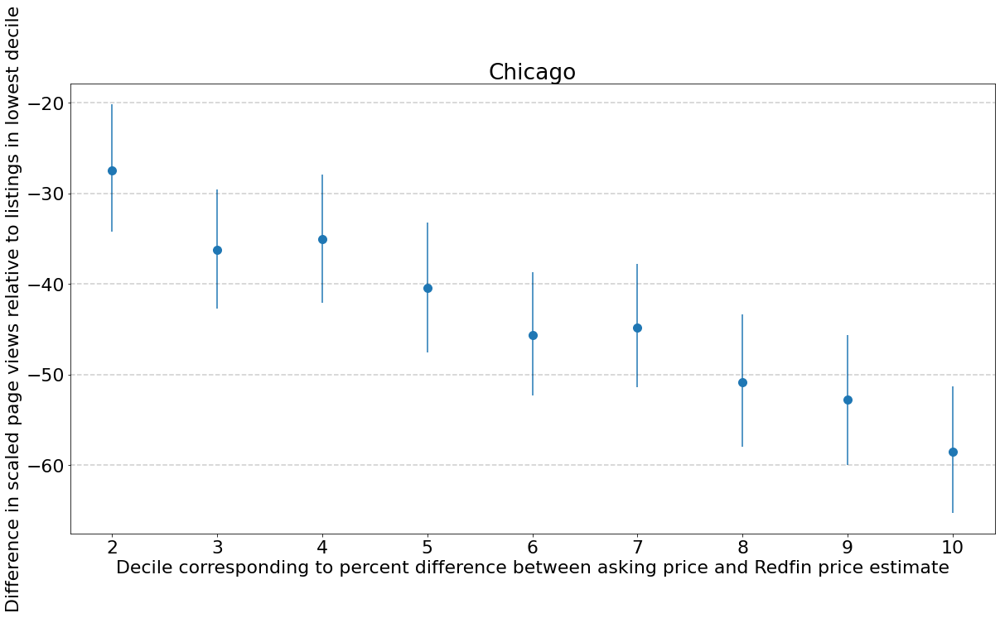

fraction of homes with null Redfin price estimate: 0.008


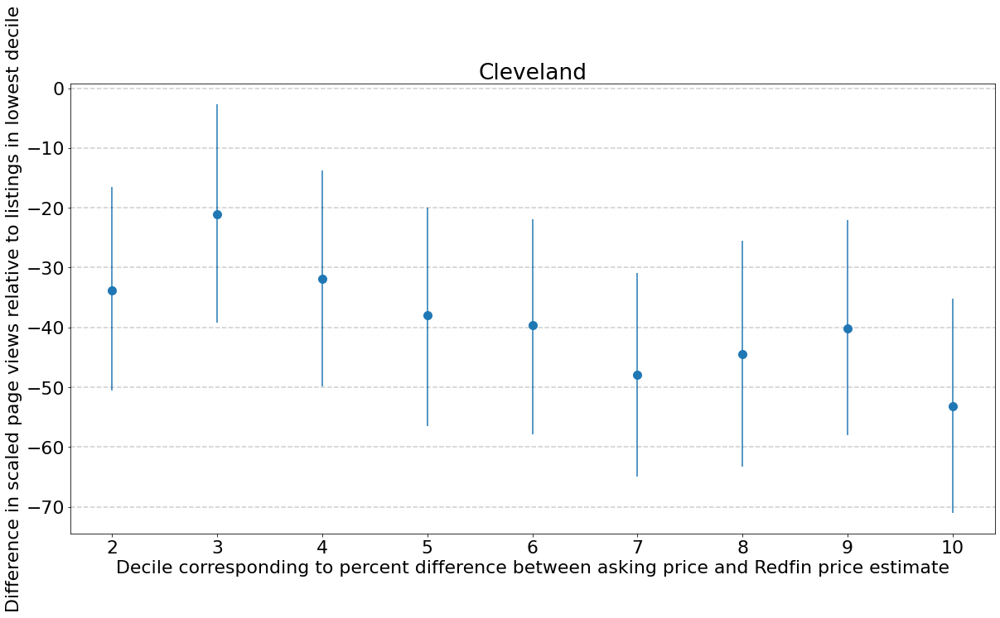

fraction of homes with null Redfin price estimate: 0.915


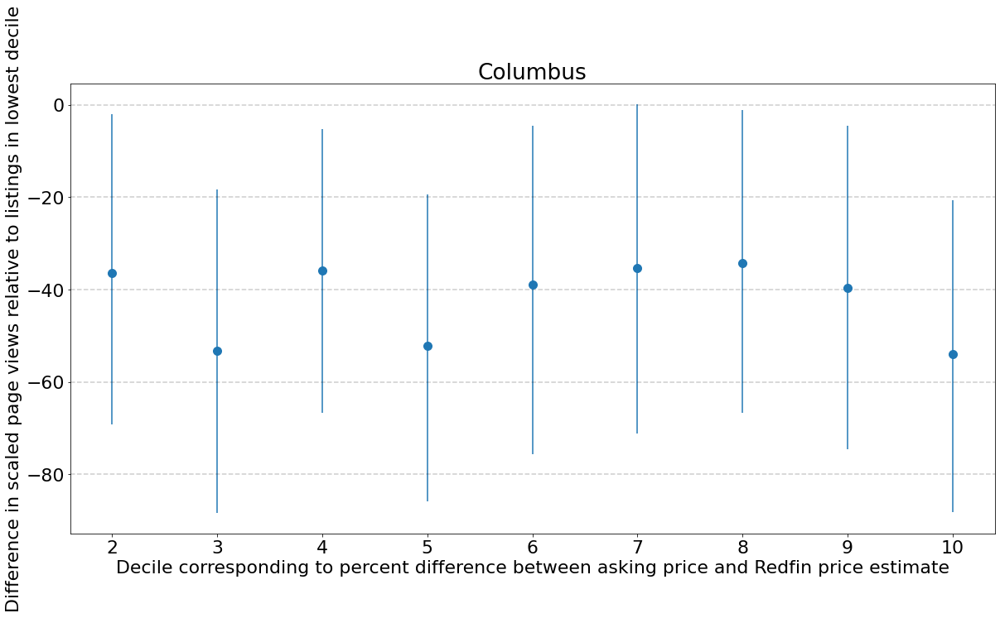

fraction of homes with null Redfin price estimate: 0.185


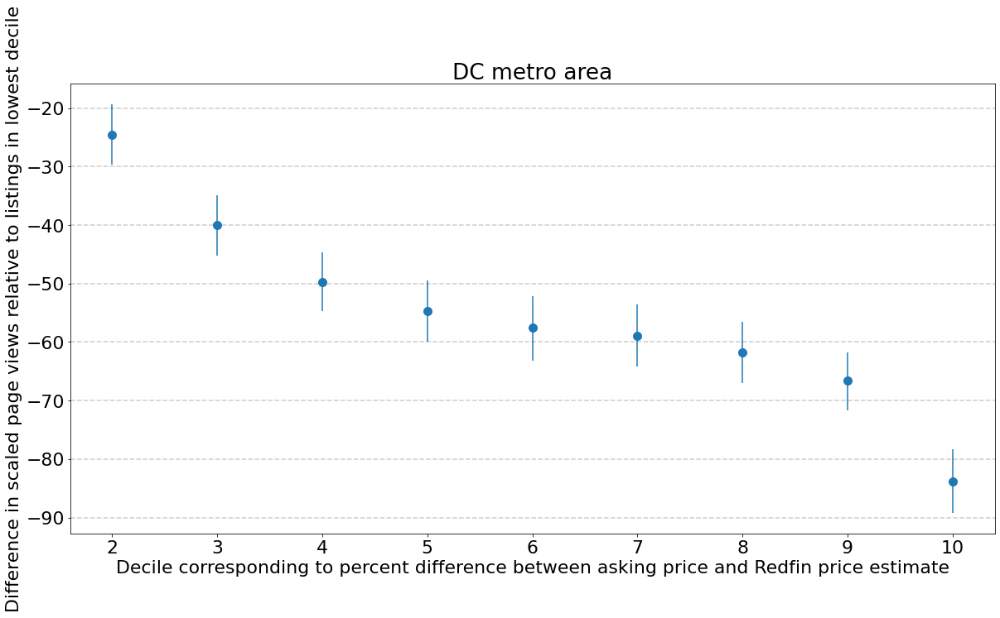

fraction of homes with null Redfin price estimate: 0.305


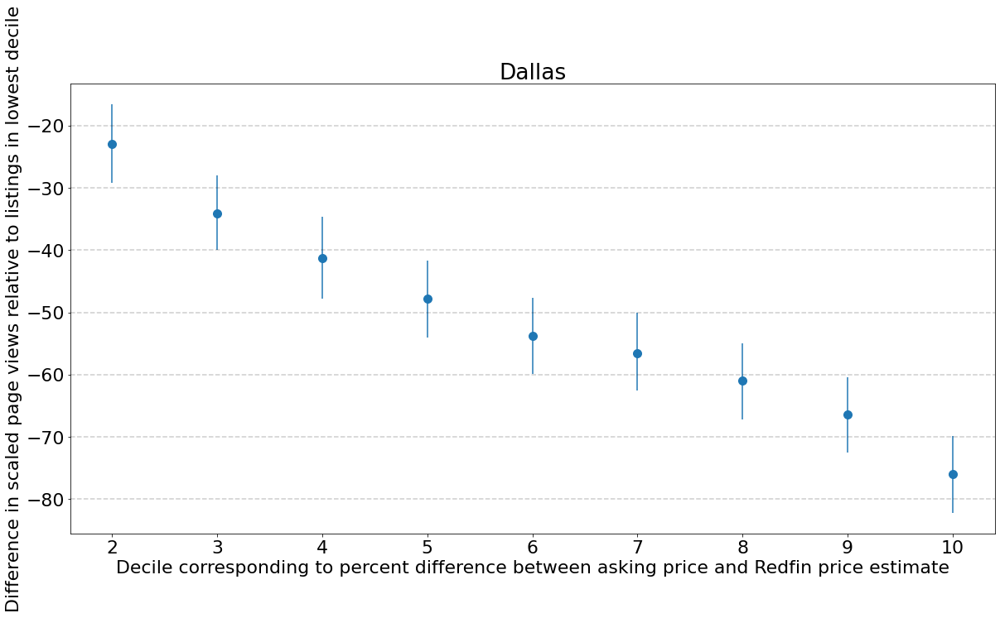

fraction of homes with null Redfin price estimate: 0.145


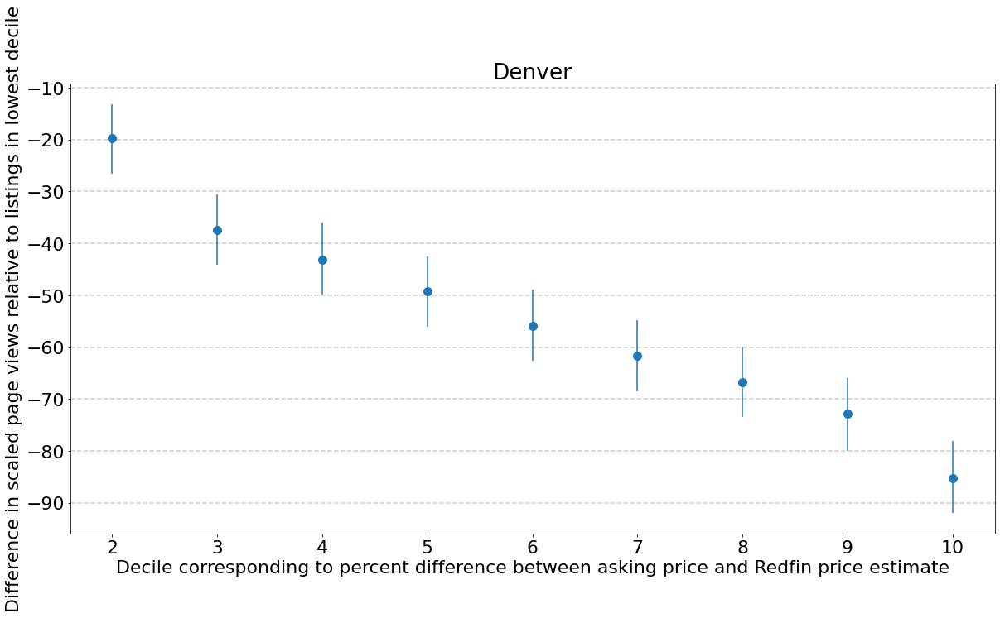

fraction of homes with null Redfin price estimate: 0.231


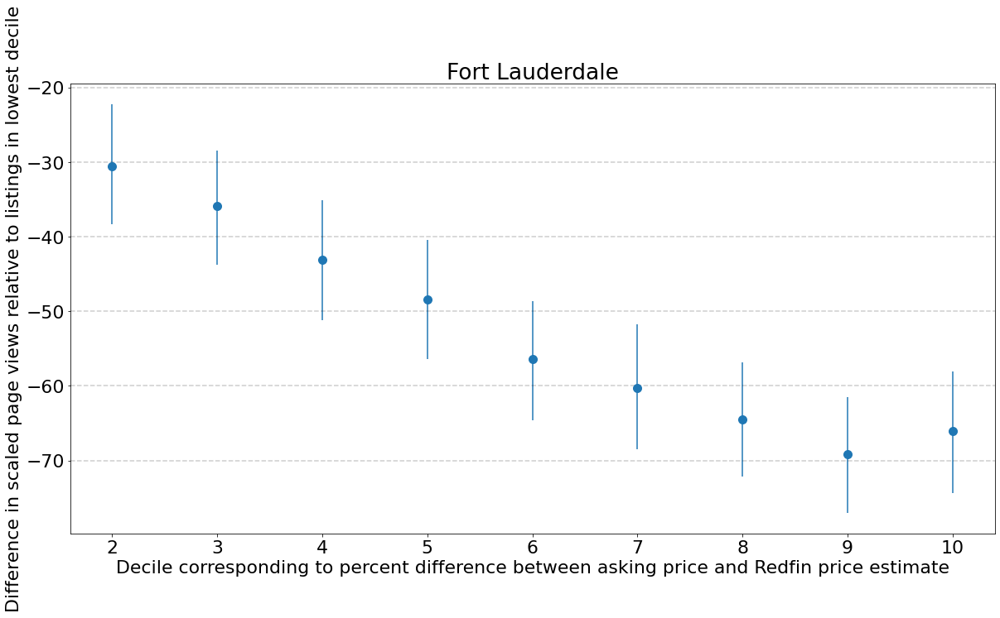

fraction of homes with null Redfin price estimate: 0.362


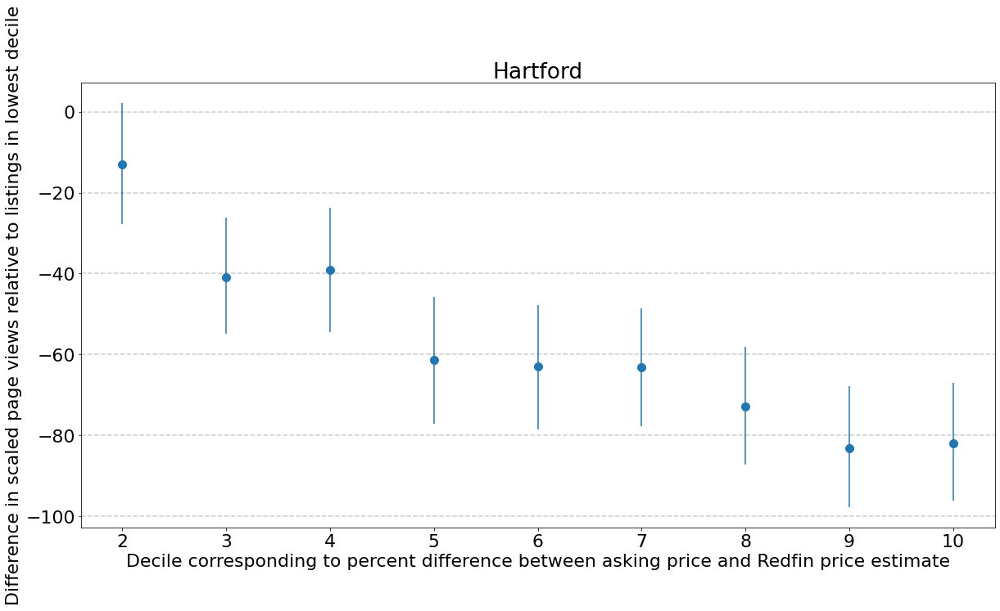

fraction of homes with null Redfin price estimate: 0.052


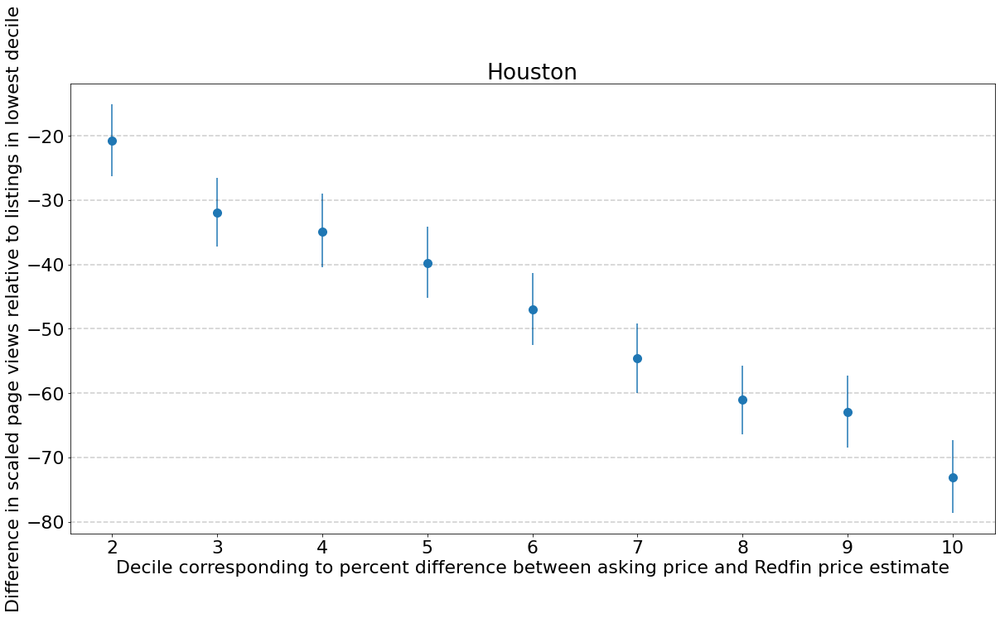

fraction of homes with null Redfin price estimate: 0.737


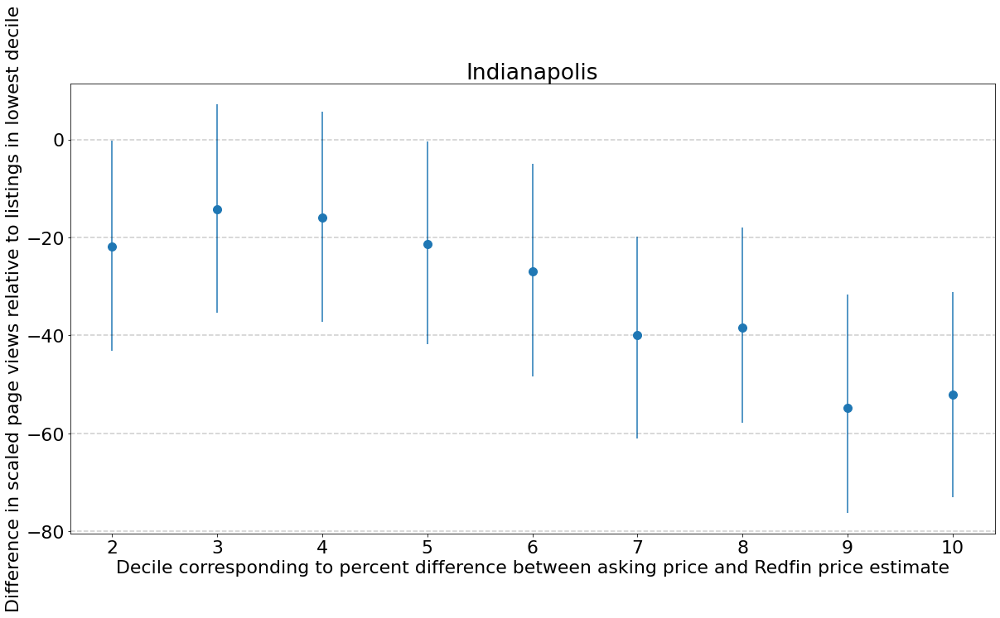

fraction of homes with null Redfin price estimate: 0.2


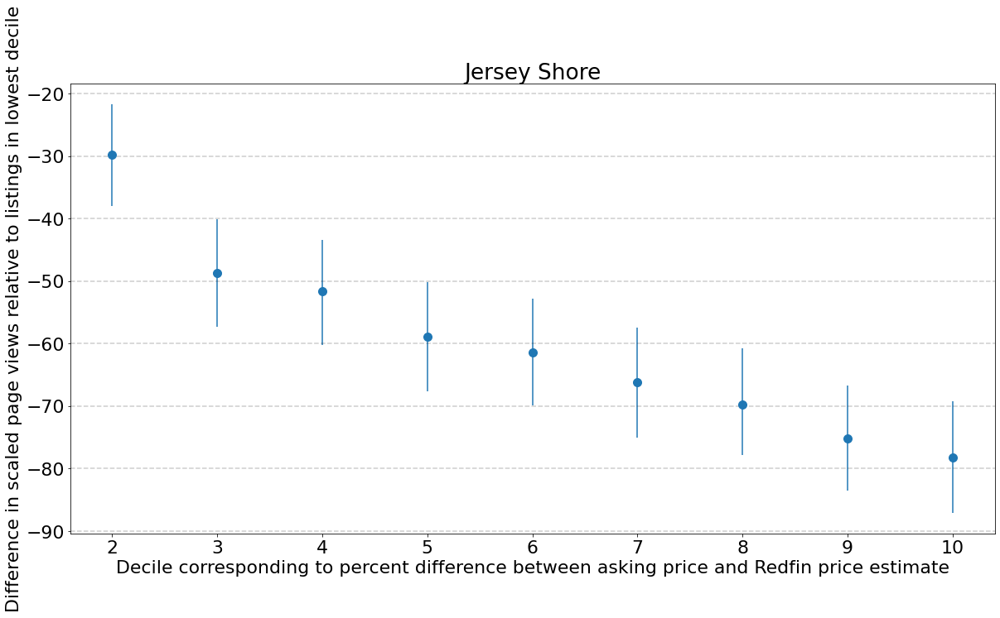

fraction of homes with null Redfin price estimate: 0.968


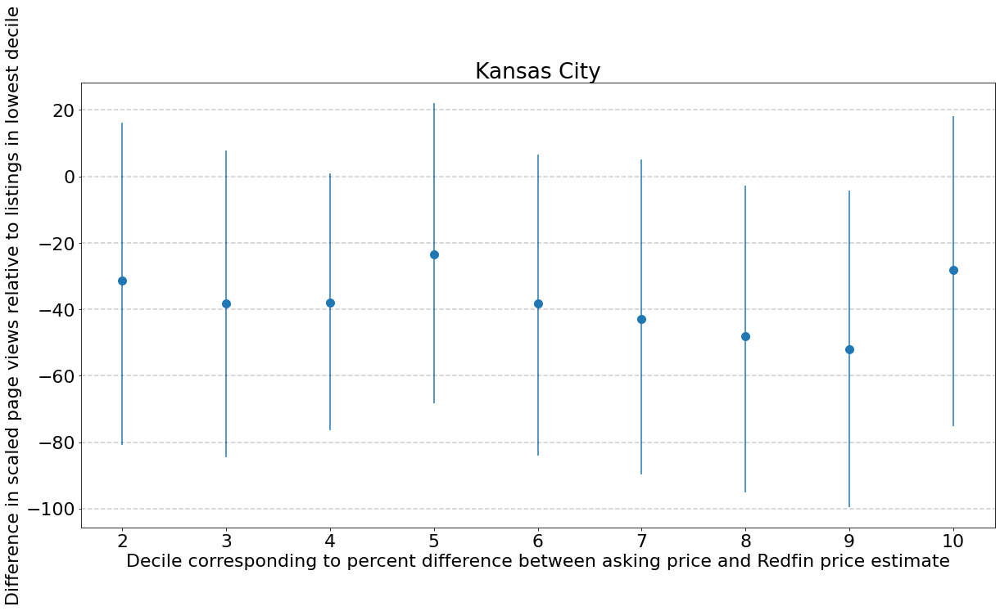

fraction of homes with null Redfin price estimate: 0.164


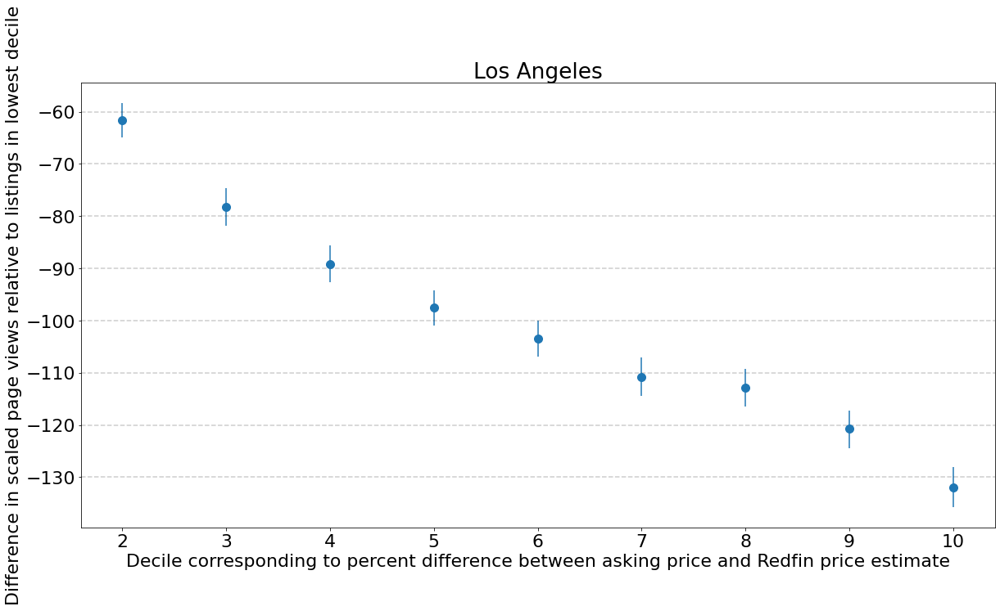

fraction of homes with null Redfin price estimate: 0.242


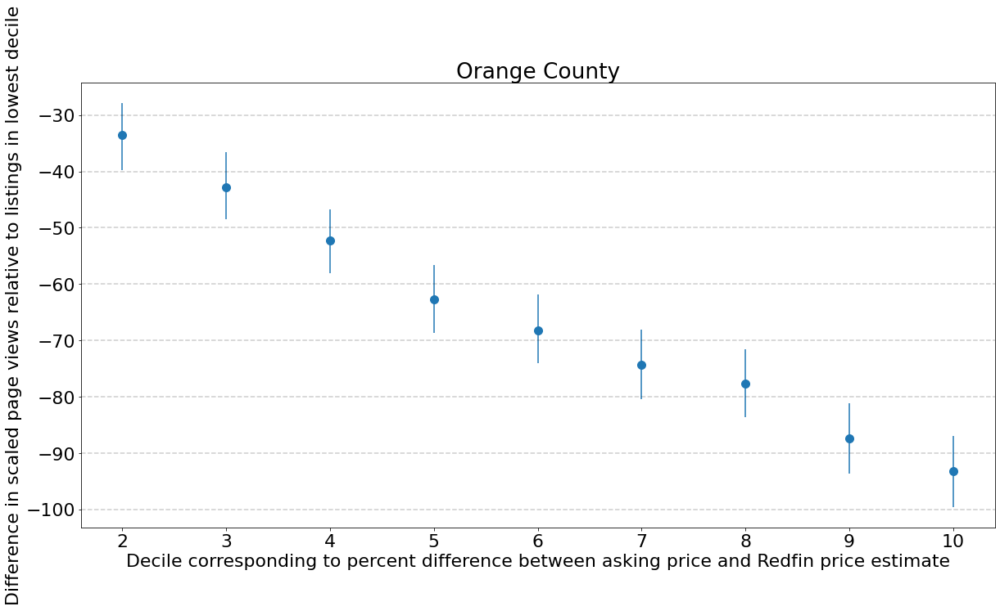

fraction of homes with null Redfin price estimate: 0.316


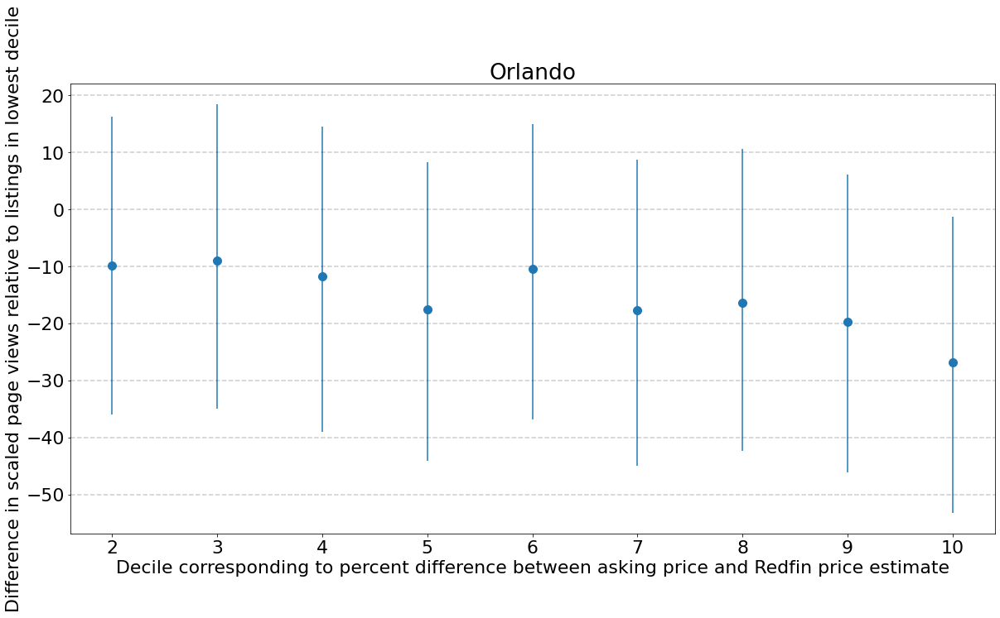

fraction of homes with null Redfin price estimate: 0.133


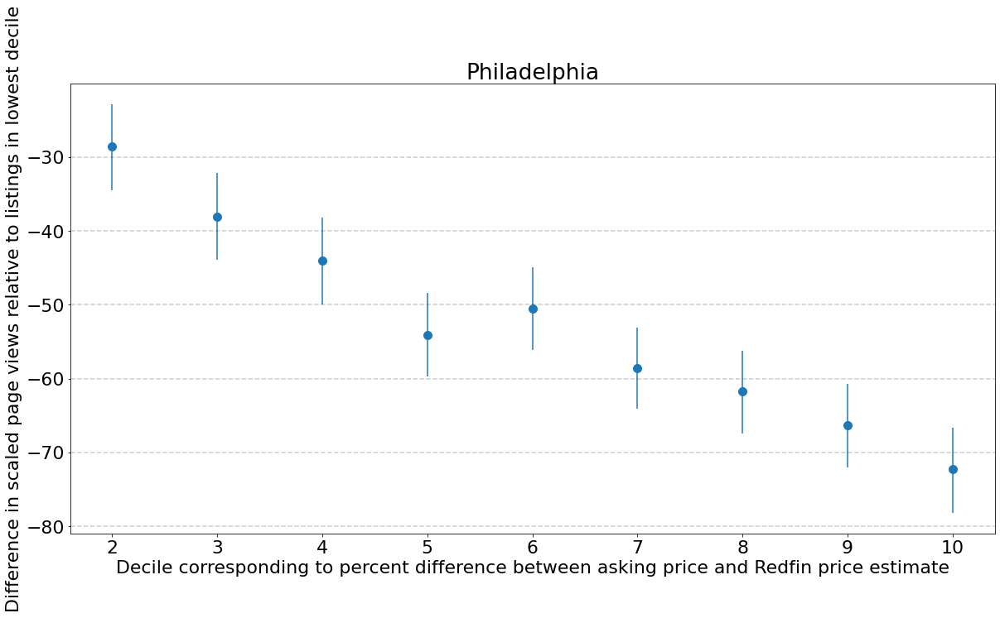

fraction of homes with null Redfin price estimate: 0.957


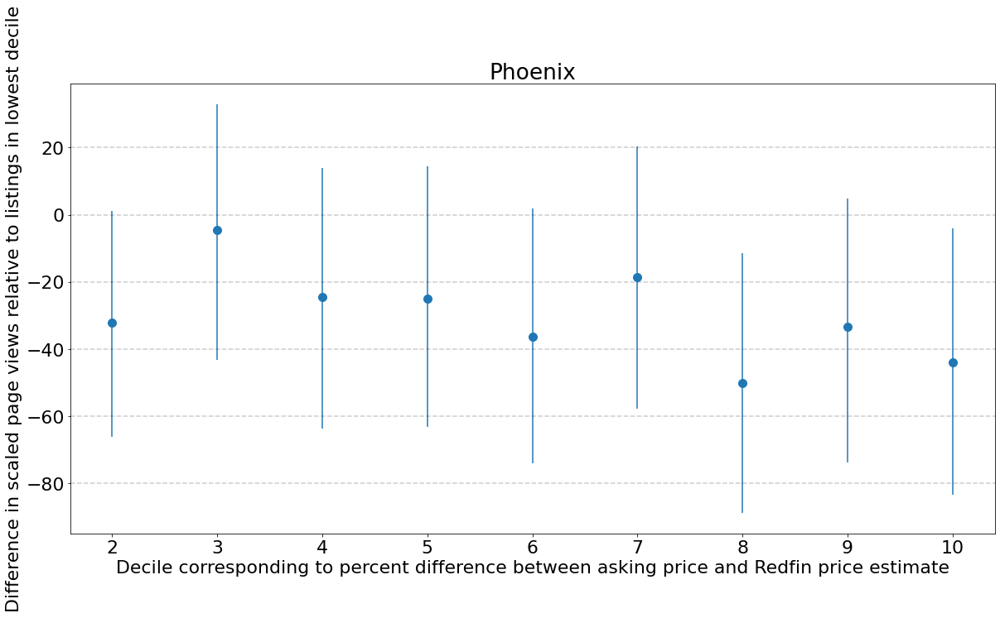

fraction of homes with null Redfin price estimate: 0.008


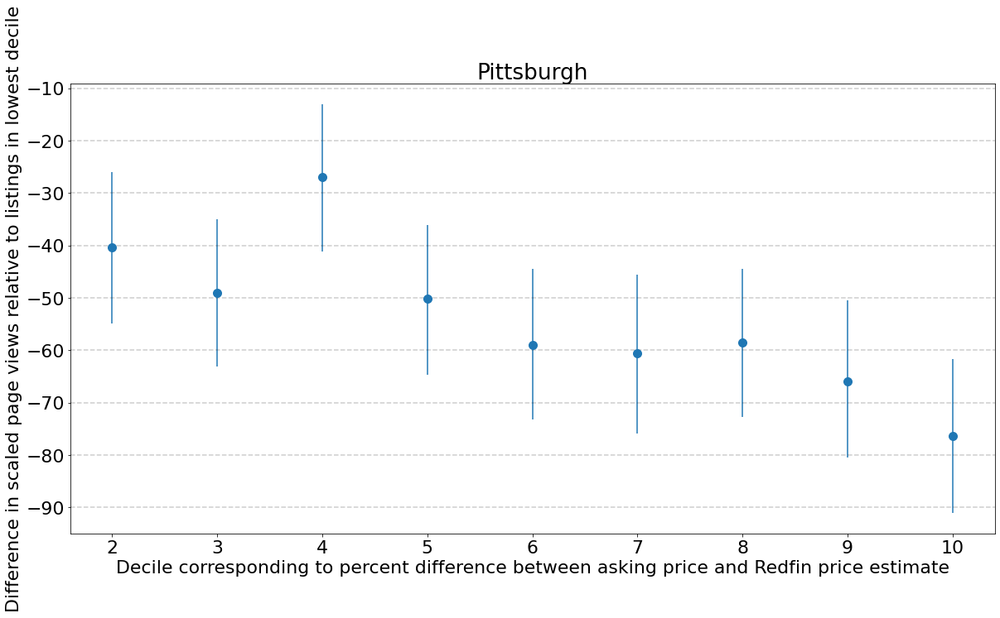

fraction of homes with null Redfin price estimate: 0.267


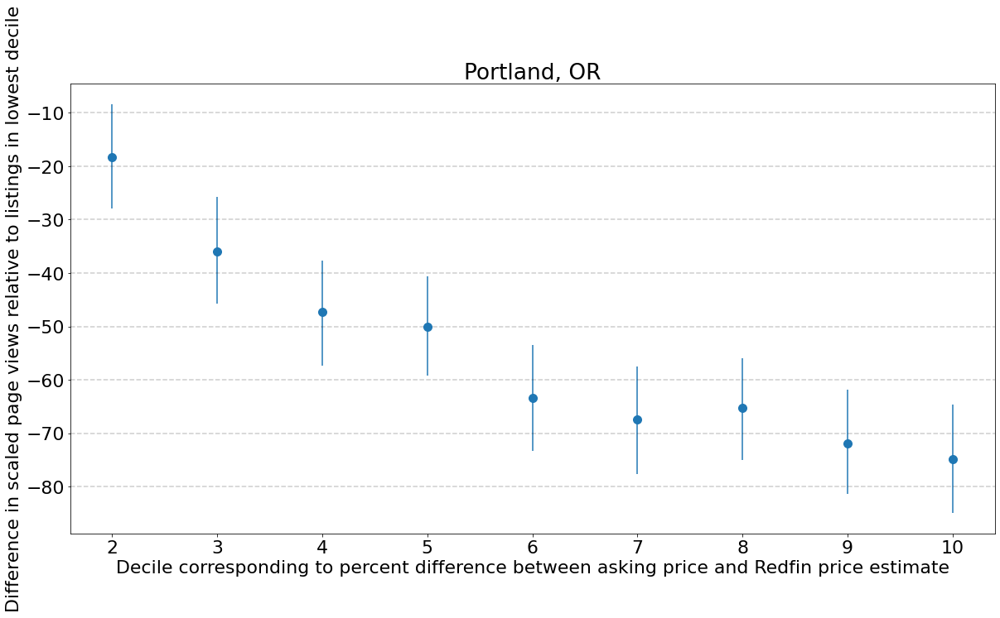

fraction of homes with null Redfin price estimate: 0.314


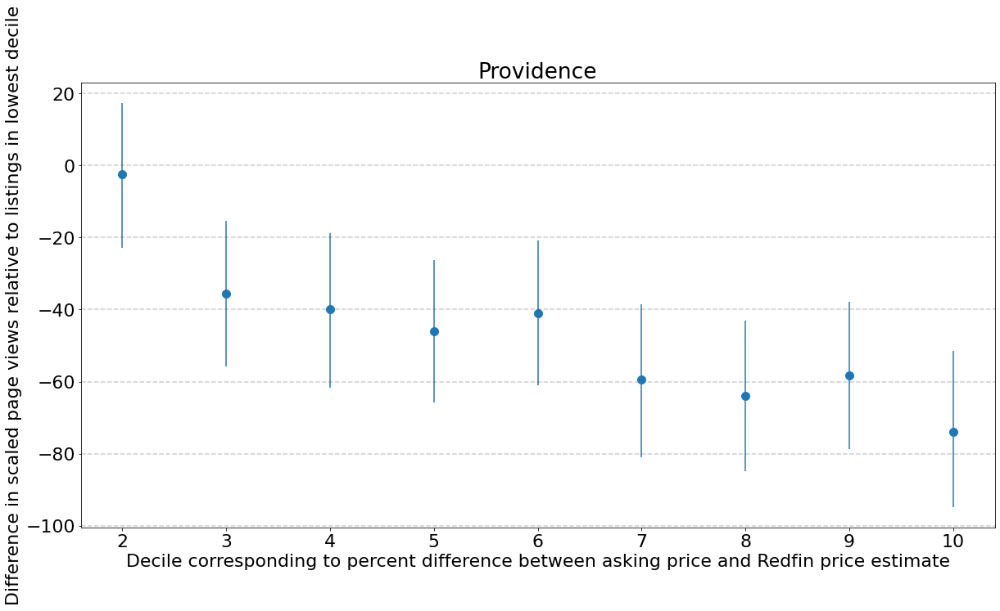

fraction of homes with null Redfin price estimate: 0.455


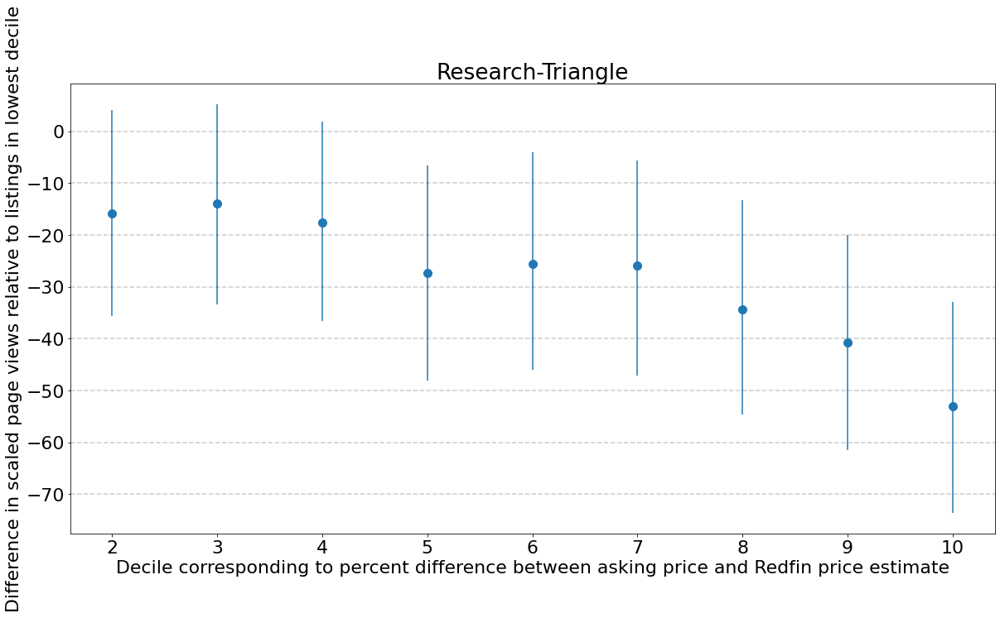

fraction of homes with null Redfin price estimate: 0.679


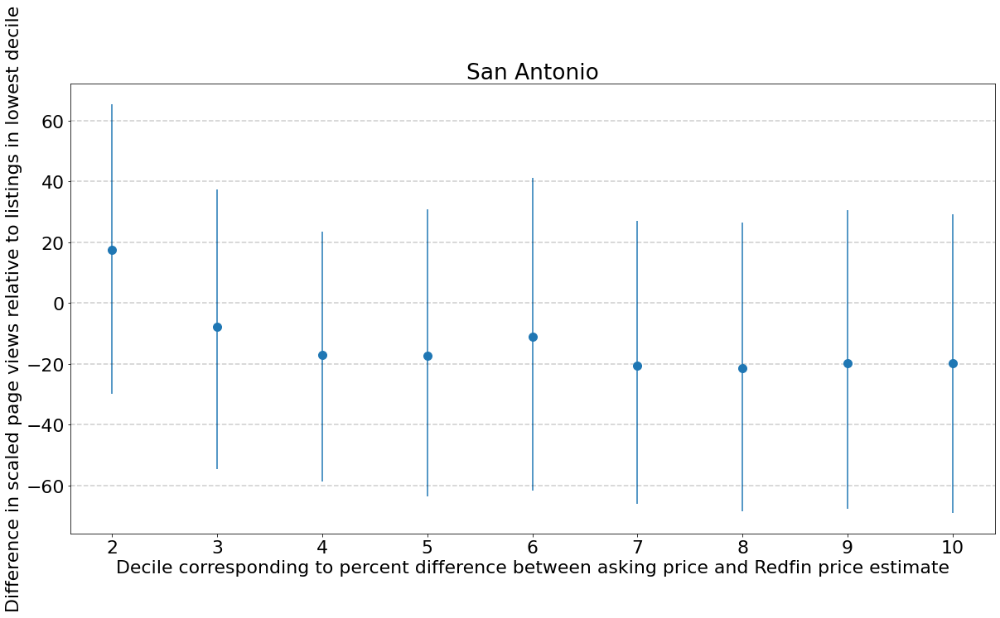

fraction of homes with null Redfin price estimate: 0.258


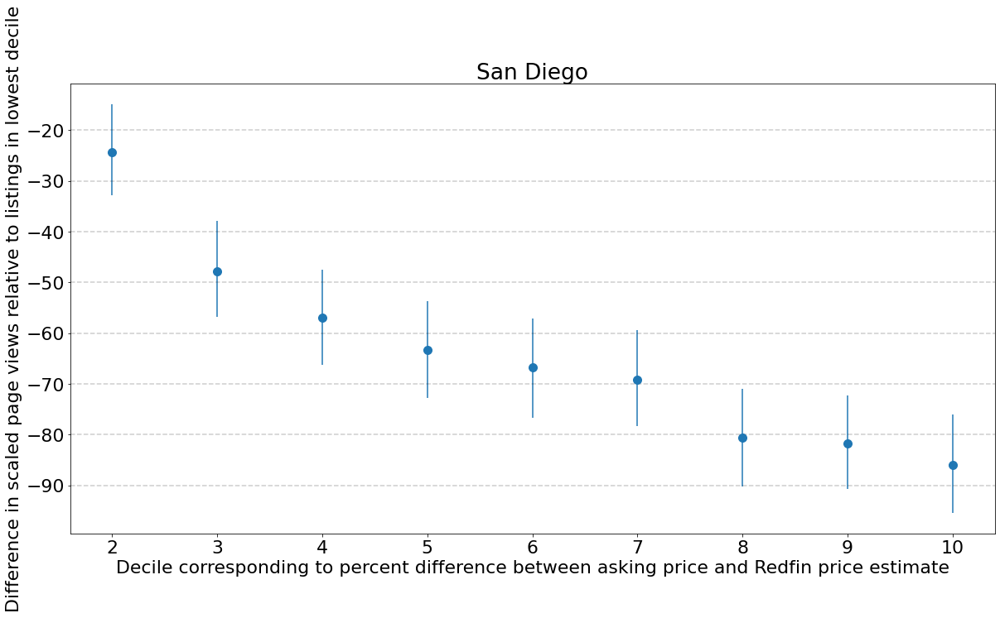

fraction of homes with null Redfin price estimate: 0.159


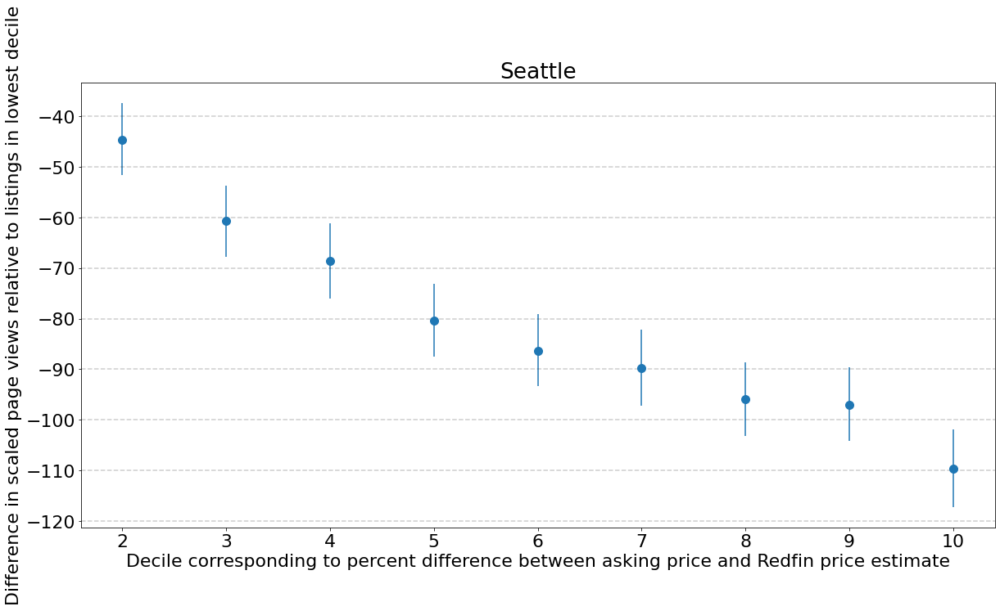

fraction of homes with null Redfin price estimate: 0.325


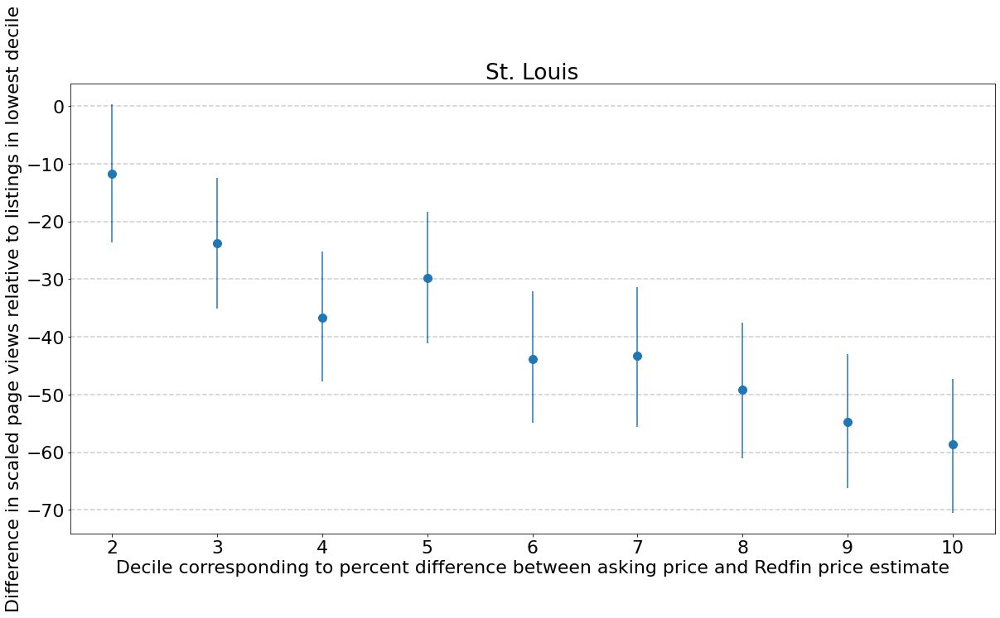

fraction of homes with null Redfin price estimate: 0.02


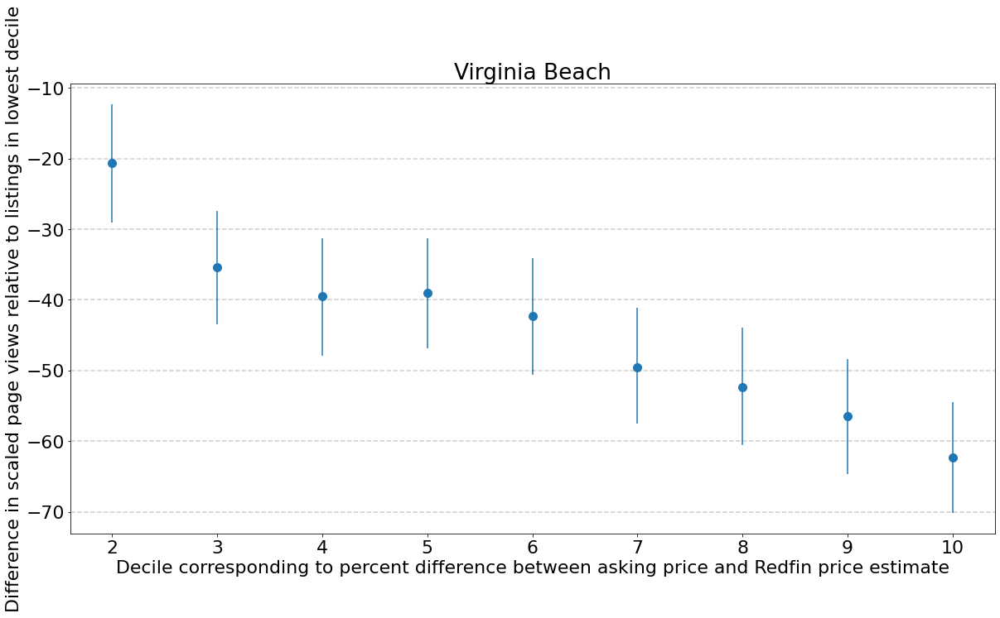

fraction of homes with null Redfin price estimate: 0.174


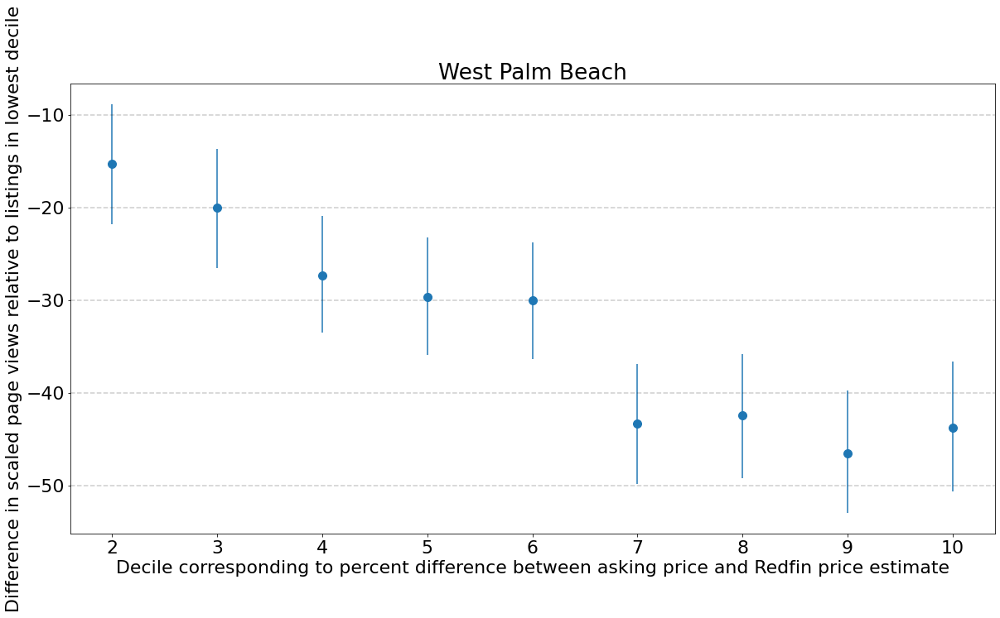

In [171]:
plot_effect_of_variables(
    'b_price_difference_pct', 
    x_label='Decile corresponding to percent difference between asking price and Redfin price estimate',
    y_label='Difference in scaled page views relative to listings in lowest decile')

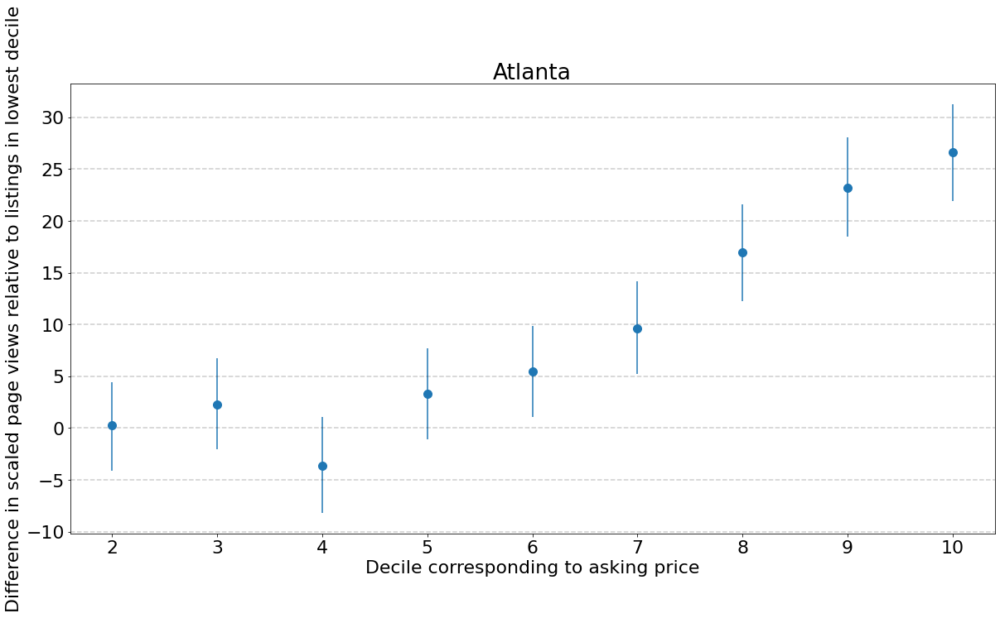

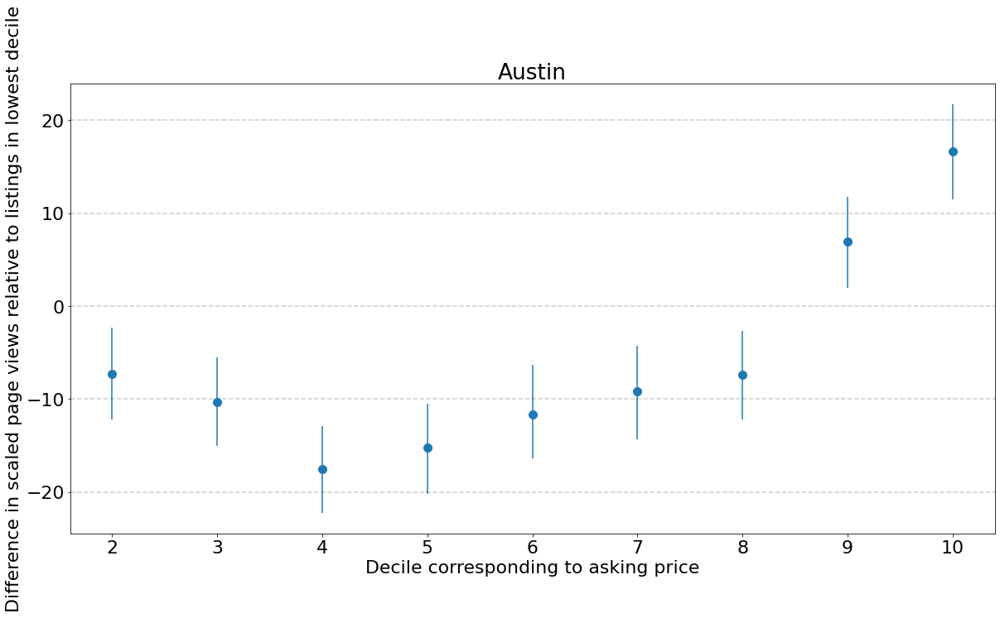

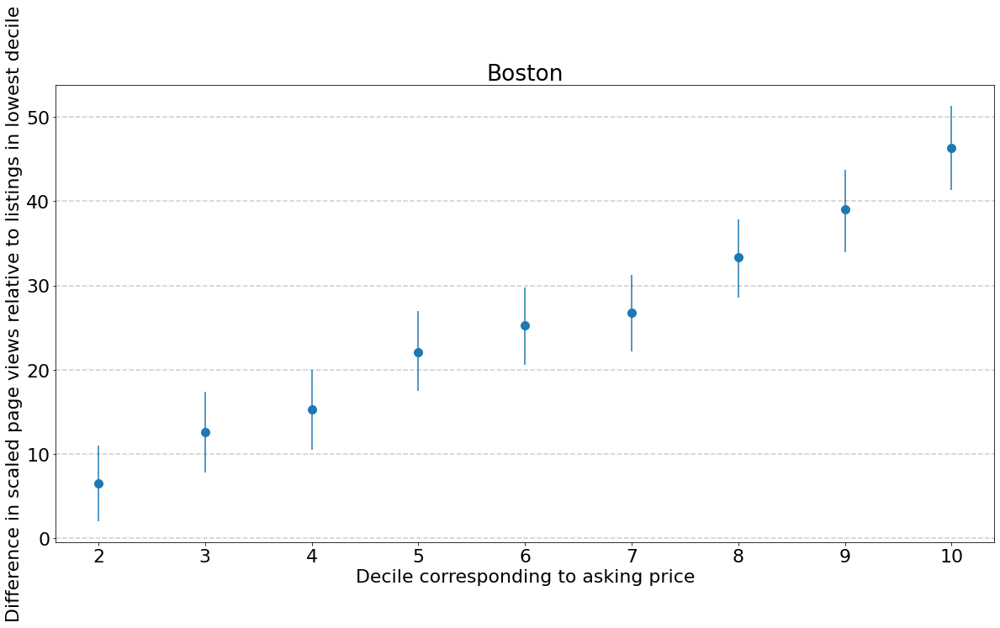

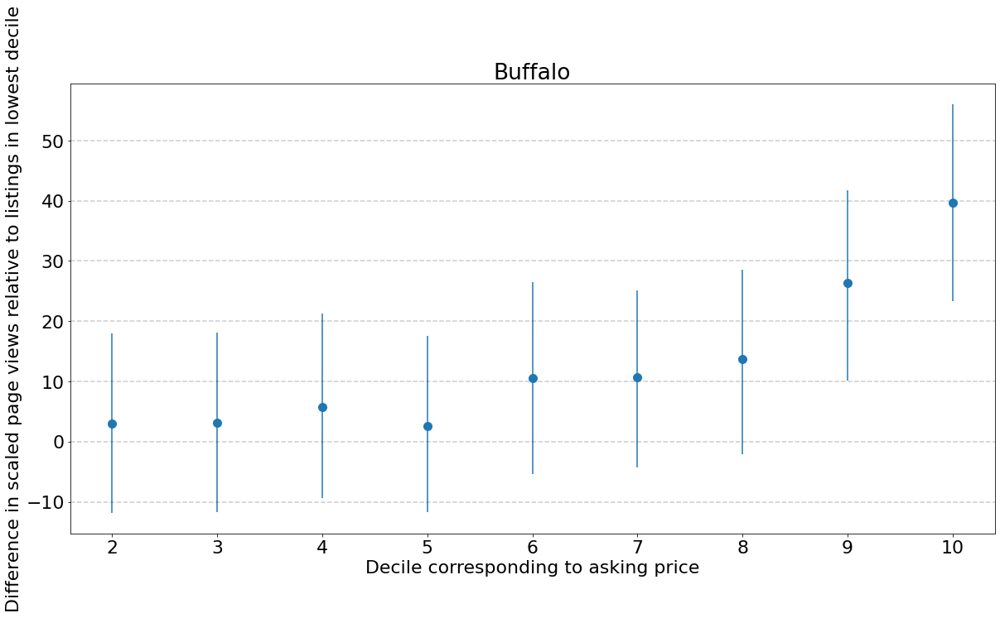

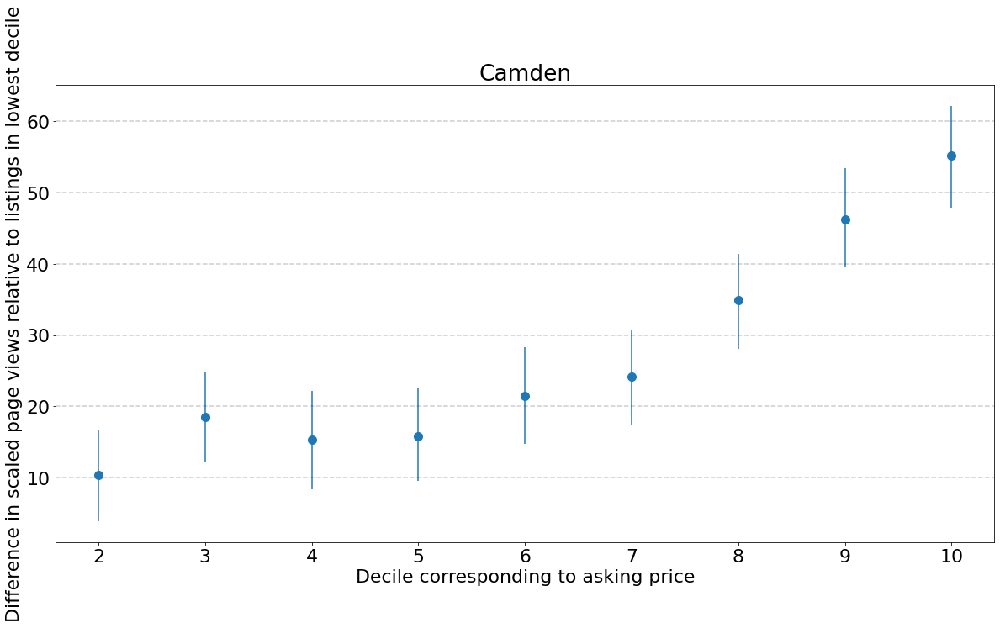

...

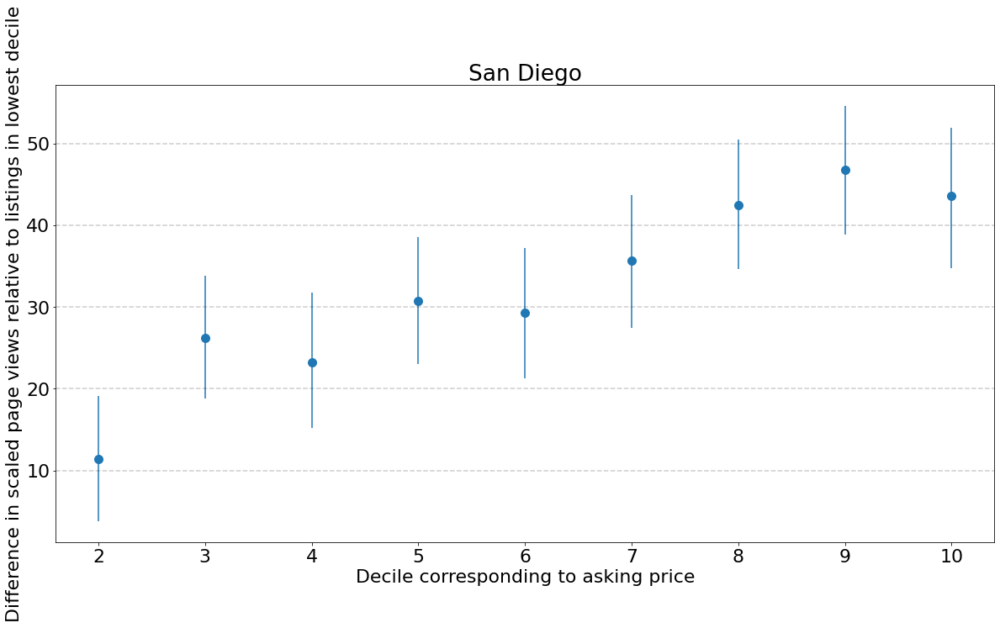

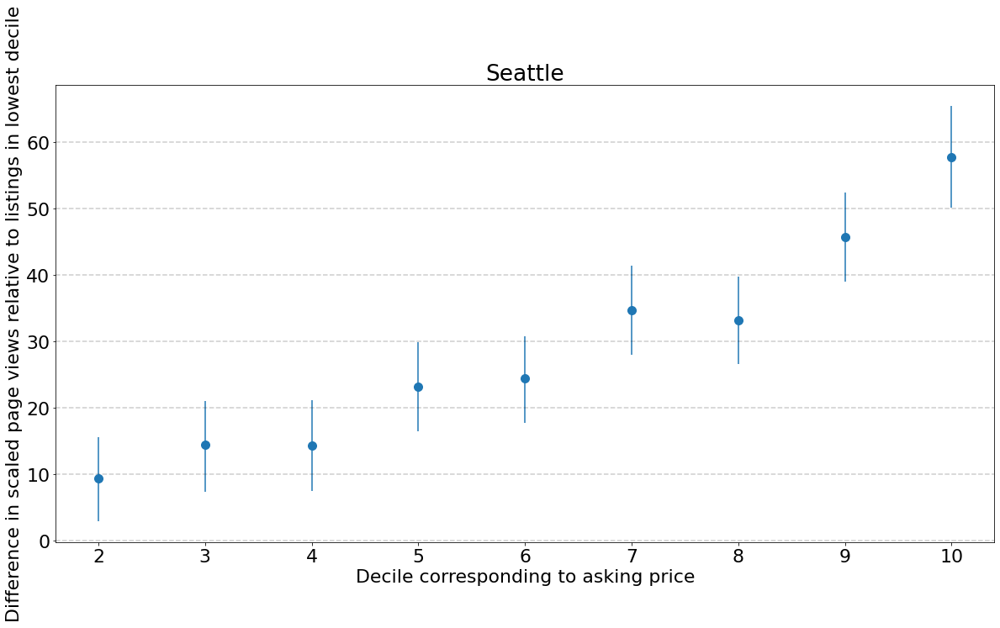

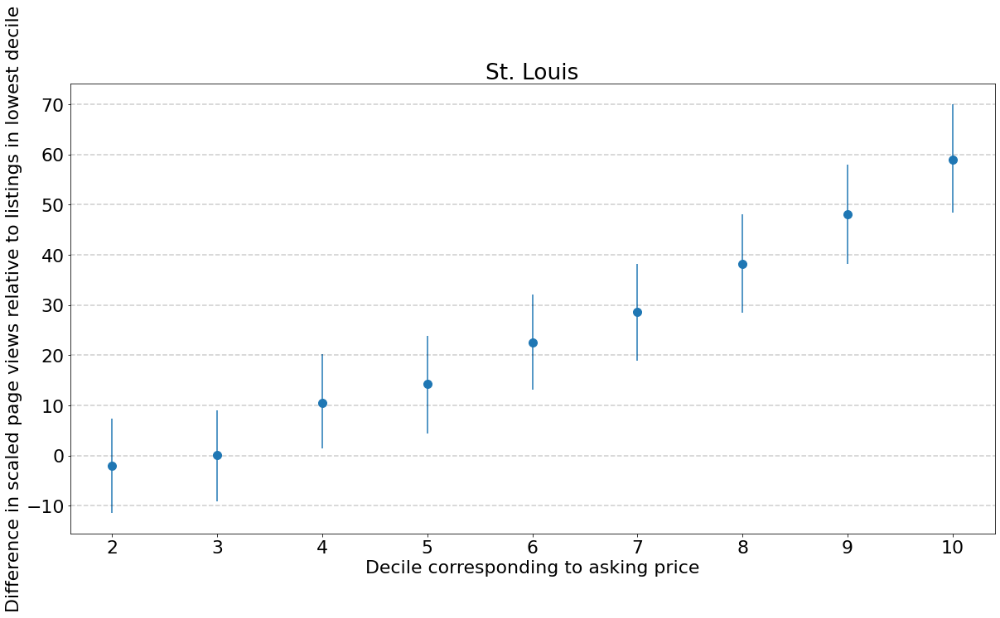

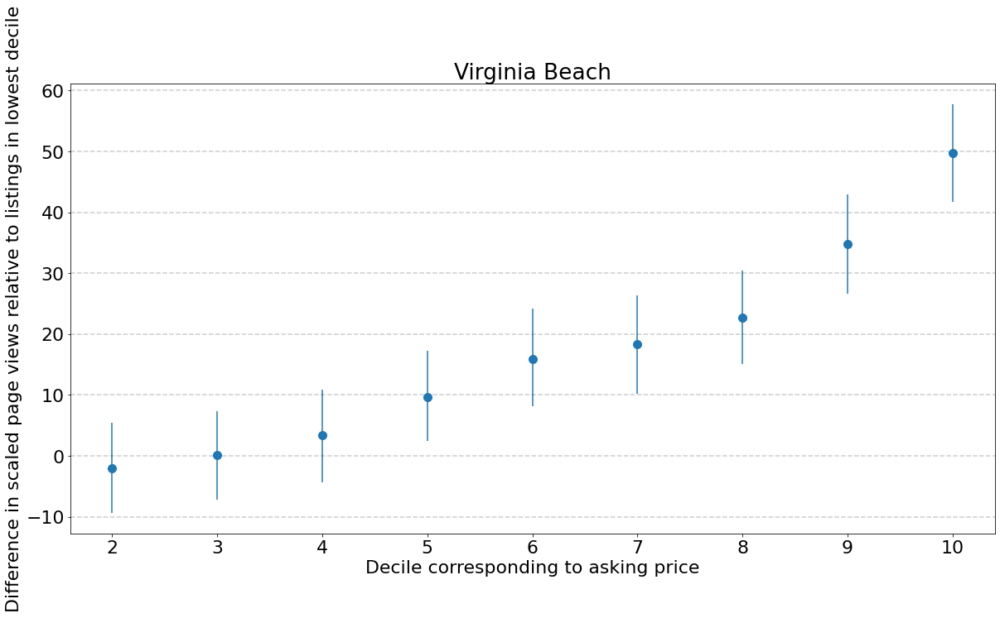

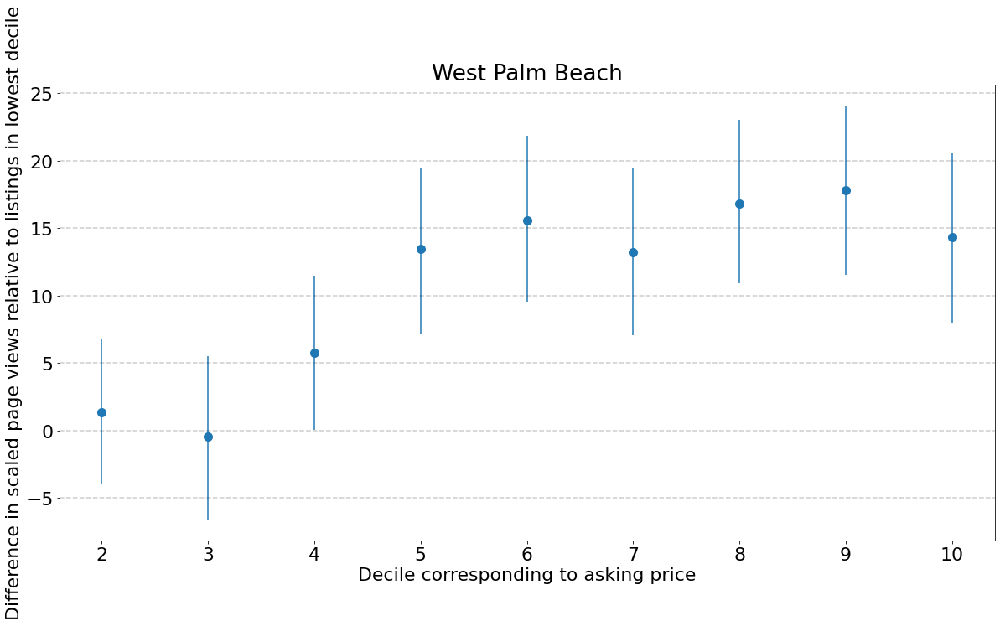

In [172]:
plot_effect_of_variables(
    'b_price', 
    x_label='Decile corresponding to asking price',
    y_label='Difference in scaled page views relative to listings in lowest decile')

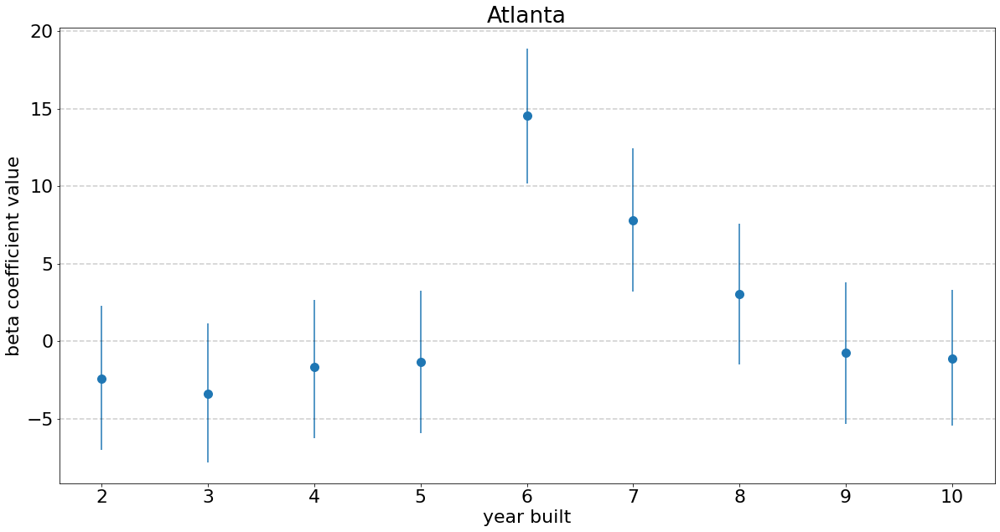

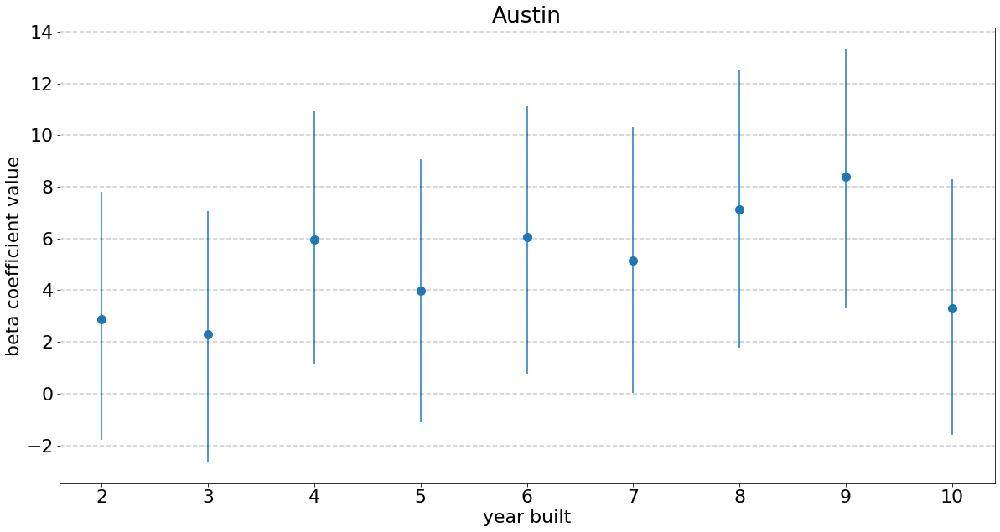

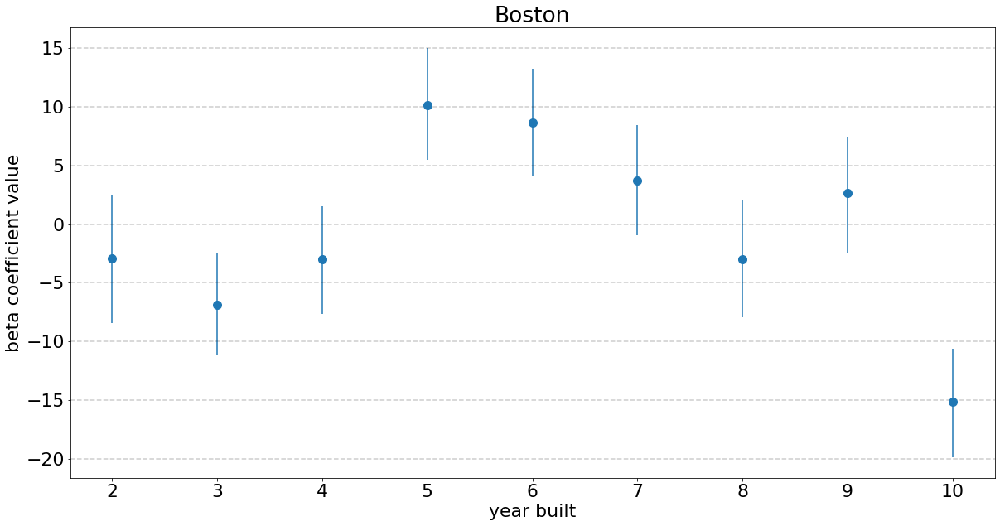

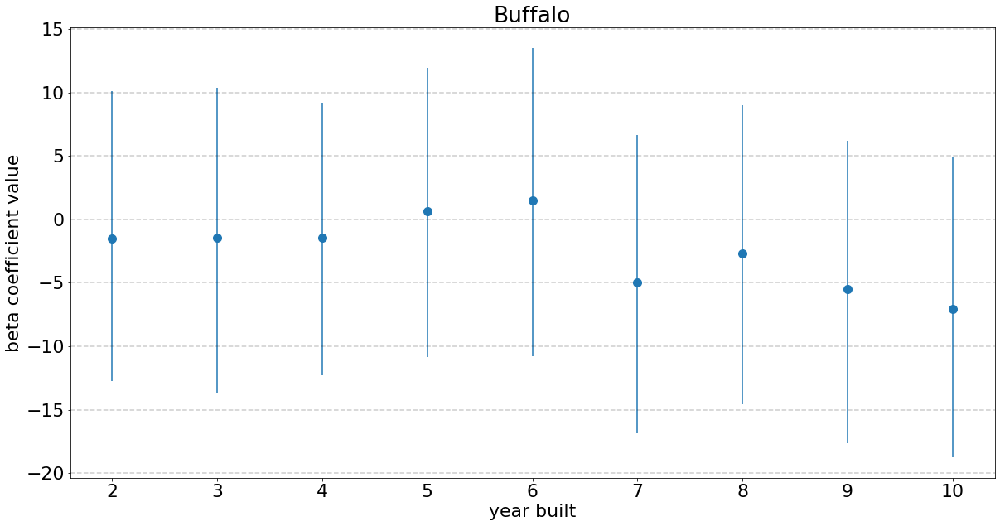

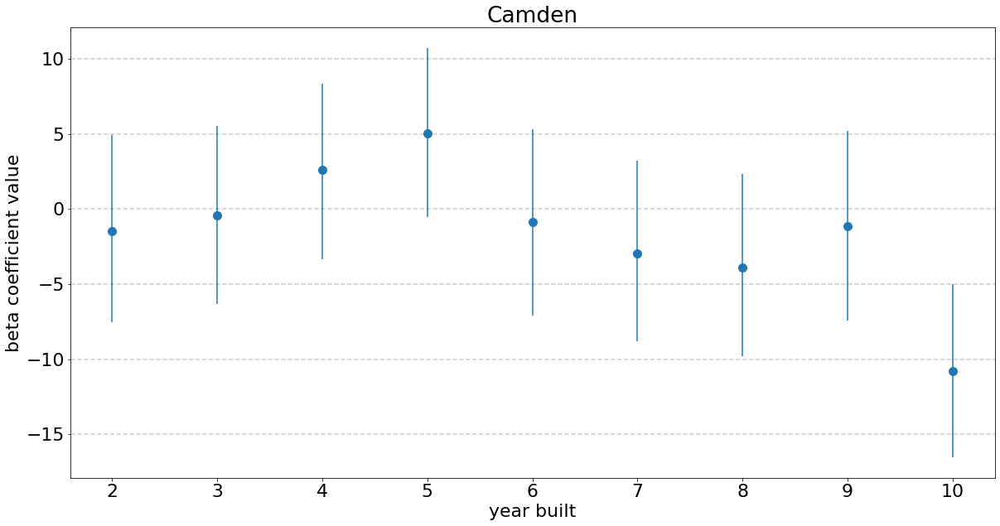

...

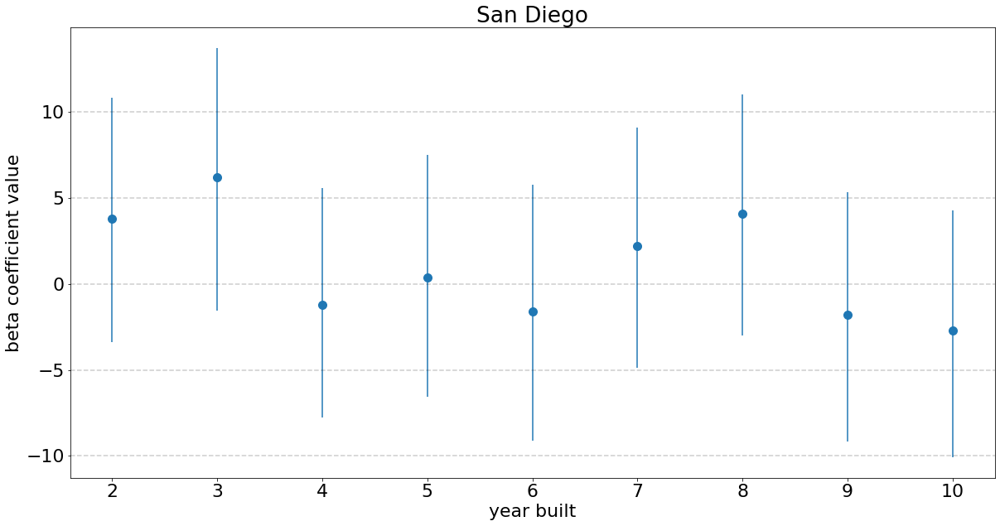

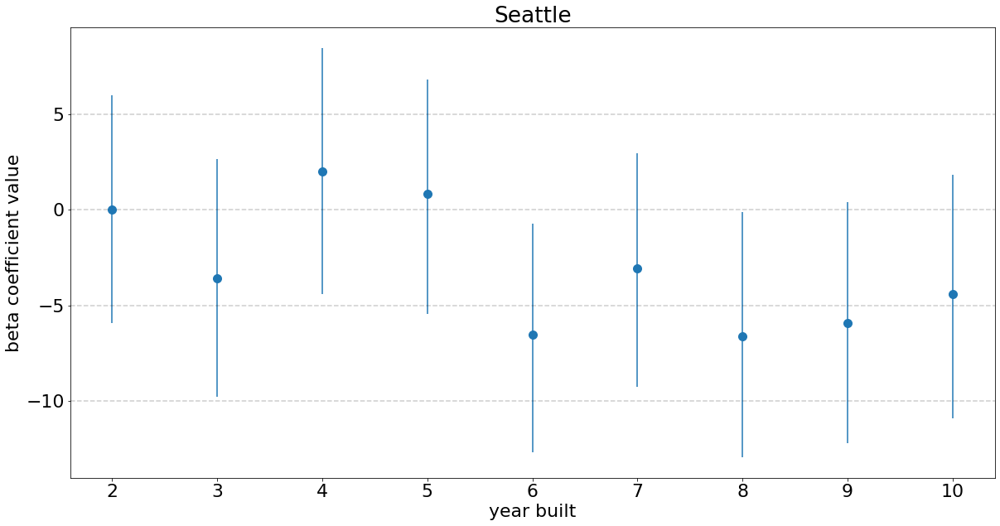

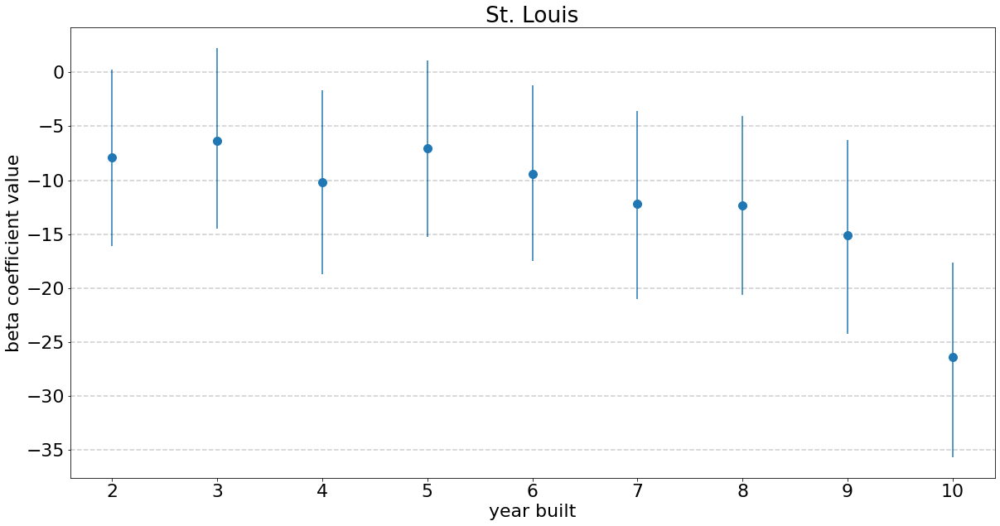

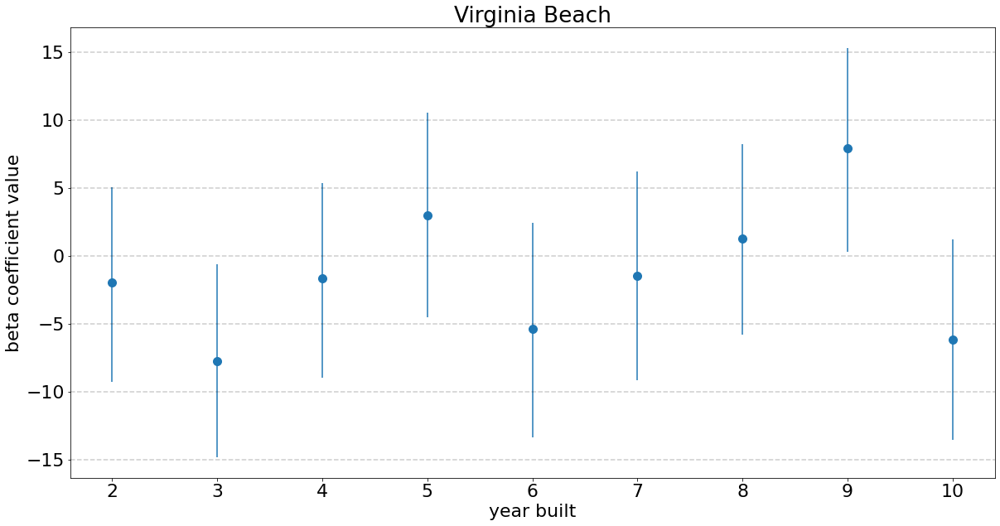

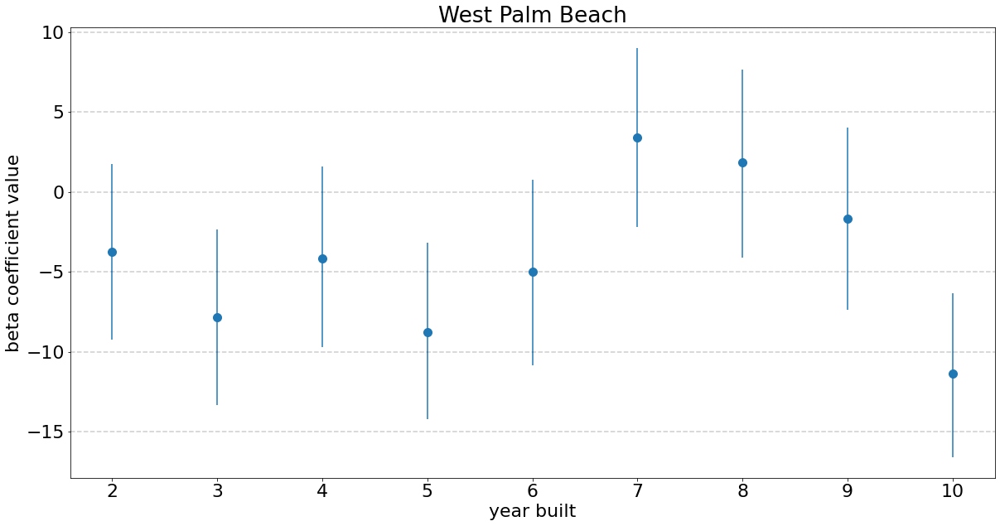

In [173]:
plot_effect_of_variables('b_year_built', 'year built')

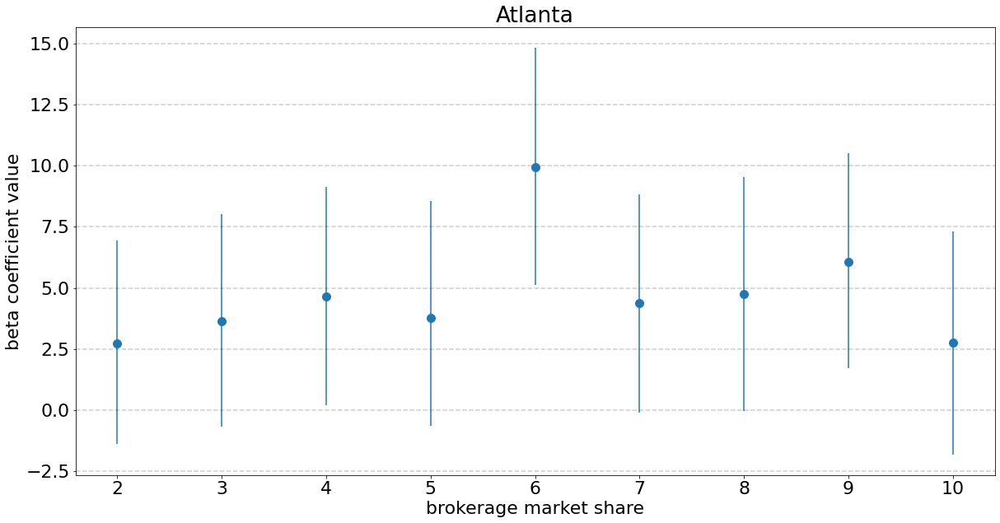

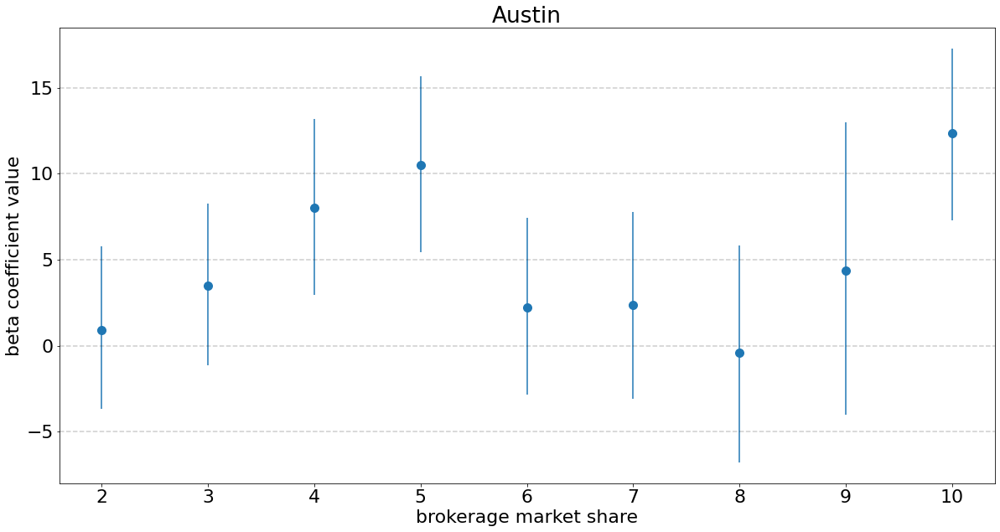

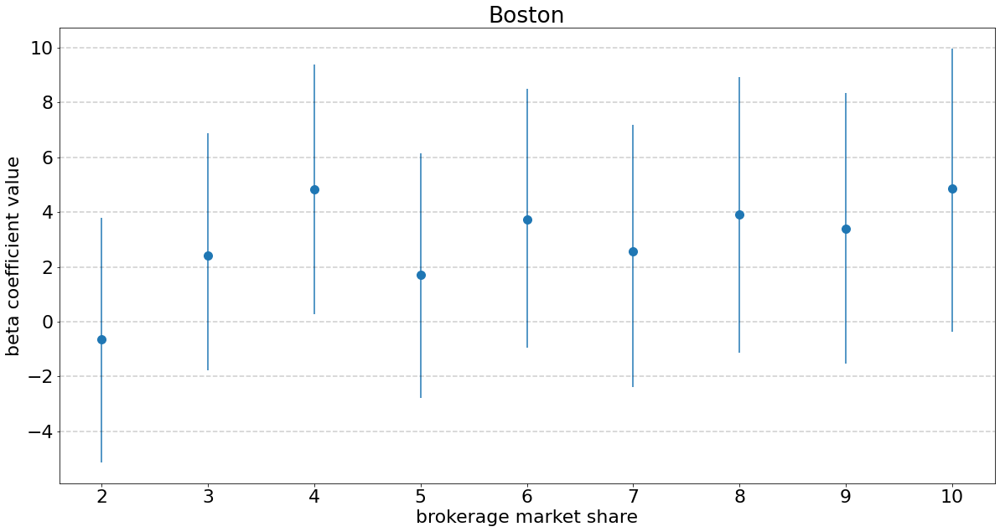

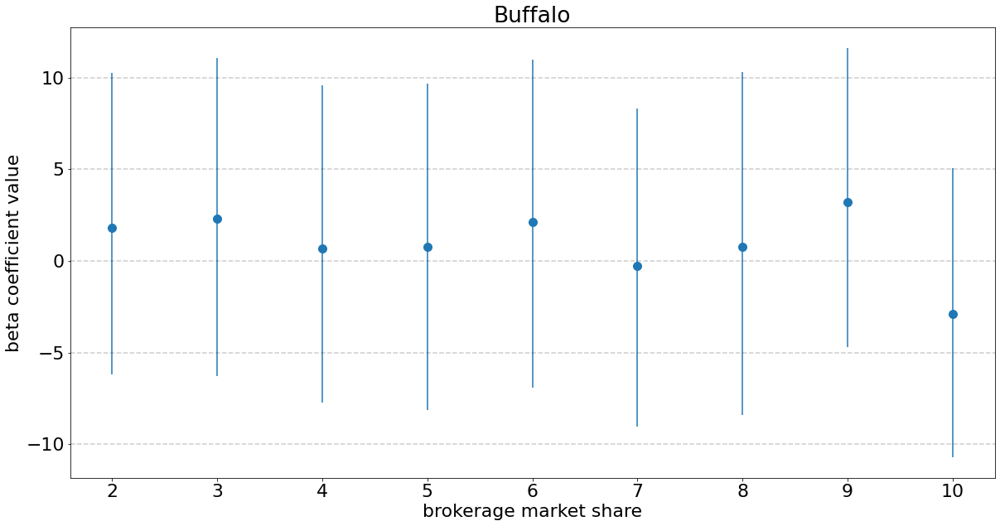

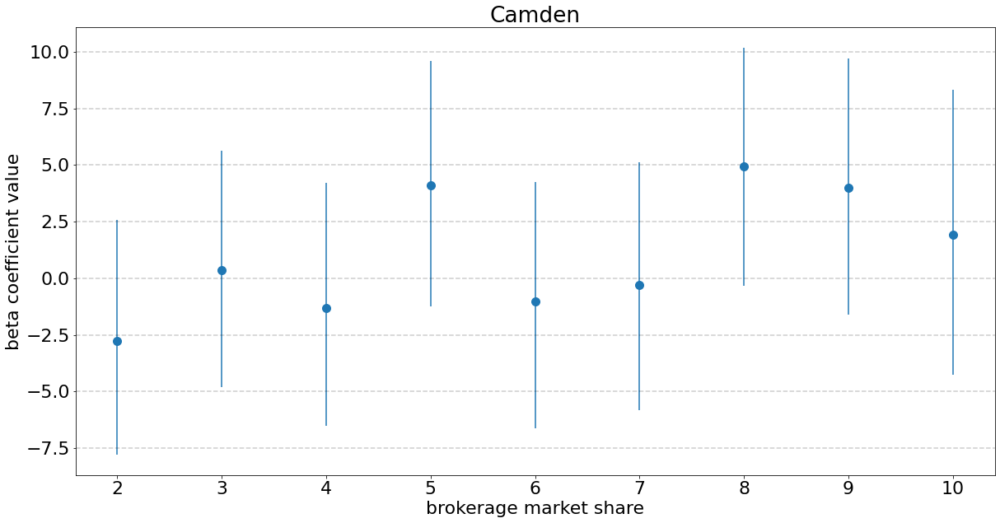

...

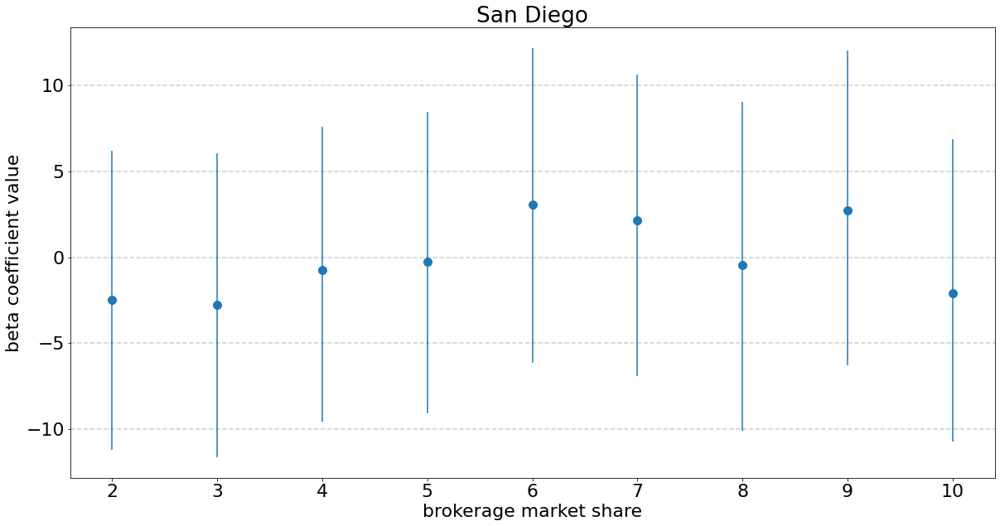

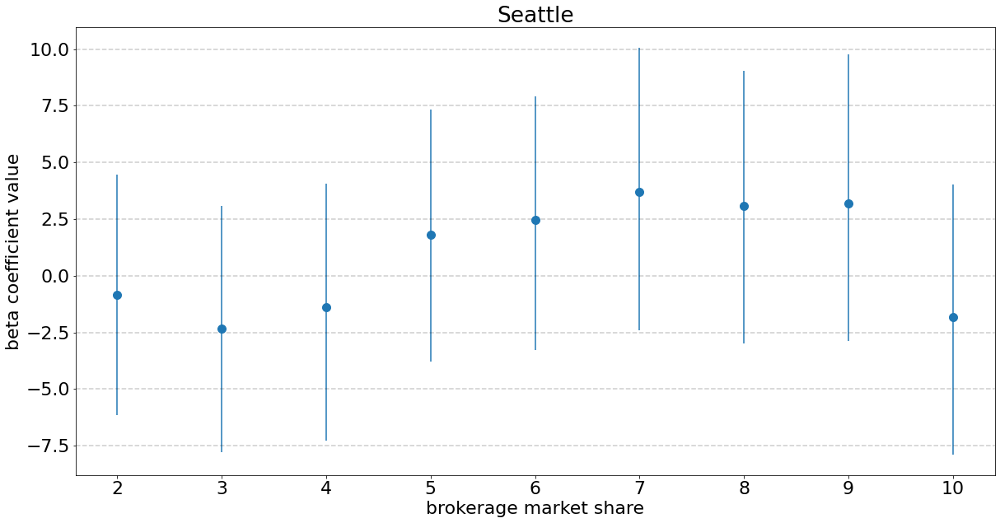

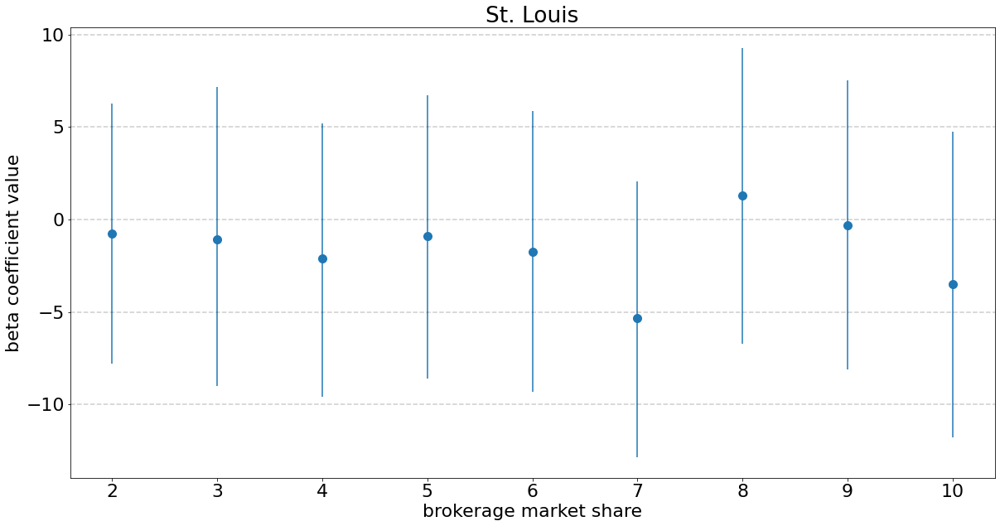

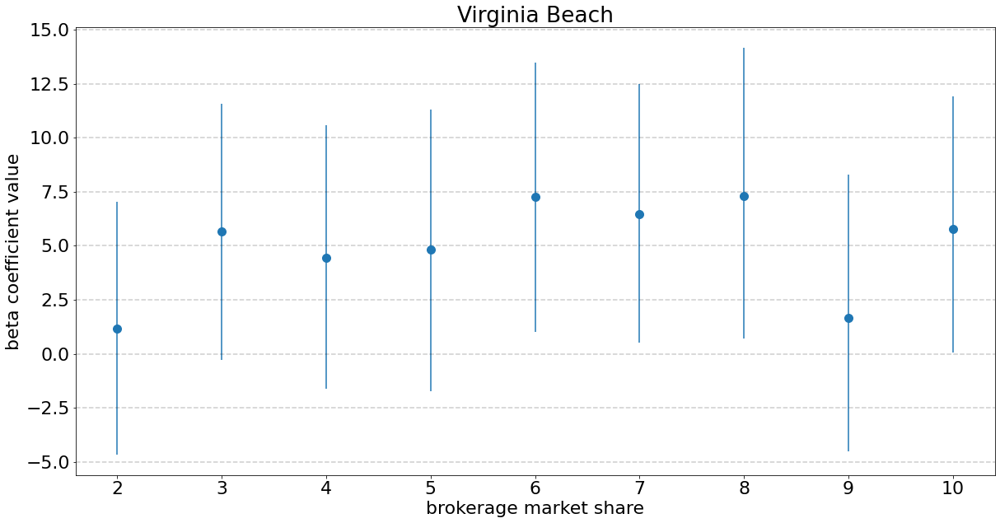

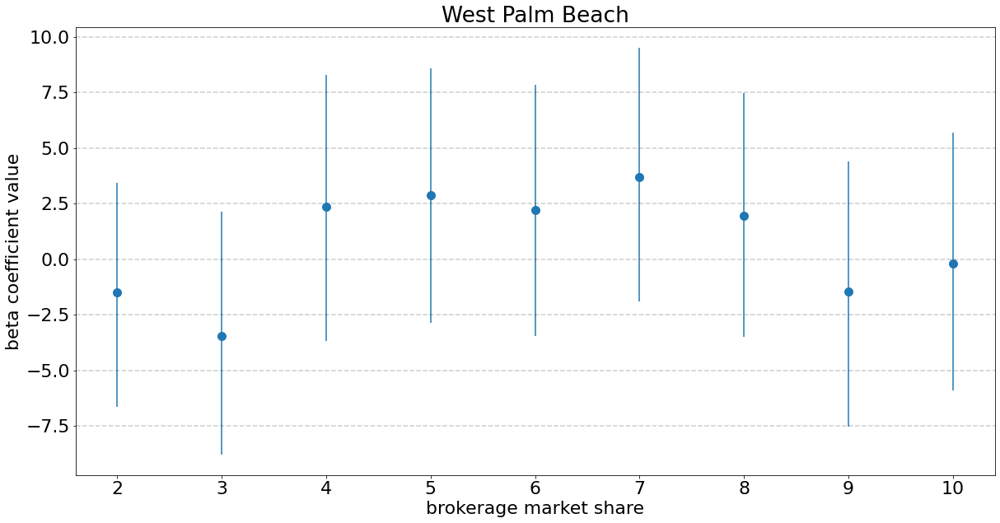

In [280]:
plot_effect_of_variables('b_brokerage_listings_pct', 'brokerage market share')

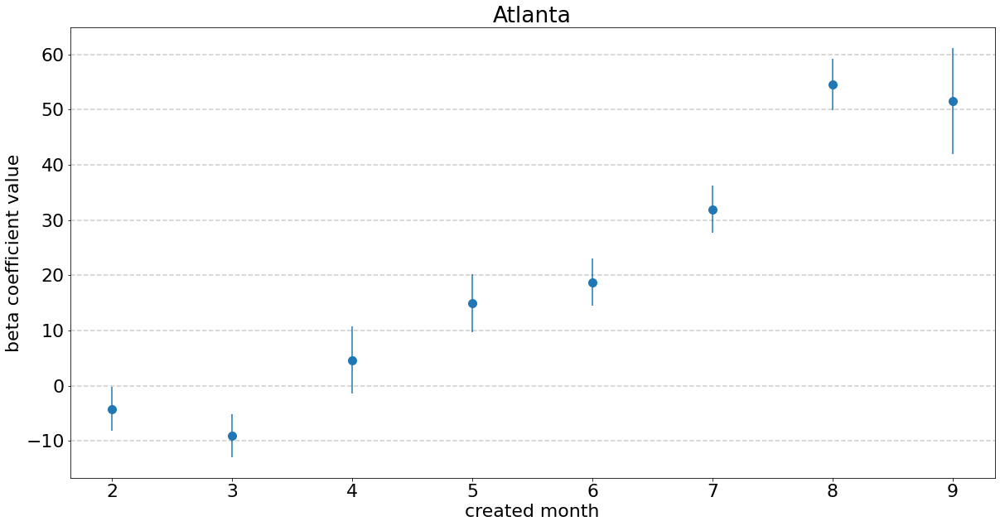

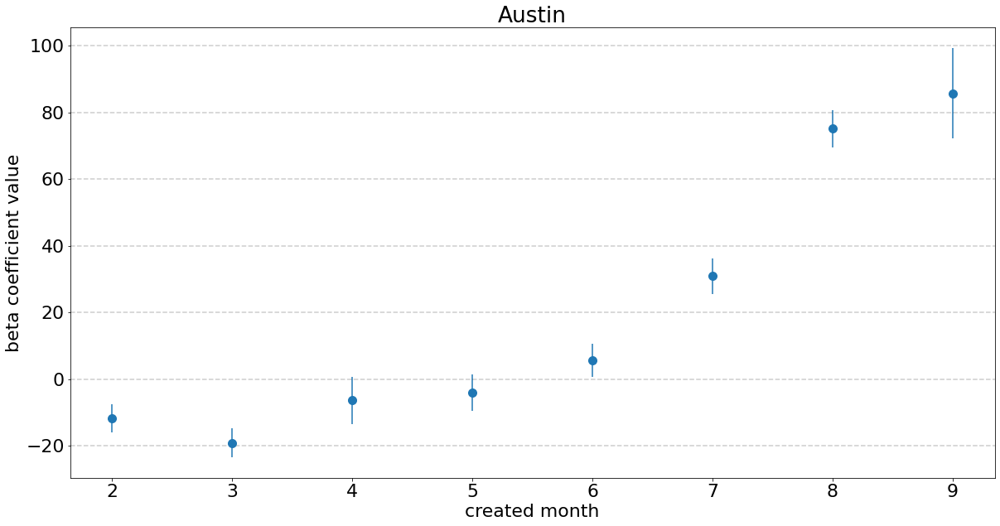

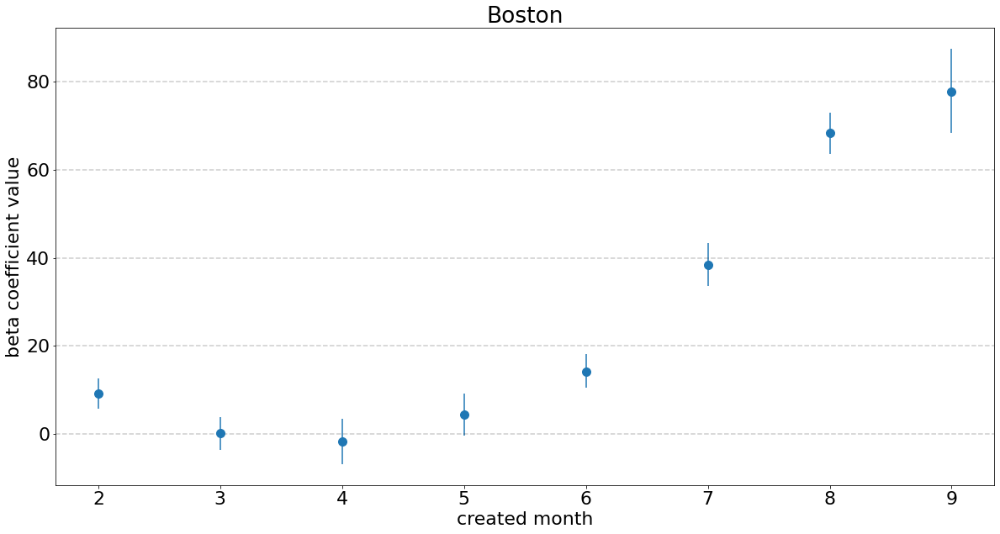

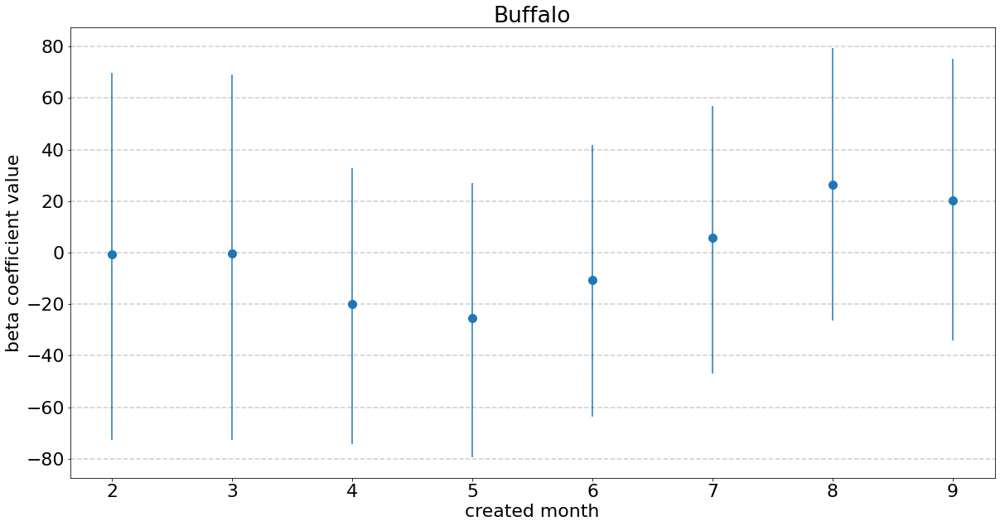

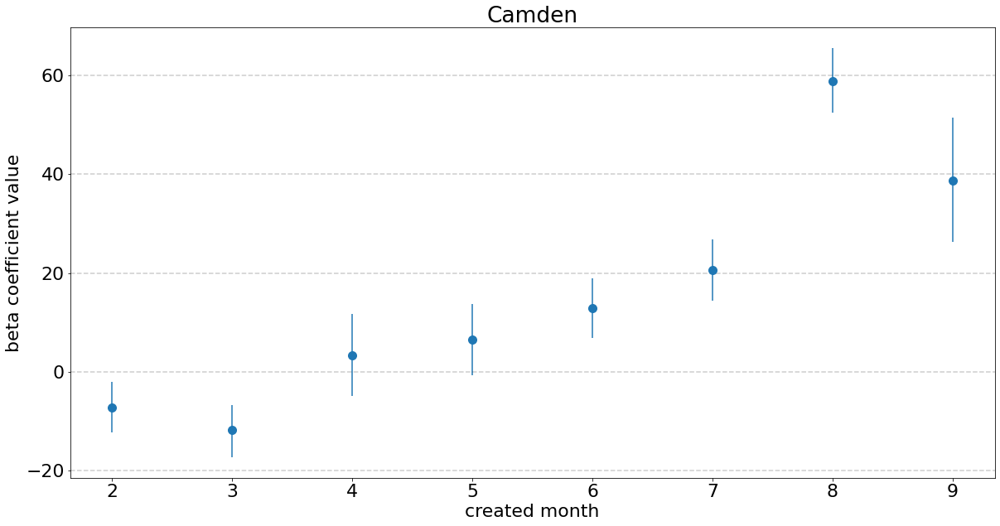

...

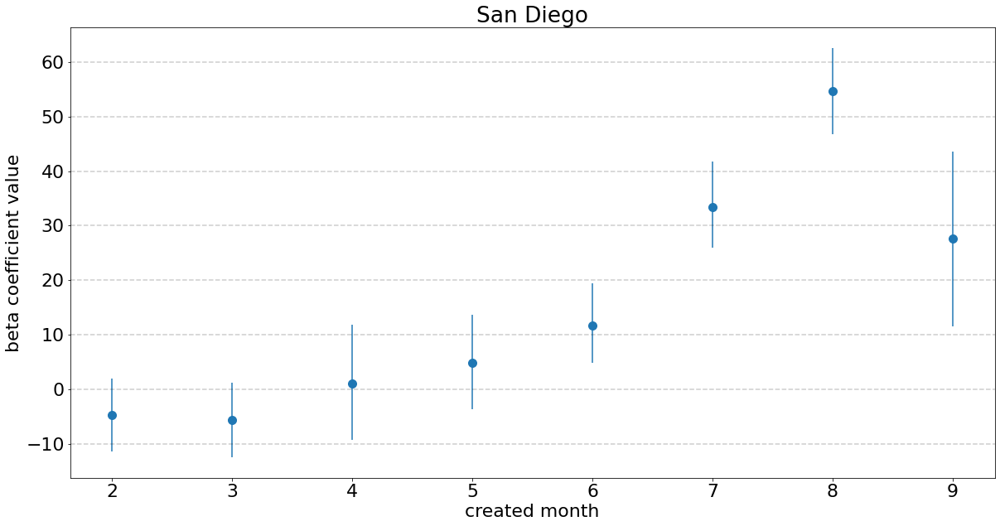

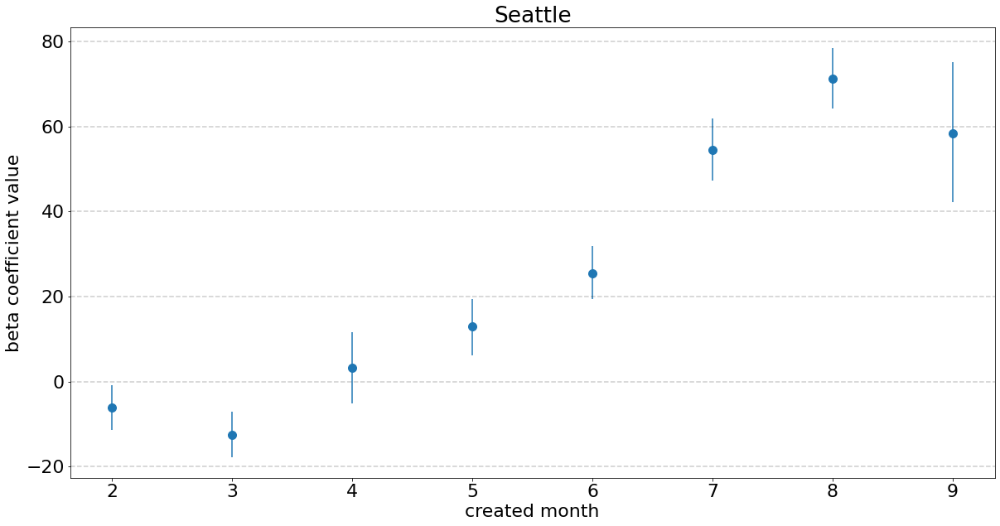

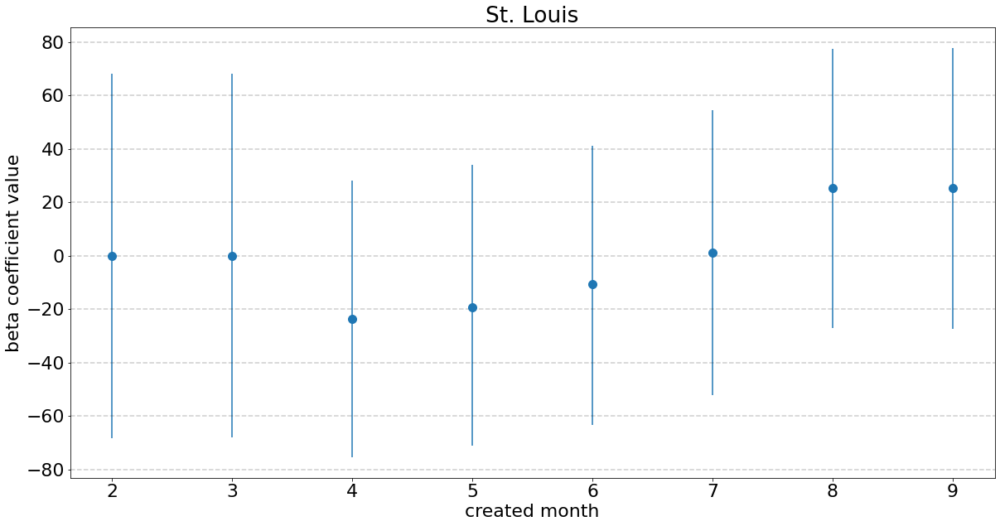

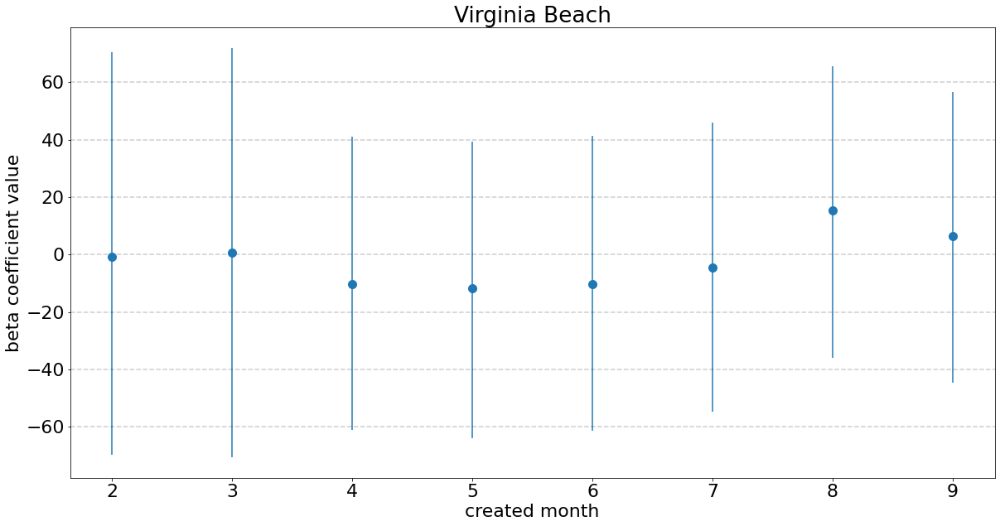

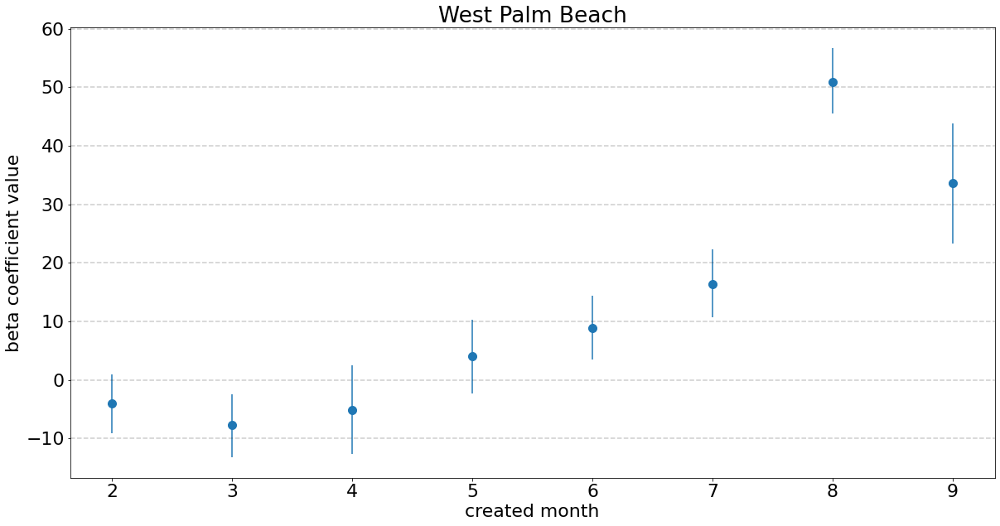

In [174]:
plot_effect_of_variables('b_created_month', 'created month')

In [175]:
d = {
    'redfin': 'Redfin',
    'none': 'other brokerage',
    'keller williams': 'Keller Williams',
    'berkshire hathaway': 'Berkshire Hathaway',
    'remax': 'RE/MAX',
    'century 21': 'Century 21',
    'coldwell banker': 'Coldwell Banker',
    'compass': 'Compass',
    'exp realty': 'EXp Realty'
}


brokerage_to_index_df2 = brokerage_to_index_df.copy()
brokerage_to_index_df2['processed_brokerage'].replace(d, inplace=True)
brokerage_to_index_df2 = brokerage_to_index_df2.sort_values('processed_brokerage').reset_index(drop=True)
brokerage_to_index_df2['processed_brokerage'].replace(
    {'other brokerage': 'Other brokerage', 'EXp Realty': 'eXp Realty'}, inplace=True)

number of Redfin listings: 136


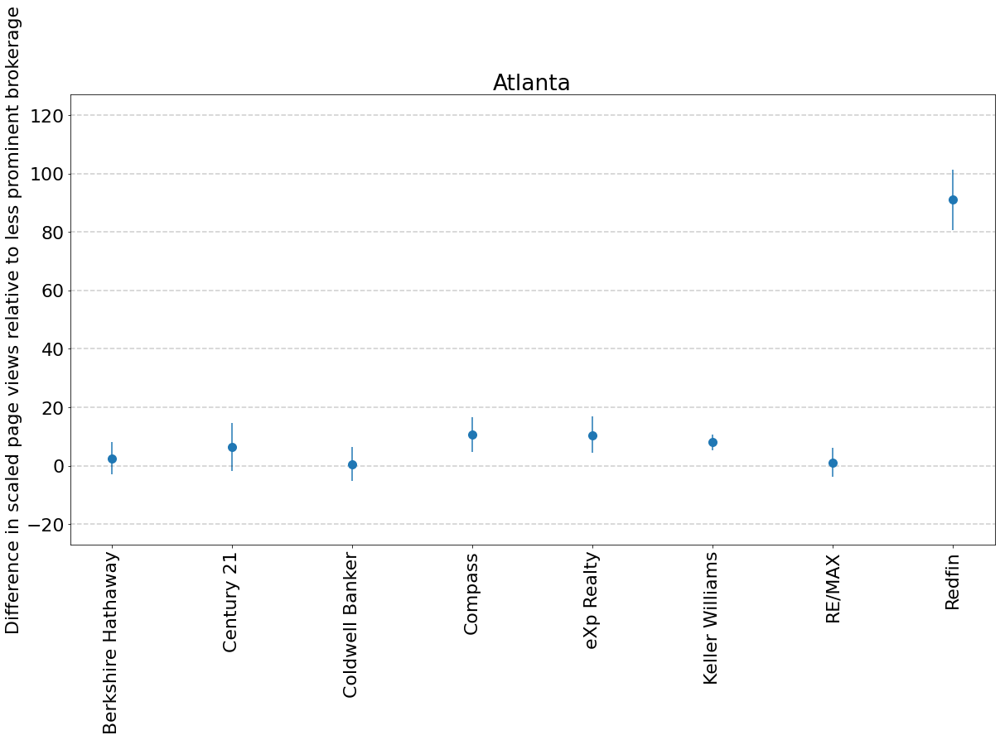

number of Redfin listings: 178


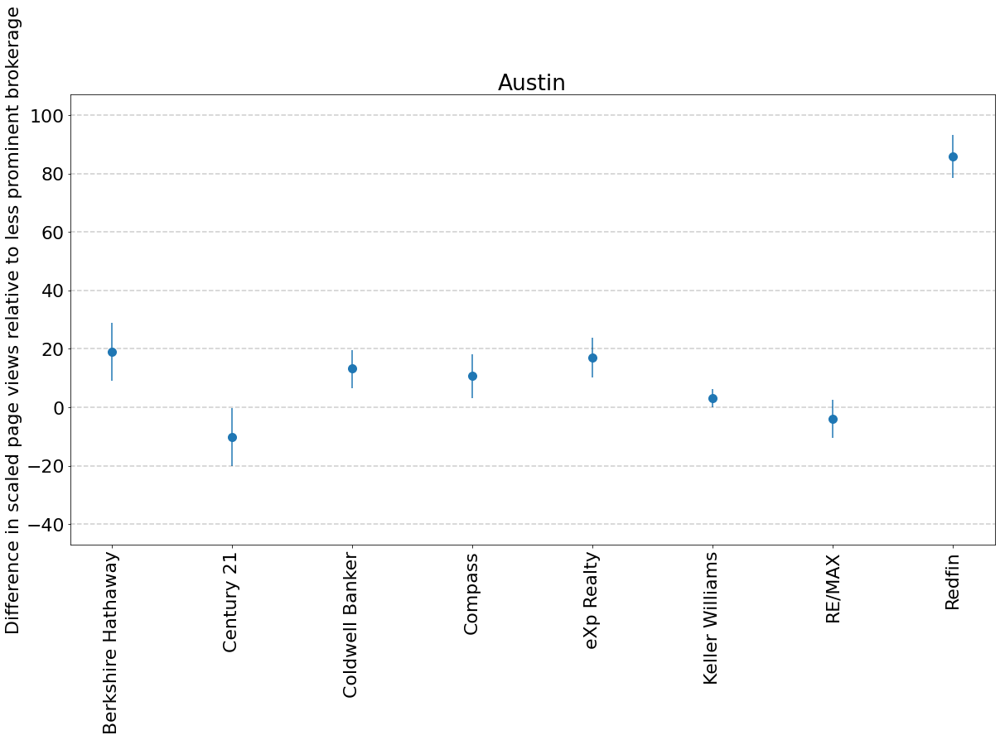

number of Redfin listings: 140


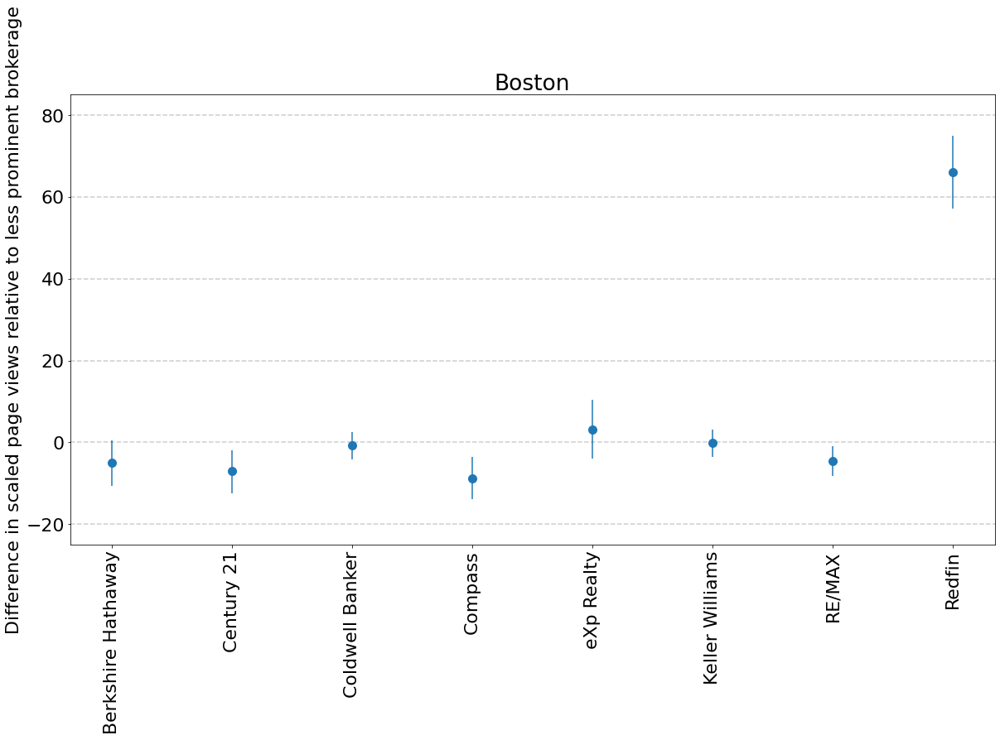

number of Redfin listings: 829


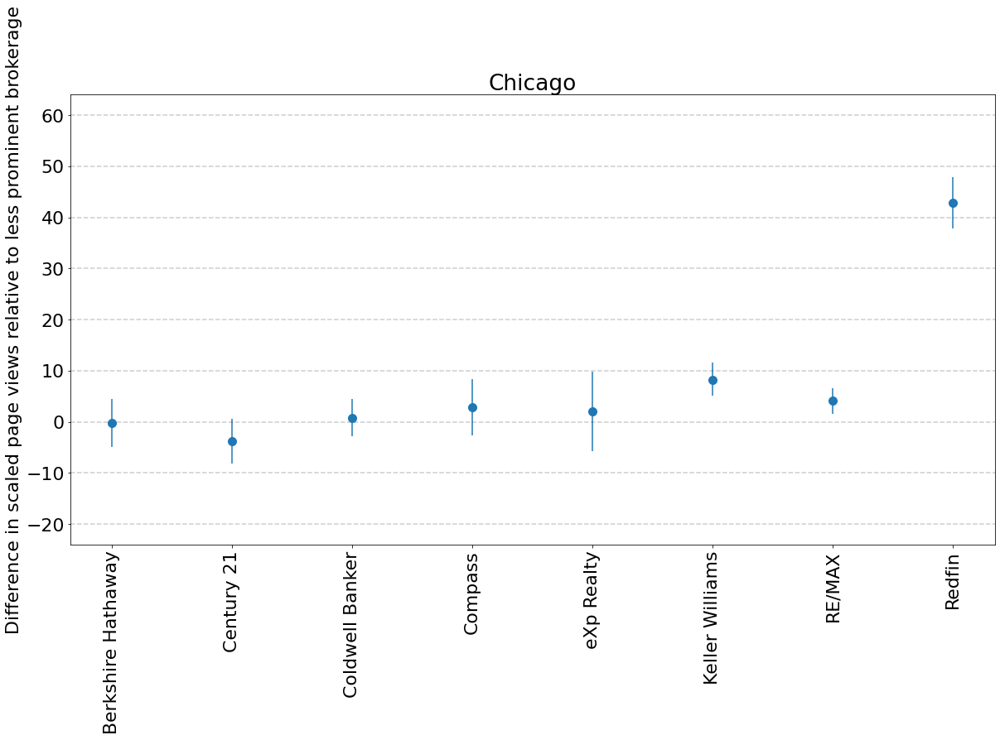

number of Redfin listings: 586


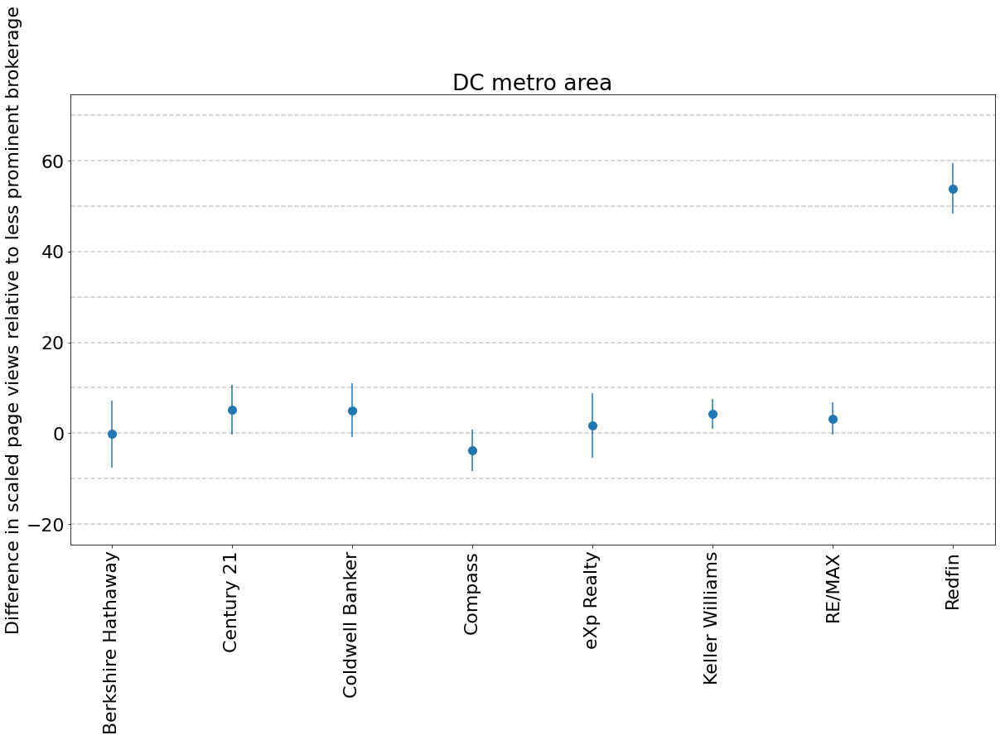

number of Redfin listings: 117


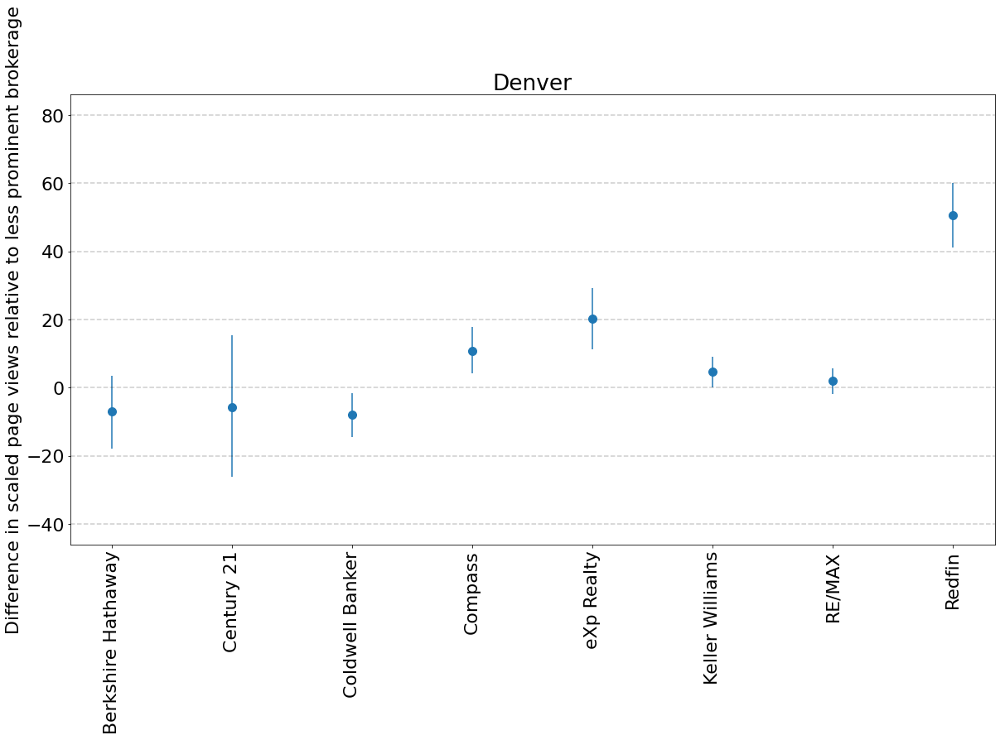

number of Redfin listings: 141


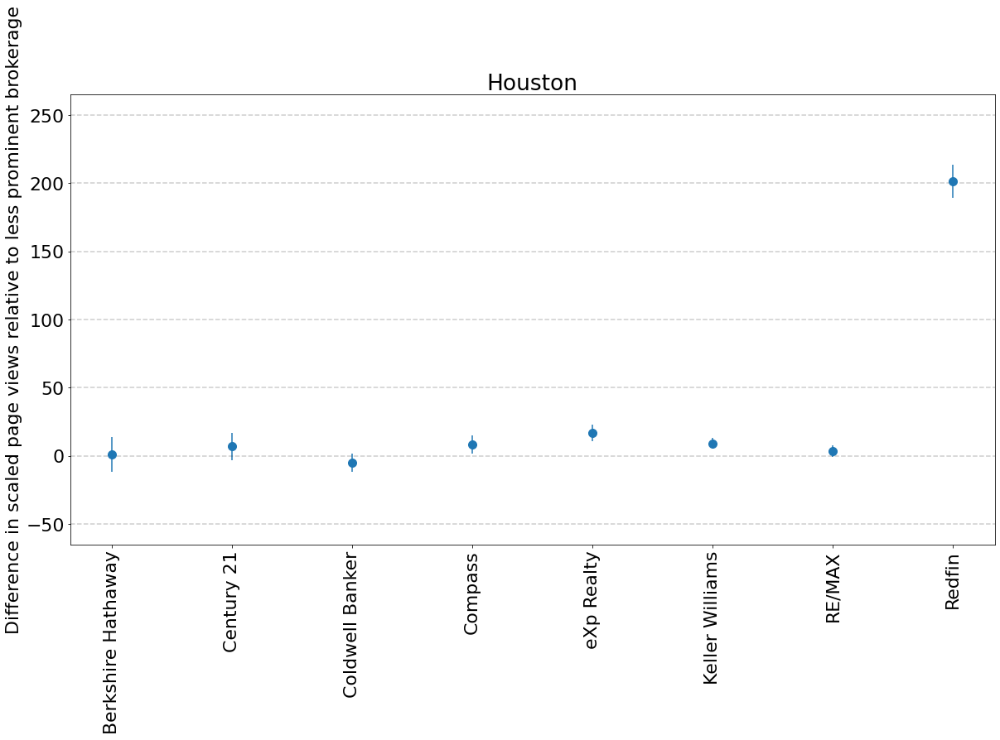

number of Redfin listings: 420


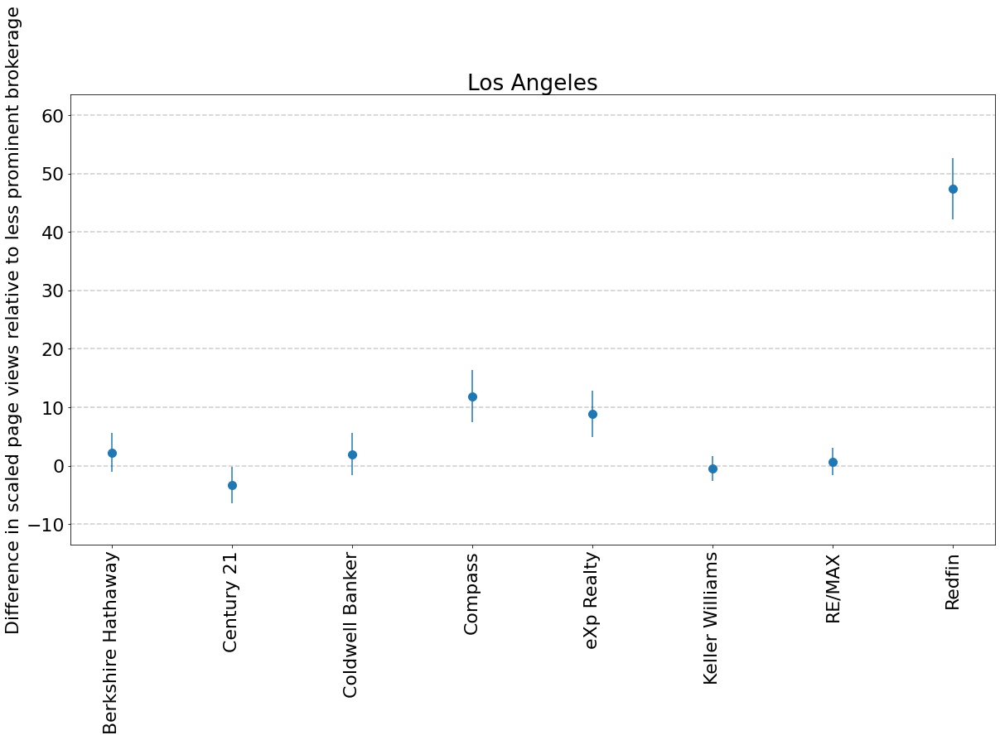

number of Redfin listings: 198


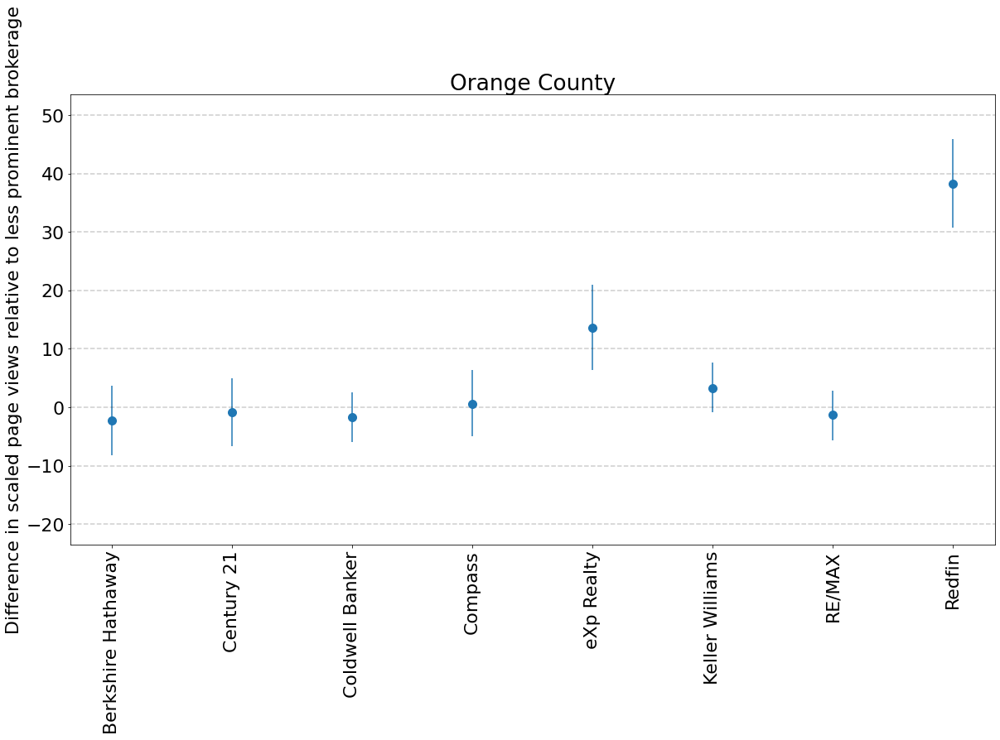

number of Redfin listings: 114


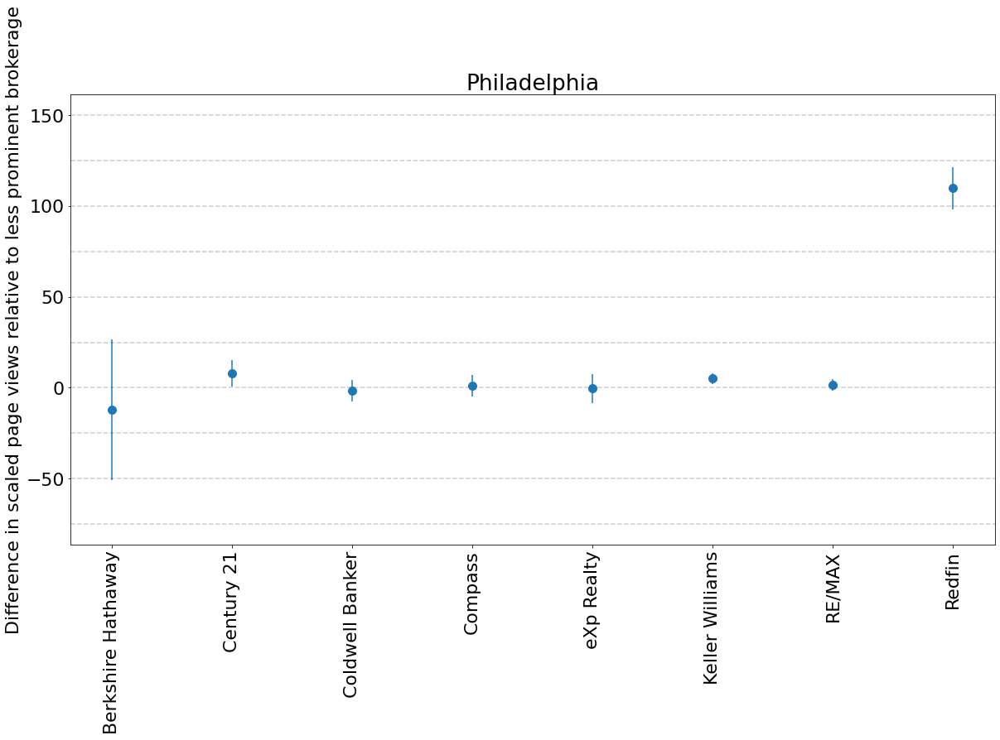

number of Redfin listings: 121


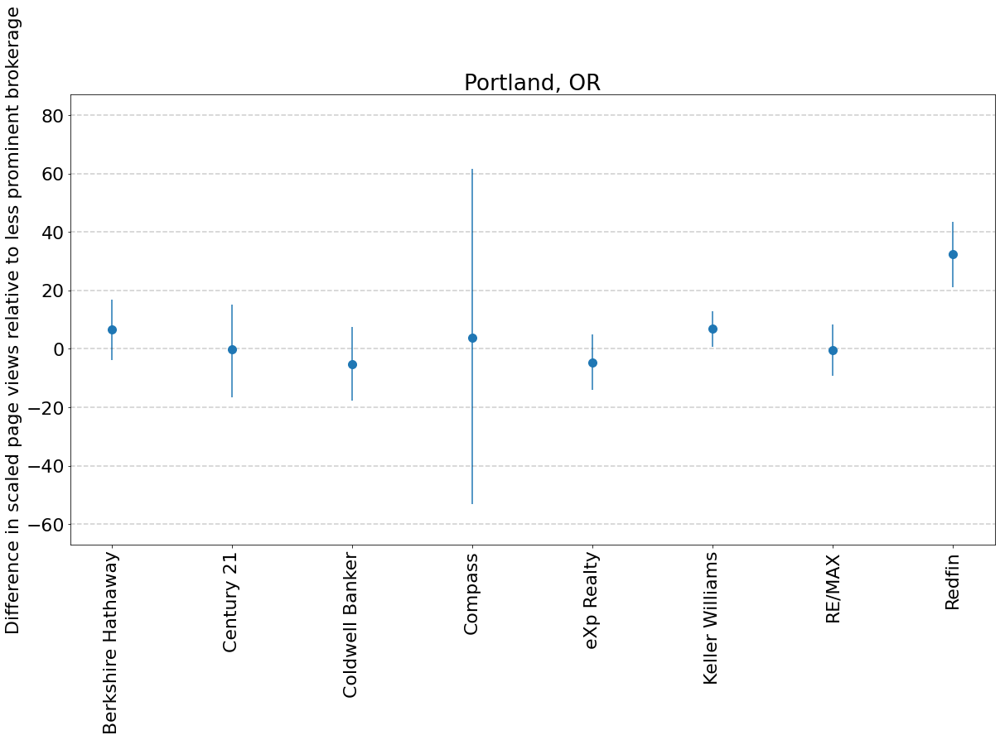

number of Redfin listings: 160


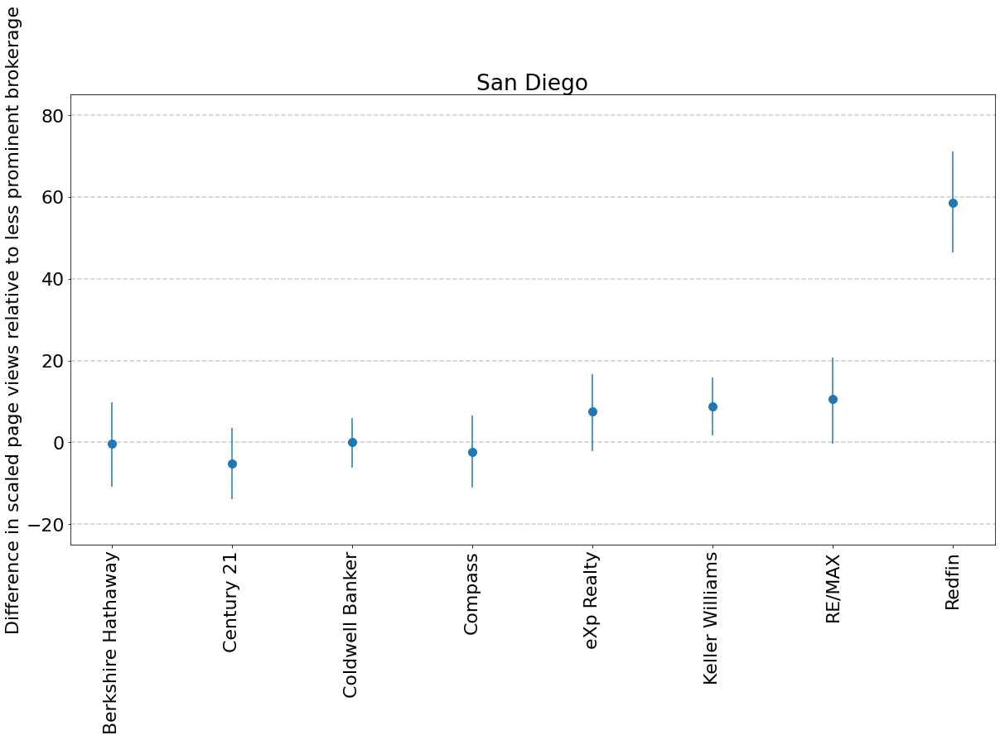

number of Redfin listings: 361


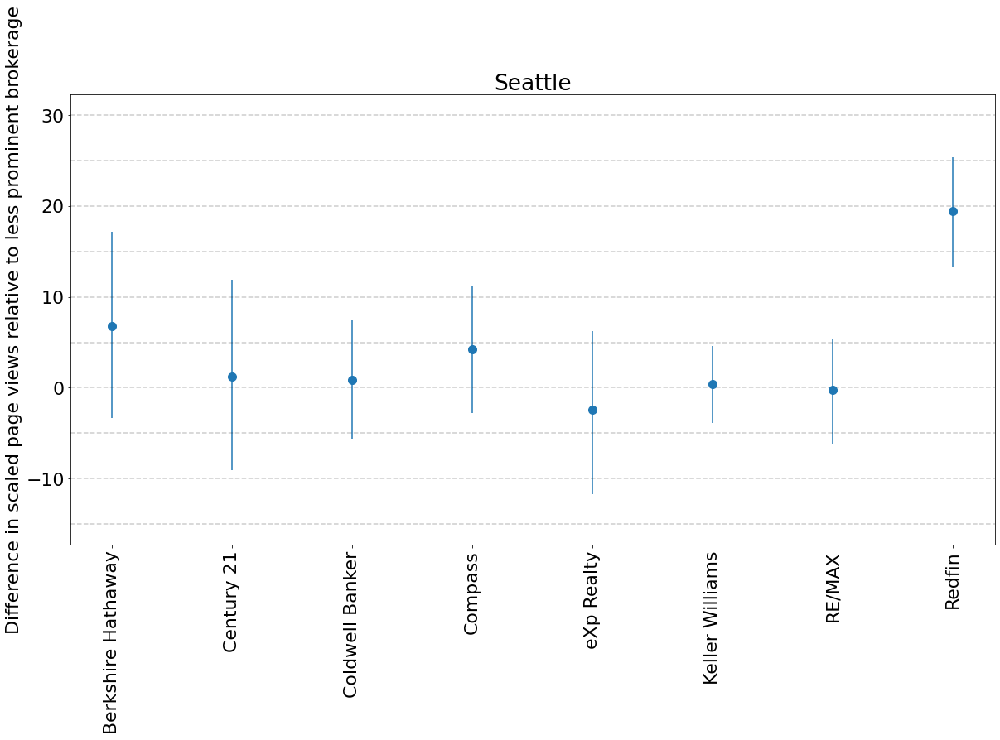

In [176]:
b_brokerage_mat = trace['b_brokerage']

other_brokerage_index = brokerage_to_index_df2[
        brokerage_to_index_df2['processed_brokerage'] == 'Other brokerage'].iloc[0]['brokerage_index']
    
for _, row in market_area_to_index_df.iterrows():
    market_area = row['market_area']
    market_area_index = row['market_area_index']
    b_samples = b_brokerage_mat[:, market_area_index, :]
    redfin_index = brokerage_to_index_df2[
        brokerage_to_index_df2['processed_brokerage'] == 'Redfin'].iloc[0]['brokerage_index']
    redfin_listings_df = model_df_final_f[(model_df_final_f['market_area'] == market_area) &
                                          (model_df_final_f['brokerage_index'] == redfin_index)]
    
    # ignore markets that have fewer than 100 Redfin listings
    if len(redfin_listings_df) < 100:
        continue
    print('number of Redfin listings:', len(redfin_listings_df))
    plt.figure(figsize=(20, 10))
    x_vals = []
    y_vals = []
    y_err = np.zeros((2, top_brokerage_vals - 1))
    for i in range(top_brokerage_vals - 1):
        idx = brokerage_to_index_df2.iloc[i]['brokerage_index']
        samples = b_samples[:, idx] - b_samples[:, other_brokerage_index]
        x_vals.append(i)
        sample_mean = np.mean(samples)
        y_vals.append(sample_mean)
        quantiles = np.quantile(samples, [alpha / 2, 1 - (alpha / 2)])
        errors = np.abs(quantiles - sample_mean)
        y_err[:, i] = errors

    plt.errorbar(x=x_vals, y=y_vals, yerr=y_err, capsize=0, marker='o', markersize=10, ls='none')
    plt.xticks(x_vals, brokerage_to_index_df2['processed_brokerage'][:-1], rotation=90)
    plt.ylabel('Difference in scaled page views relative to less prominent brokerage')
    plt.title(market_area)

    yticks = plt.yticks()[0]
    for ytick in yticks:
            plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)

    plt.show()